In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
from tqdm import tqdm
from scipy.stats import randint, uniform

from sklearn.model_selection import train_test_split, StratifiedKFold, GridSearchCV, cross_validate, RandomizedSearchCV, cross_val_score
from sklearn.linear_model import LinearRegression, Ridge, Lasso, LogisticRegression
from sklearn.metrics import make_scorer,root_mean_squared_error, mean_absolute_error, r2_score, accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve, auc, precision_recall_curve, average_precision_score, confusion_matrix
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier, GradientBoostingRegressor
from sklearn.feature_selection import SequentialFeatureSelector

from xgboost import XGBRegressor, XGBClassifier
from lightgbm import LGBMRegressor, LGBMClassifier

import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import shap
import plotly.graph_objects as go
import plotly.figure_factory as ff
import plotly.express as px

from IPython.display import Image


In [3]:
pd.set_option('display.max_columns', 100)
pd.set_option('display.width', 100)

## EDA

In [3]:
df = pd.read_csv('restaurant_data_modified.csv')
df.shape

(3689774, 4)

In [3]:
df

,order_id,client_id,order_date,order_sum
0,1,466,2022-01-01,492.0
1,2,156,2022-01-01,966.0
2,3,307,2022-01-01,76.0
3,4,65,2022-01-01,75.0
4,5,556,2022-01-01,836.0
...,...,...,...,...
3689769,3689770,396800,2023-12-31,151.0
3689770,3689771,298876,2023-12-31,115.0
3689771,3689772,353648,2023-12-31,482.0
3689772,3689773,37054,2023-12-31,370.0


In [4]:
df.dtypes

order_id        int64
client_id       int64
order_date     object
order_sum     float64
dtype: object

In [4]:
df['order_date'] = pd.to_datetime(df['order_date'])
df.dtypes

order_id               int64
client_id              int64
order_date    datetime64[ns]
order_sum            float64
dtype: object

In [6]:
pd.set_option('display.float_format', '{:.2f}'.format)
print(min(df['order_date']), max(df['order_date']))
df.describe()

2022-01-01 00:00:00 2023-12-31 00:00:00


,order_id,client_id,order_sum
count,3689774.00,3689774.00,3689774.00
mean,1844887.50,193923.73,389.02
std,1065146.15,141963.58,301.87
min,1.00,1.00,-9.00
25%,922444.25,67623.00,200.00
50%,1844887.50,169716.00,317.00
75%,2767330.75,303927.00,487.00
max,3689774.00,536180.00,22360.00


In [5]:
print(df.shape)
df = df[df['order_sum']>0]
df.shape

(3689774, 4)


(3680168, 4)

In [8]:
df.describe()

,order_id,client_id,order_sum
count,3680168.00,3680168.00,3680168.00
mean,1842080.30,193731.65,390.05
std,1064794.87,141908.54,301.59
min,1.00,1.00,1.00
25%,920047.75,67512.00,200.00
50%,1840270.50,169407.00,318.00
75%,2763763.25,303585.00,488.00
max,3689774.00,536180.00,22360.00


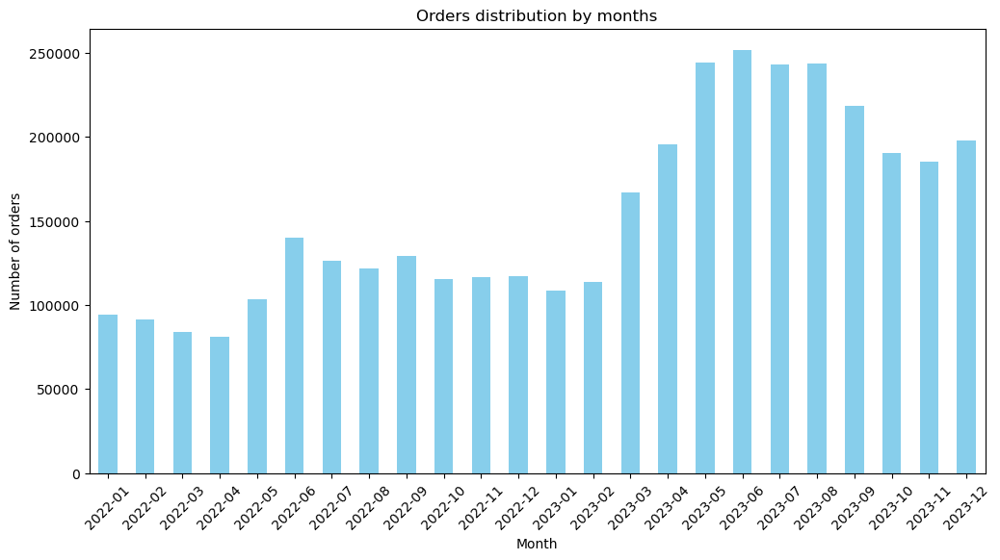

In [6]:
df['year_month'] = df['order_date'].dt.to_period('M')
orders_by_month = df.groupby('year_month')['order_id'].count()

plt.figure(figsize=(12, 6))
orders_by_month.plot(kind='bar', color='skyblue')
plt.title("Orders distribution by months")
plt.xlabel("Month")
plt.ylabel("Number of orders")
plt.xticks(rotation=45)
plt.show()

## Preparing features

In [ ]:
# Разбиваем транзакционные данные за два года на два периода: 
# 1. первый период 1,5 года - на нем посчитаем фичи для моделей; 
# 2. второй период полгода - на нем посчитаем целевые переменные и будем прогнозировать ltv

split_date = "2023-07-01"

df_train = df[df["order_date"] < split_date]

df_test = df[df["order_date"] >= split_date]

In [ ]:
# Подготовим df с фичами: 
# - r, f, m, avg_check, days_active, order_interval_mean
# - log_m, log_avg_check, 
# - f_1mon, f_3mon, f_6mon, f_12mon
# - m_1mon, m_3mon, m_6mon, m_12mon
# - log_m_1mon, log_m_3mon, log_m_6mon, log_m_12mon

df_clients_train = df_train.groupby('client_id').agg(
    r=('order_date', lambda x: (pd.to_datetime('2023-06-30') - x.max()).days),  
    f=('order_id', 'count'), 
    m=('order_sum', 'sum'),
    days_active=('order_date', lambda x: (x.max() - x.min()).days)
).reset_index()

In [31]:
df_clients_train['avg_check'] = df_clients_train['m'] / df_clients_train['f']

df_clients_train['log_m'] = np.log1p(df_clients_train['m'])
df_clients_train['log_avg_check'] = np.log1p(df_clients_train['avg_check'])

In [49]:
# Считаем средний интервал между заказами для каждого клиента

intervals = dict()

for client in tqdm(df_train['client_id'].unique()):
    dates = df_train[df_train['client_id'] == client]['order_date'].sort_values()
    if len(dates) < 2:
        mean_interval = np.nan
    else:
        diffs = dates.diff().dropna().dt.days
        mean_interval = diffs.mean()

    intervals[client] = mean_interval

100%|██████████| 412412/412412 [36:52<00:00, 186.39it/s] 


In [51]:
df_clients_train['order_interval_mean'] = df_clients_train['client_id'].map(intervals)
df_clients_train

,client_id,r,f,m,days_active,avg_check,log_m,log_avg_check,order_interval_mean
0,1,119,4,999.00,426,249.75,6.91,5.52,142.00
1,2,545,1,850.00,0,850.00,6.75,6.75,NaN
2,3,545,1,582.00,0,582.00,6.37,6.37,NaN
3,4,386,3,1303.00,159,434.33,7.17,6.08,79.50
4,5,441,5,1063.00,104,212.60,6.97,5.36,26.00
...,...,...,...,...,...,...,...,...,...
412407,412446,0,1,153.00,0,153.00,5.04,5.04,NaN
412408,412447,0,1,977.00,0,977.00,6.89,6.89,NaN
412409,412448,0,1,731.00,0,731.00,6.60,6.60,NaN
412410,412449,0,1,253.00,0,253.00,5.54,5.54,NaN


In [54]:
# Добавляем бинарный признак: у клиента только один заказ
df_clients_train['one_order_client'] = df_clients_train['order_interval_mean'].isna().astype(int)
df_clients_train

,client_id,r,f,m,days_active,avg_check,log_m,log_avg_check,order_interval_mean,one_order_client
0,1,119,4,999.00,426,249.75,6.91,5.52,142.00,0
1,2,545,1,850.00,0,850.00,6.75,6.75,NaN,1
2,3,545,1,582.00,0,582.00,6.37,6.37,NaN,1
3,4,386,3,1303.00,159,434.33,7.17,6.08,79.50,0
4,5,441,5,1063.00,104,212.60,6.97,5.36,26.00,0
...,...,...,...,...,...,...,...,...,...,...
412407,412446,0,1,153.00,0,153.00,5.04,5.04,NaN,1
412408,412447,0,1,977.00,0,977.00,6.89,6.89,NaN,1
412409,412448,0,1,731.00,0,731.00,6.60,6.60,NaN,1
412410,412449,0,1,253.00,0,253.00,5.54,5.54,NaN,1


In [ ]:
# Добавляем фичи:
# - f_1mon, f_3mon, f_6mon, f_12mon
# - m_1mon, m_3mon, m_6mon, m_12mon
# - log_m_1mon, log_m_3mon, log_m_6mon, log_m_12mon

df_clients_train_1mon = df_train[df_train['order_date'] >= pd.to_datetime('2023-06-01')].groupby('client_id').agg( 
    f_1mon=('order_id', 'count'), 
    m_1mon=('order_sum', 'sum')
).reset_index()

df_clients_train_1mon['log_m_1mon'] = np.log1p(df_clients_train_1mon['m_1mon'])


df_clients_train_3mon = df_train[df_train['order_date'] >= pd.to_datetime('2023-04-01')].groupby('client_id').agg( 
    f_3mon=('order_id', 'count'), 
    m_3mon=('order_sum', 'sum')
).reset_index()

df_clients_train_3mon['log_m_3mon'] = np.log1p(df_clients_train_3mon['m_3mon'])


df_clients_train_6mon = df_train[df_train['order_date'] >= pd.to_datetime('2023-01-01')].groupby('client_id').agg( 
    f_6mon=('order_id', 'count'), 
    m_6mon=('order_sum', 'sum')
).reset_index()

df_clients_train_6mon['log_m_6mon'] = np.log1p(df_clients_train_6mon['m_6mon'])


df_clients_train_12mon = df_train[df_train['order_date'] >= pd.to_datetime('2022-07-01')].groupby('client_id').agg( 
    f_12mon=('order_id', 'count'), 
    m_12mon=('order_sum', 'sum')
).reset_index()

df_clients_train_12mon['log_m_12mon'] = np.log1p(df_clients_train_12mon['m_12mon'])

print(df_clients_train_1mon.shape, df_clients_train_3mon.shape, df_clients_train_6mon.shape, df_clients_train_12mon.shape)
df_clients_train_1mon

(111886, 4) (192539, 4) (240990, 4) (328648, 4)


,client_id,f_1mon,m_1mon,log_m_1mon
0,6,3,1741.00,7.46
1,13,1,468.00,6.15
2,15,1,511.00,6.24
3,16,1,269.00,5.60
4,17,2,328.00,5.80
...,...,...,...,...
111881,412446,1,153.00,5.04
111882,412447,1,977.00,6.89
111883,412448,1,731.00,6.60
111884,412449,1,253.00,5.54


In [ ]:
df_clients_train = df_clients_train.merge(df_clients_train_1mon, on='client_id', how='left')
df_clients_train = df_clients_train.merge(df_clients_train_3mon, on='client_id', how='left')
df_clients_train = df_clients_train.merge(df_clients_train_6mon, on='client_id', how='left')
df_clients_train = df_clients_train.merge(df_clients_train_12mon, on='client_id', how='left')

cols_to_fill = [
    'f_1mon', 'f_3mon', 'f_6mon', 'f_12mon',
    'm_1mon', 'm_3mon', 'm_6mon', 'm_12mon',
    'log_m_1mon', 'log_m_3mon', 'log_m_6mon', 'log_m_12mon'
]

df_clients_train[cols_to_fill] = df_clients_train[cols_to_fill].fillna(0)

print(df_clients_train.columns)
df_clients_train

,client_id,r,f,m,days_active,avg_check,log_m,log_avg_check,order_interval_mean,one_order_client,...,log_m_1mon,f_3mon,m_3mon,log_m_3mon,f_6mon,m_6mon,log_m_6mon,f_12mon,m_12mon,log_m_12mon
0,1,119,4,999.00,426,249.75,6.91,5.52,142.00,0,...,0.00,0.00,0.00,0.00,3.00,612.00,6.42,3.00,612.00,6.42
1,2,545,1,850.00,0,850.00,6.75,6.75,NaN,1,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
2,3,545,1,582.00,0,582.00,6.37,6.37,NaN,1,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
3,4,386,3,1303.00,159,434.33,7.17,6.08,79.50,0,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
4,5,441,5,1063.00,104,212.60,6.97,5.36,26.00,0,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
412407,412446,0,1,153.00,0,153.00,5.04,5.04,NaN,1,...,5.04,1.00,153.00,5.04,1.00,153.00,5.04,1.00,153.00,5.04
412408,412447,0,1,977.00,0,977.00,6.89,6.89,NaN,1,...,6.89,1.00,977.00,6.89,1.00,977.00,6.89,1.00,977.00,6.89
412409,412448,0,1,731.00,0,731.00,6.60,6.60,NaN,1,...,6.60,1.00,731.00,6.60,1.00,731.00,6.60,1.00,731.00,6.60
412410,412449,0,1,253.00,0,253.00,5.54,5.54,NaN,1,...,5.54,1.00,253.00,5.54,1.00,253.00,5.54,1.00,253.00,5.54


In [ ]:
# Добавим целевые переменные на тестовом периоде
df_target = df_test.groupby('client_id').agg(
    ltv_monetary=('order_sum', 'sum')
).reset_index()

df_target['ltv_response'] = 1  

df_clients_train = df_clients_train.merge(df_target, on='client_id', how='left')

df_clients_train['ltv_monetary'] = df_clients_train['ltv_monetary'].fillna(0)
df_clients_train['ltv_response'] = df_clients_train['ltv_response'].fillna(0).astype(int)

print(df_clients_train.columns)
df_clients_train

Index(['client_id', 'r', 'f', 'm', 'days_active', 'avg_check', 'log_m',
       'log_avg_check', 'order_interval_mean', 'one_order_client', 'f_1mon',
       'm_1mon', 'log_m_1mon', 'f_3mon', 'm_3mon', 'log_m_3mon', 'f_6mon',
       'm_6mon', 'log_m_6mon', 'f_12mon', 'm_12mon', 'log_m_12mon',
       'ltv_monetary', 'ltv_response'],
      dtype='object')


,client_id,r,f,m,days_active,avg_check,log_m,log_avg_check,order_interval_mean,one_order_client,...,m_3mon,log_m_3mon,f_6mon,m_6mon,log_m_6mon,f_12mon,m_12mon,log_m_12mon,ltv_monetary,ltv_response
0,1,119,4,999.00,426,249.75,6.91,5.52,142.00,0,...,0.00,0.00,3.00,612.00,6.42,3.00,612.00,6.42,0.00,0
1,2,545,1,850.00,0,850.00,6.75,6.75,NaN,1,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0
2,3,545,1,582.00,0,582.00,6.37,6.37,NaN,1,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,622.00,1
3,4,386,3,1303.00,159,434.33,7.17,6.08,79.50,0,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0
4,5,441,5,1063.00,104,212.60,6.97,5.36,26.00,0,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
412407,412446,0,1,153.00,0,153.00,5.04,5.04,NaN,1,...,153.00,5.04,1.00,153.00,5.04,1.00,153.00,5.04,0.00,0
412408,412447,0,1,977.00,0,977.00,6.89,6.89,NaN,1,...,977.00,6.89,1.00,977.00,6.89,1.00,977.00,6.89,0.00,0
412409,412448,0,1,731.00,0,731.00,6.60,6.60,NaN,1,...,731.00,6.60,1.00,731.00,6.60,1.00,731.00,6.60,0.00,0
412410,412449,0,1,253.00,0,253.00,5.54,5.54,NaN,1,...,253.00,5.54,1.00,253.00,5.54,1.00,253.00,5.54,944.00,1


In [80]:
df_clients_train.describe()

,client_id,r,f,m,days_active,avg_check,log_m,log_avg_check,order_interval_mean,one_order_client,f_1mon,m_1mon,log_m_1mon,f_3mon,m_3mon,log_m_3mon,f_6mon,m_6mon,log_m_6mon,f_12mon,m_12mon,log_m_12mon,ltv_monetary,ltv_response
count,412412.00,412412.00,412412.00,412412.00,412412.00,412412.00,412412.00,412412.00,243902.00,412412.00,412412.00,412412.00,412412.00,412412.00,412412.00,412412.00,412412.00,412412.00,412412.00,412412.00,412412.00,412412.00,412412.00,412412.00
mean,206212.12,180.85,5.82,2237.16,117.56,473.47,6.99,5.99,50.63,0.41,0.61,227.80,1.73,1.68,626.72,3.14,2.62,995.13,4.01,4.38,1670.66,5.56,897.07,0.39
std,119060.17,172.94,11.39,3924.44,163.35,311.76,1.15,0.58,69.96,0.49,1.58,663.64,2.87,3.84,1360.73,3.42,5.79,2036.42,3.48,9.24,3237.81,2.98,2487.12,0.49
min,1.00,0.00,1.00,1.00,0.00,1.00,0.69,0.69,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
25%,103103.75,25.00,1.00,472.00,0.00,275.67,6.16,5.62,10.50,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,208.00,5.34,0.00,0.00
50%,206207.50,109.00,2.00,964.00,16.00,393.00,6.87,5.98,26.14,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,324.00,5.78,1.00,683.00,6.53,0.00,0.00
75%,309316.25,330.00,6.00,2310.00,210.00,588.00,7.75,6.38,60.33,1.00,1.00,190.00,5.25,2.00,729.00,6.59,3.00,1098.00,7.00,4.00,1743.00,7.46,833.00,1.00
max,412450.00,545.00,801.00,441932.00,545.00,15324.00,13.00,9.64,544.00,1.00,88.00,214439.00,12.28,360.00,214439.00,12.28,360.00,214439.00,12.28,693.00,441932.00,13.00,593716.00,1.00


In [ ]:
# Сохраняем фичи 
df_clients_train.to_csv('train_features.csv', index=False)

## Data Splitting and Model Input Preparation

In [4]:
df_clients_train = pd.read_csv('train_features.csv')

In [5]:
# Убираем выбросы по f и m 
print(df_clients_train.shape)

f_95 = df_clients_train['f'].quantile(0.95)
m_95 = df_clients_train['m'].quantile(0.95)
df_clients_train = df_clients_train[(df_clients_train['f'] <= f_95) & (df_clients_train['m'] <= m_95)]

print(df_clients_train.shape)
df_clients_train.describe()

(412412, 24)


(386383, 24)


,client_id,r,f,m,days_active,avg_check,log_m,log_avg_check,order_interval_mean,one_order_client,f_1mon,m_1mon,log_m_1mon,f_3mon,m_3mon,log_m_3mon,f_6mon,m_6mon,log_m_6mon,f_12mon,m_12mon,log_m_12mon,ltv_monetary,ltv_response
count,386383.000000,386383.000000,386383.000000,386383.000000,386383.000000,386383.000000,386383.000000,386383.000000,217877.000000,386383.000000,386383.000000,386383.000000,386383.000000,386383.000000,386383.000000,386383.000000,386383.000000,386383.000000,386383.000000,386383.000000,386383.000000,386383.000000,386383.000000,386383.000000
mean,212494.577409,190.321989,3.651416,1485.619209,99.206583,477.025131,6.830428,5.999460,55.003295,0.436111,0.448739,172.224412,1.520492,1.163012,449.915625,2.883653,1.712361,677.512106,3.754607,2.704542,1088.233279,5.325818,672.134594,0.360588
std,118093.213852,173.589104,4.172310,1563.436769,148.361119,308.814036,0.991944,0.585933,72.725339,0.495902,1.098220,424.715249,2.716990,2.198173,821.915878,3.309604,2.846609,1071.055482,3.393127,3.644597,1370.171028,2.923330,1671.947023,0.480172
min,1.000000,0.000000,1.000000,1.000000,0.000000,1.000000,0.693147,0.693147,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,111535.500000,30.000000,1.000000,448.000000,0.000000,277.500000,6.107023,5.629418,11.800000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,182.000000,5.209486,0.000000,0.000000
50%,214612.000000,130.000000,2.000000,880.000000,7.000000,396.888889,6.781058,5.986173,30.375000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,259.000000,5.560682,1.000000,612.000000,6.418365,0.000000,0.000000
75%,315255.500000,341.000000,4.000000,1894.000000,158.000000,594.000000,7.546974,6.388561,67.000000,1.000000,0.000000,0.000000,0.000000,1.000000,607.000000,6.410175,2.000000,908.000000,6.812345,3.000000,1425.000000,7.262629,638.000000,1.000000
max,412450.000000,545.000000,23.000000,8532.000000,545.000000,7812.000000,9.051696,8.963544,544.000000,1.000000,22.000000,8325.000000,9.027138,23.000000,8531.000000,9.051579,23.000000,8531.000000,9.051579,23.000000,8531.000000,9.051579,82951.000000,1.000000


In [6]:
# Заменяем для переменной order_interval_mean NaN на медианные значения для клиентов с одним заказом
median_interval = df_clients_train['order_interval_mean'].median()
df_clients_train['order_interval_mean'] = df_clients_train['order_interval_mean'].fillna(median_interval)

df_clients_train.describe()['order_interval_mean']

count    386383.000000
mean         44.262617
std          55.960253
min           0.000000
25%          25.650000
50%          30.375000
75%          36.000000
max         544.000000
Name: order_interval_mean, dtype: float64

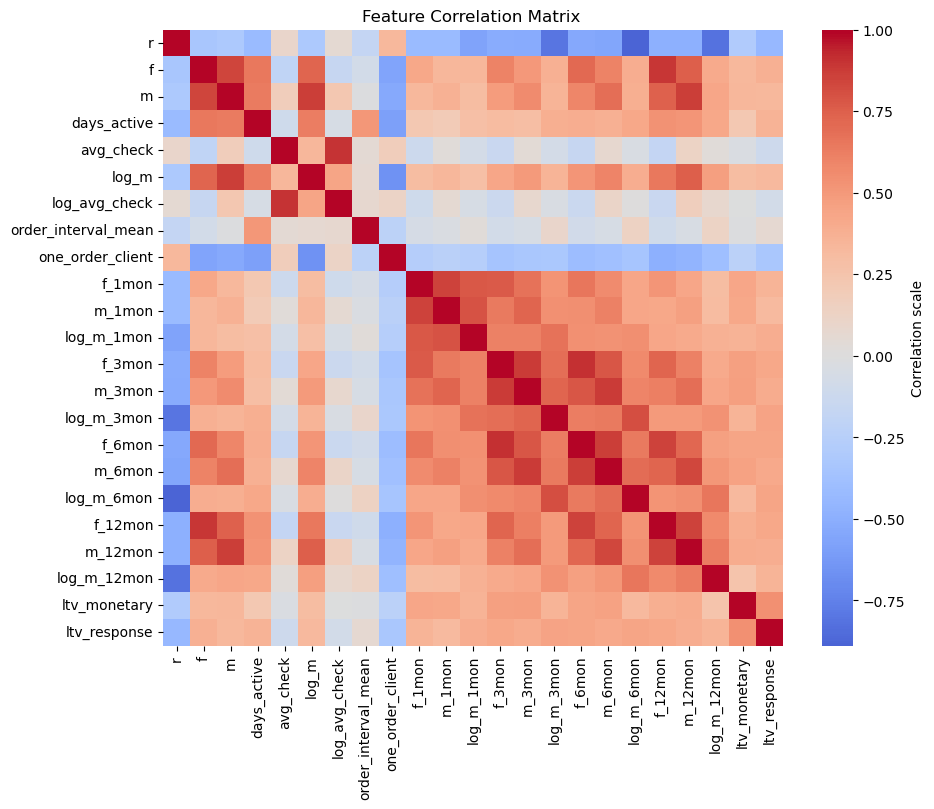

In [ ]:
features = [col for col in df_clients_train.columns if col not in ['client_id']]

corr_matrix = df_clients_train[features].corr()

plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, 
            cmap='coolwarm', center=0, annot=False, fmt=".2f", 
            cbar_kws={'label': 'Correlation scale'})
plt.title("Feature Correlation Matrix ")
plt.show()

In [7]:
# Разбиение итогового датафрейма с фичами на train и test 
train_df, test_df = train_test_split(df_clients_train, test_size=0.2, random_state=42)

train_df.shape, test_df.shape

((309106, 24), (77277, 24))

In [8]:
# Выделение X и y
feature_cols = [col for col in df_clients_train.columns if col not in ['client_id', 'ltv_monetary', 'ltv_response']]

X_train = train_df[feature_cols]
X_test = test_df[feature_cols]

y_train_monetary = train_df['ltv_monetary']
y_test_monetary = test_df['ltv_monetary']

y_train_response = train_df['ltv_response']
y_test_response = test_df['ltv_response']

# сохраняем client_id отдельно
train_client_ids = train_df['client_id'].reset_index(drop=True)
test_client_ids = test_df['client_id'].reset_index(drop=True)

In [9]:
# Выбираем для этапа сравнения моделей между собой базовый набор фичей
# Остальные будем использовать для подбора оптимального набора фичей на нескольких моделях, которые проявят себя лучше всего на первом этапе

base_features = [
    'r', 'f', 'm', 'avg_check', 'days_active', 'order_interval_mean',
    'log_m', 'log_avg_check',
    'f_6mon', 'm_6mon', 'log_m_6mon'
]


X_train_base = X_train[base_features]
X_test_base = X_test[base_features]

In [10]:
X_base = df_clients_train[base_features]
y_monetary = df_clients_train['ltv_monetary']
y_response = df_clients_train['ltv_response']

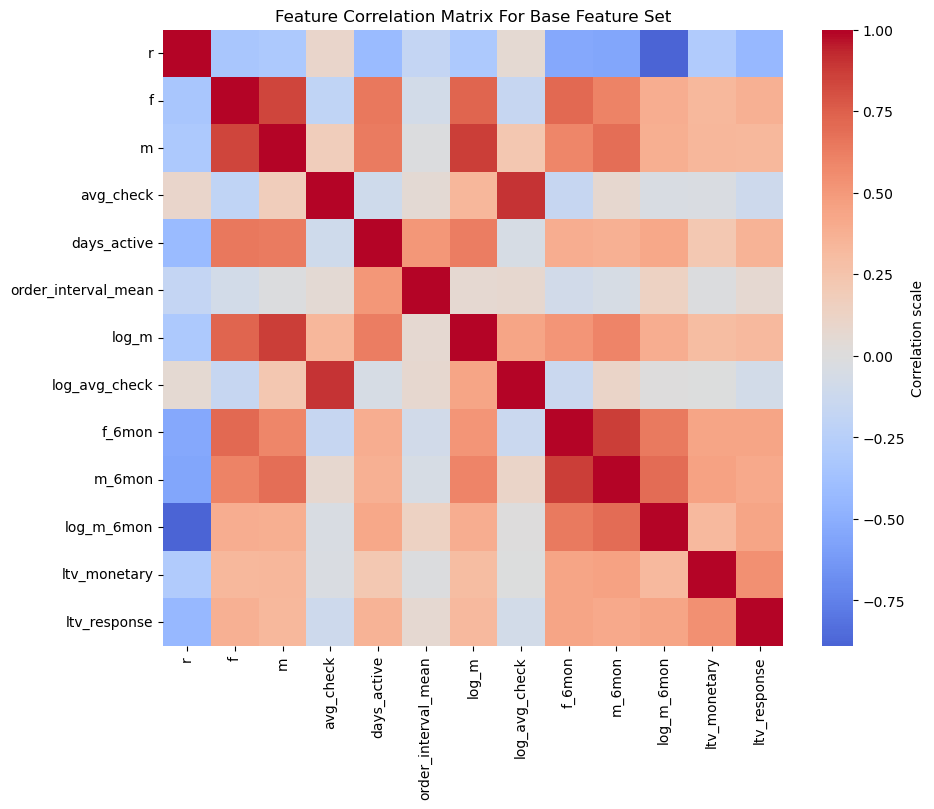

In [27]:

corr_matrix = df_clients_train[base_features + ['ltv_monetary', 'ltv_response']].corr()

plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, 
            cmap='coolwarm', center=0, annot=False, fmt=".2f", 
            cbar_kws={'label': 'Correlation scale'})
plt.title("Feature Correlation Matrix For Base Feature Set")
plt.show()

## Modeling LTV Monetary 

In [11]:
# Функция для подсчета метрик эффективности модели (MAE, RMSE, R^2) 

def print_regression_metrics(y_true, y_pred, dataset_name):
    print(f"Метрики для {dataset_name}:")
    print(f"MAE:  {mean_absolute_error(y_true, y_pred):.2f}")
    print(f"RMSE: {root_mean_squared_error(y_true, y_pred):.2f}")
    print(f"R^2:  {r2_score(y_true, y_pred):.4f}")
    print("-" * 40)

In [12]:
reg_results = pd.DataFrame(columns=[
    'Model', 'MAE (Test)', 'RMSE (Test)', 'R^2 (Test)'
])

def add_reg_results(model_name, y_true, y_pred):
    global reg_results  
    
    new_row = {
        'Model': model_name,
        'MAE (Test)': mean_absolute_error(y_true, y_pred),
        'RMSE (Test)': root_mean_squared_error(y_true, y_pred),
        'R^2 (Test)': r2_score(y_true, y_pred)
    }
    
    reg_results = pd.concat(
        [reg_results, pd.DataFrame([new_row])],
        ignore_index=True
    )

In [57]:
reg_cv_results = pd.DataFrame()

def add_cv_results(cv_results, model_name):
    summary = pd.DataFrame([{
        'Model': model_name,
        'MAE_mean': np.mean(cv_results['test_mae']),
        'MAE_std': np.std(cv_results['test_mae']),
        'RMSE_mean': np.mean(cv_results['test_rmse']),
        'RMSE_std': np.std(cv_results['test_rmse']),
        'R2_mean': np.mean(cv_results['test_r2']),
        'R2_std': np.std(cv_results['test_r2'])
    }])
    global reg_cv_results
    reg_cv_results = pd.concat([reg_cv_results, summary], ignore_index=True)

In [63]:
scoring = {
    'mae': make_scorer(mean_absolute_error),
    'rmse': make_scorer(root_mean_squared_error),
    'r2': make_scorer(r2_score)
}

#### Linear Regression

In [30]:
reg_model_linreg = LinearRegression()
reg_model_linreg.fit(X_train_base, y_train_monetary)

LinearRegression()

In [31]:
y_pred_train = reg_model_linreg.predict(X_train_base)
y_pred_test = reg_model_linreg.predict(X_test_base)

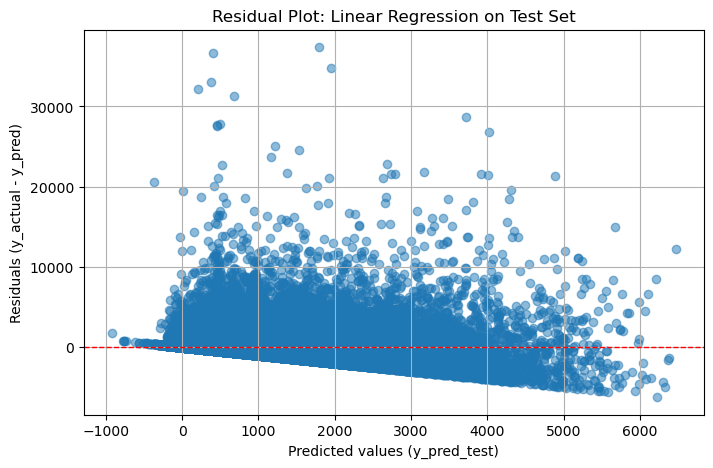

In [32]:
# График остатков

residuals_test = y_test_monetary - y_pred_test

plt.figure(figsize=(8, 5))
plt.scatter(y_pred_test, residuals_test, alpha=0.5)
plt.axhline(0, color='red', linestyle='--', linewidth=1)
plt.xlabel('Predicted values (y_pred_test)')
plt.ylabel('Residuals (y_actual - y_pred)')
plt.title('Residual Plot: Linear Regression on Test Set')
plt.grid(True)
plt.show()

In [117]:
print_regression_metrics(y_train_monetary, y_pred_train, "Train (Linear Regression)")
print_regression_metrics(y_test_monetary, y_pred_test, "Test (Linear Regression)")

Метрики для Train (Linear Regression):
MAE:  723.59
RMSE: 1474.90
R^2:  0.2260
----------------------------------------
Метрики для Test (Linear Regression):
MAE:  719.35
RMSE: 1456.35
R^2:  0.2244
----------------------------------------


In [118]:
add_reg_results(
    model_name="Linear Regression",
    y_true=y_test_monetary,
    y_pred=y_pred_test
)

reg_results

C:\Users\demid.zhivonos\AppData\Local\Temp\ipykernel_22808\719481401.py:15: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  reg_results = pd.concat(


,Model,MAE (Test),RMSE (Test),R^2 (Test)
0,Linear Regression,719.350904,1456.349764,0.22443


In [ ]:
# CV

In [59]:
reg_model_linreg = LinearRegression()

cv_results = cross_validate(
    reg_model_linreg,
    X_base,
    y_monetary,
    cv=5,
    scoring=scoring,
    return_train_score=False
)

In [60]:
df_cv = pd.DataFrame(cv_results)[['test_mae', 'test_rmse', 'test_r2']]
df_cv.loc['Mean'] = df_cv.mean()
df_cv.loc['Std'] = df_cv.std()

df_cv

,test_mae,test_rmse,test_r2
0,628.039898,1244.967764,0.199154
1,550.619616,1144.381793,0.254796
2,628.922977,1228.358845,0.238817
3,972.162682,1648.121827,0.210762
4,940.842664,2020.966036,0.130504
Mean,744.117567,1457.359253,0.206807
Std,176.006031,331.526526,0.042951


In [61]:
add_cv_results(cv_results, "Linear Regression")

In [62]:
reg_cv_results

,Model,MAE_mean,MAE_std,RMSE_mean,RMSE_std,R2_mean,R2_std
0,Linear Regression,744.117567,176.006031,1457.359253,331.526526,0.206807,0.042951


#### Ridge Regression

In [64]:
param_grid = {'alpha': [0.01, 0.1, 1, 10, 100]}

reg_model_ridge = Ridge()
grid_search = GridSearchCV(reg_model_ridge, param_grid, cv=5, scoring='neg_root_mean_squared_error')
grid_search.fit(X_train_base, y_train_monetary)

best_ridge = grid_search.best_estimator_
print("Лучшее значение alpha:", grid_search.best_params_['alpha'])

Лучшее значение alpha: 100


In [120]:
y_pred_train = best_ridge.predict(X_train_base)
y_pred_test = best_ridge.predict(X_test_base)

In [121]:
print_regression_metrics(y_train_monetary, y_pred_train, "Train (Ridge Regression)")
print_regression_metrics(y_test_monetary, y_pred_test, "Test (Ridge Regression)")

Метрики для Train (Ridge Regression):
MAE:  723.58
RMSE: 1474.90
R^2:  0.2260
----------------------------------------
Метрики для Test (Ridge Regression):
MAE:  719.34
RMSE: 1456.35
R^2:  0.2244
----------------------------------------


In [122]:
add_reg_results(
    model_name="Ridge Regression",
    y_true=y_test_monetary,
    y_pred=y_pred_test
)

reg_results

,Model,MAE (Test),RMSE (Test),R^2 (Test)
0,Linear Regression,719.350904,1456.349764,0.224430
1,Ridge Regression,719.343814,1456.350273,0.224429


In [ ]:
# CV

In [66]:
cv_results = cross_validate(
    best_ridge,
    X_base,
    y_monetary,
    cv=5,
    scoring=scoring,
    return_train_score=False
)

df_cv = pd.DataFrame(cv_results)[['test_mae', 'test_rmse', 'test_r2']]
df_cv.loc['Mean'] = df_cv.mean()
df_cv.loc['Std'] = df_cv.std()

df_cv


,test_mae,test_rmse,test_r2
0,628.016321,1244.942196,0.199187
1,550.599681,1144.374520,0.254806
2,628.926673,1228.358982,0.238816
3,972.121134,1648.060096,0.210821
4,940.836598,2020.963678,0.130506
Mean,744.100082,1457.339894,0.206827
Std,176.000918,331.523251,0.042952


In [67]:
add_cv_results(cv_results, "Ridge Regression")
reg_cv_results

,Model,MAE_mean,MAE_std,RMSE_mean,RMSE_std,R2_mean,R2_std
0,Linear Regression,744.117567,176.006031,1457.359253,331.526526,0.206807,0.042951
1,Ridge Regression,744.100082,176.000918,1457.339894,331.523251,0.206827,0.042952


#### Lasso Regression

In [123]:
reg_model_lasso = Lasso(alpha=1.0, random_state=42)
reg_model_lasso.fit(X_train_base, y_train_monetary)

Lasso(random_state=42)

In [124]:
y_pred_train = reg_model_lasso.predict(X_train_base)
y_pred_test = reg_model_lasso.predict(X_test_base)

In [125]:
print_regression_metrics(y_train_monetary, y_pred_train, "Train (Lasso Regression)")
print_regression_metrics(y_test_monetary, y_pred_test, "Test (Lasso Regression)")

Метрики для Train (Lasso Regression):
MAE:  723.42
RMSE: 1474.93
R^2:  0.2260
----------------------------------------
Метрики для Test (Lasso Regression):
MAE:  719.16
RMSE: 1456.38
R^2:  0.2244
----------------------------------------


In [126]:
reg_model_lasso.coef_

array([-1.32316003e+00, -5.05346229e+01,  1.20095571e-01, -3.42217087e-01,
        5.37514998e-02,  7.54479051e-02,  1.07530803e+02, -3.35864168e+01,
        1.24517956e+02,  4.01359442e-01, -6.75643471e+01])

In [127]:
add_reg_results(
    model_name="Lasso Regression",
    y_true=y_test_monetary,
    y_pred=y_pred_test
)

reg_results

,Model,MAE (Test),RMSE (Test),R^2 (Test)
0,Linear Regression,719.350904,1456.349764,0.224430
1,Ridge Regression,719.343814,1456.350273,0.224429
2,Lasso Regression,719.162108,1456.382541,0.224395


In [ ]:
# CV

In [68]:
reg_model_lasso = Lasso(alpha=1.0, random_state=42)

cv_results = cross_validate(
    reg_model_lasso,
    X_base,
    y_monetary,
    cv=5,
    scoring=scoring,
    return_train_score=False
)

df_cv = pd.DataFrame(cv_results)[['test_mae', 'test_rmse', 'test_r2']]
df_cv.loc['Mean'] = df_cv.mean()
df_cv.loc['Std'] = df_cv.std()

df_cv

,test_mae,test_rmse,test_r2
0,627.520876,1244.380199,0.199910
1,550.227472,1144.217821,0.255010
2,629.098886,1228.395220,0.238772
3,971.552196,1647.148819,0.211694
4,940.091301,2020.742811,0.130696
Mean,743.698146,1456.976974,0.207216
Std,175.811712,331.440053,0.042916


In [69]:
add_cv_results(cv_results, "Lasso Regression")
reg_cv_results

,Model,MAE_mean,MAE_std,RMSE_mean,RMSE_std,R2_mean,R2_std
0,Linear Regression,744.117567,176.006031,1457.359253,331.526526,0.206807,0.042951
1,Ridge Regression,744.100082,176.000918,1457.339894,331.523251,0.206827,0.042952
2,Lasso Regression,743.698146,175.811712,1456.976974,331.440053,0.207216,0.042916


#### Decision Tree Regressor

In [41]:
reg_model_tree = DecisionTreeRegressor(random_state=42)
reg_model_tree.fit(X_train_base, y_train_monetary)

DecisionTreeRegressor(random_state=42)

In [ ]:
y_pred_train = reg_model_tree.predict(X_train_base)
y_pred_test = reg_model_tree.predict(X_test_base)

In [ ]:
print_regression_metrics(y_train_monetary, y_pred_train, 'Train (Decision Tree Regressor)')
print_regression_metrics(y_test_monetary, y_pred_test, 'Test (Decision Tree Regressor)')

Метрики для Train:
MAE:  35.42
RMSE: 260.77
R^2:  0.9758
----------------------------------------
Метрики для Test:
MAE:  903.86
RMSE: 2045.02
R^2:  -0.5293
----------------------------------------


In [ ]:
# Модель переобучилась на train данных, поэтому необходимо ограничивать при обучении параметры max_depth, min_samples_split, min_samples_leaf

In [128]:
reg_model_tree = DecisionTreeRegressor(
            max_depth=5, 
            min_samples_leaf=10,
            min_samples_split=2, 
            random_state=42
        )

reg_model_tree.fit(X_train_base, y_train_monetary)

DecisionTreeRegressor(max_depth=5, min_samples_leaf=10, random_state=42)

In [129]:
y_pred_train = reg_model_tree.predict(X_train_base)
y_pred_test = reg_model_tree.predict(X_test_base)

In [130]:
print_regression_metrics(y_train_monetary, y_pred_train, "Train (Decision Tree Regressor)")
print_regression_metrics(y_test_monetary, y_pred_test, "Test (Decision Tree Regressor)")

Метрики для Train (Decision Tree Regressor):
MAE:  702.40
RMSE: 1447.39
R^2:  0.2546
----------------------------------------
Метрики для Test (Decision Tree Regressor):
MAE:  699.68
RMSE: 1431.91
R^2:  0.2502
----------------------------------------


In [131]:
add_reg_results(
    model_name="Decision Tree Regressor",
    y_true=y_test_monetary,
    y_pred=y_pred_test
)

reg_results

,Model,MAE (Test),RMSE (Test),R^2 (Test)
0,Linear Regression,719.350904,1456.349764,0.224430
1,Ridge Regression,719.343814,1456.350273,0.224429
2,Lasso Regression,719.162108,1456.382541,0.224395
3,Decision Tree Regressor,699.681177,1431.906871,0.250245


In [ ]:
# CV

In [70]:
reg_model_tree = DecisionTreeRegressor(
    max_depth=5, 
    min_samples_leaf=10,
    min_samples_split=2, 
    random_state=42
)

cv_results = cross_validate(
    reg_model_tree,
    X_base,
    y_monetary,
    cv=5,
    scoring=scoring,
    return_train_score=False
)

df_cv = pd.DataFrame(cv_results)[['test_mae', 'test_rmse', 'test_r2']]
df_cv.loc['Mean'] = df_cv.mean()
df_cv.loc['Std'] = df_cv.std()

df_cv

,test_mae,test_rmse,test_r2
0,565.935688,1214.135554,0.238330
1,549.920825,1142.608970,0.257103
2,600.068311,1218.655355,0.250795
3,908.817368,1601.341726,0.254930
4,1082.980493,1964.506515,0.178407
Mean,741.544537,1428.249624,0.235913
Std,215.468025,312.697139,0.029478


In [71]:
add_cv_results(cv_results, "Decision Tree Regressor")
reg_cv_results

,Model,MAE_mean,MAE_std,RMSE_mean,RMSE_std,R2_mean,R2_std
0,Linear Regression,744.117567,176.006031,1457.359253,331.526526,0.206807,0.042951
1,Ridge Regression,744.100082,176.000918,1457.339894,331.523251,0.206827,0.042952
2,Lasso Regression,743.698146,175.811712,1456.976974,331.440053,0.207216,0.042916
3,Decision Tree Regressor,741.544537,215.468025,1428.249624,312.697139,0.235913,0.029478


#### Random Forest Regressor

In [47]:
reg_model_rand_forest = RandomForestRegressor(random_state=42)
reg_model_rand_forest.fit(X_train_base, y_train_monetary)

RandomForestRegressor(random_state=42)

In [ ]:
y_pred_train = reg_model_rand_forest.predict(X_train_base)
y_pred_test = reg_model_rand_forest.predict(X_test_base)

In [ ]:
print_regression_metrics(y_train_monetary, y_pred_train, "Train (Random Forest Regressor)")
print_regression_metrics(y_test_monetary, y_pred_test, "Test (Random Forest Regressor)")

Метрики для Train:
MAE:  291.97
RMSE: 607.72
R^2:  0.8686
----------------------------------------
Метрики для Test:
MAE:  738.35
RMSE: 1489.54
R^2:  0.1887
----------------------------------------


In [ ]:
# Модель переобучилась на train данных, поэтому необходимо ограничивать при обучении параметры max_depth, min_samples_split, min_samples_leaf

In [140]:
param_dist = {
    'n_estimators': randint(50, 300),
    'max_depth': randint(3, 20),
    'min_samples_split': randint(2, 10),
    'min_samples_leaf': randint(1, 10),
    'max_features': ['sqrt', 'log2']
}

In [141]:
rf_random = RandomizedSearchCV(
    estimator=RandomForestRegressor(random_state=42),
    param_distributions=param_dist,
    n_iter=30,
    scoring='neg_root_mean_squared_error',
    cv=3,
    verbose=1,
    n_jobs=-1,
    random_state=42
)

In [142]:
rf_random.fit(X_train_base, y_train_monetary)

Fitting 3 folds for each of 30 candidates, totalling 90 fits


RandomizedSearchCV(cv=3, estimator=RandomForestRegressor(random_state=42),
                   n_iter=30, n_jobs=-1,
                   param_distributions={'max_depth': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x139c41f90>,
                                        'max_features': ['sqrt', 'log2'],
                                        'min_samples_leaf': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x139d0a390>,
                                        'min_samples_split': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x139d09e50>,
                                        'n_estimators': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x139cf3ad0>},
                   random_state=42, scoring='neg_root_mean_squared_error',
                   verbose=1)

In [145]:
cv_results = pd.DataFrame(rf_random.cv_results_)

cv_results_sorted = cv_results[['param_n_estimators', 'param_max_depth', 'param_min_samples_split',
                                'param_min_samples_leaf', 'param_max_features', 'mean_test_score', 'std_test_score']]
cv_results_sorted = cv_results_sorted.sort_values(by='mean_test_score', ascending=False)

cv_results_sorted.head(10)

,param_n_estimators,param_max_depth,param_min_samples_split,param_min_samples_leaf,param_max_features,mean_test_score,std_test_score
1,124,9,8,3,log2,-1438.03,5.52
0,70,9,6,8,log2,-1438.05,5.10
21,121,11,2,7,log2,-1438.19,5.30
28,145,9,6,4,sqrt,-1438.27,5.75
12,183,10,7,2,log2,-1438.31,5.18
16,102,10,8,2,sqrt,-1438.70,5.39
13,240,12,6,6,log2,-1438.96,4.56
8,138,11,5,2,sqrt,-1439.24,5.54
23,268,7,7,8,sqrt,-1440.34,6.30
18,185,11,5,1,log2,-1440.34,5.04


In [146]:
print("Лучшие параметры:", rf_random.best_params_)

Лучшие параметры: {'max_depth': 9, 'max_features': 'log2', 'min_samples_leaf': 3, 'min_samples_split': 8, 'n_estimators': 124}


In [132]:
# Модель без переобучения
reg_model_rand_forest = RandomForestRegressor(
    max_depth=9,
    max_features='log2',
    min_samples_leaf=3,
    min_samples_split=8,
    n_estimators=124,
    random_state=42
)

reg_model_rand_forest.fit(X_train_base, y_train_monetary)

RandomForestRegressor(max_depth=9, max_features='log2', min_samples_leaf=3,
                      min_samples_split=8, n_estimators=124, random_state=42)

In [133]:
y_pred_train = reg_model_rand_forest.predict(X_train_base)
y_pred_test = reg_model_rand_forest.predict(X_test_base)

In [134]:
print_regression_metrics(y_train_monetary, y_pred_train, "Train (Random Forest Regressor)")
print_regression_metrics(y_test_monetary, y_pred_test, "Test (Random Forest Regressor)")

Метрики для Train (Random Forest Regressor):
MAE:  685.47
RMSE: 1398.38
R^2:  0.3042
----------------------------------------
Метрики для Test (Random Forest Regressor):
MAE:  690.62
RMSE: 1416.24
R^2:  0.2666
----------------------------------------


In [135]:
add_reg_results(
    model_name="Random Forest Regressor",
    y_true=y_test_monetary,
    y_pred=y_pred_test
)

reg_results

,Model,MAE (Test),RMSE (Test),R^2 (Test)
0,Linear Regression,719.350904,1456.349764,0.224430
1,Ridge Regression,719.343814,1456.350273,0.224429
2,Lasso Regression,719.162108,1456.382541,0.224395
3,Decision Tree Regressor,699.681177,1431.906871,0.250245
4,Random Forest Regressor,690.622637,1416.243707,0.266558


In [ ]:
# CV

In [72]:
reg_model_rand_forest = RandomForestRegressor(
    max_depth=9,
    max_features='log2',
    min_samples_leaf=3,
    min_samples_split=8,
    n_estimators=124,
    random_state=42
)

cv_results = cross_validate(
    reg_model_rand_forest,
    X_base,
    y_monetary,
    cv=5,
    scoring=scoring,
    return_train_score=False
)

df_cv = pd.DataFrame(cv_results)[['test_mae', 'test_rmse', 'test_r2']]
df_cv.loc['Mean'] = df_cv.mean()
df_cv.loc['Std'] = df_cv.std()

df_cv


,test_mae,test_rmse,test_r2
0,577.034488,1204.096710,0.250873
1,548.042650,1132.007231,0.270825
2,566.286333,1208.492216,0.263239
3,878.764501,1588.783150,0.266570
4,1129.681540,1978.658159,0.166528
Mean,739.961902,1422.407493,0.243607
Std,230.082204,320.888553,0.039109


In [73]:
add_cv_results(cv_results, "Random Forest Regressor")
reg_cv_results

,Model,MAE_mean,MAE_std,RMSE_mean,RMSE_std,R2_mean,R2_std
0,Linear Regression,744.117567,176.006031,1457.359253,331.526526,0.206807,0.042951
1,Ridge Regression,744.100082,176.000918,1457.339894,331.523251,0.206827,0.042952
2,Lasso Regression,743.698146,175.811712,1456.976974,331.440053,0.207216,0.042916
3,Decision Tree Regressor,741.544537,215.468025,1428.249624,312.697139,0.235913,0.029478
4,Random Forest Regressor,739.961902,230.082204,1422.407493,320.888553,0.243607,0.039109


#### Gradient Boosting Regressor

In [136]:
reg_model_gbr = GradientBoostingRegressor(random_state=42)

reg_model_gbr.fit(X_train_base, y_train_monetary)

GradientBoostingRegressor(random_state=42)

In [137]:
y_pred_train = reg_model_gbr.predict(X_train_base)
y_pred_test = reg_model_gbr.predict(X_test_base)

In [138]:
print_regression_metrics(y_train_monetary, y_pred_train, "Train (Gradient Boosting Regressor)")
print_regression_metrics(y_test_monetary, y_pred_test, "Test (Gradient Boosting Regressor)")

Метрики для Train (Gradient Boosting Regressor):
MAE:  692.33
RMSE: 1419.11
R^2:  0.2835
----------------------------------------
Метрики для Test (Gradient Boosting Regressor):
MAE:  689.44
RMSE: 1414.66
R^2:  0.2682
----------------------------------------


In [139]:
add_reg_results(
    model_name="Gradient Boosting Regressor",
    y_true=y_test_monetary,
    y_pred=y_pred_test
)

reg_results

,Model,MAE (Test),RMSE (Test),R^2 (Test)
0,Linear Regression,719.350904,1456.349764,0.224430
1,Ridge Regression,719.343814,1456.350273,0.224429
2,Lasso Regression,719.162108,1456.382541,0.224395
3,Decision Tree Regressor,699.681177,1431.906871,0.250245
4,Random Forest Regressor,690.622637,1416.243707,0.266558
5,Gradient Boosting Regressor,689.443934,1414.660209,0.268197


In [ ]:
# CV

In [74]:
reg_model_gbr = GradientBoostingRegressor(random_state=42)

cv_results = cross_validate(
    reg_model_gbr,
    X_base,
    y_monetary,
    cv=5,
    scoring=scoring,
    return_train_score=False
)

df_cv = pd.DataFrame(cv_results)[['test_mae', 'test_rmse', 'test_r2']]
df_cv.loc['Mean'] = df_cv.mean()
df_cv.loc['Std'] = df_cv.std()

df_cv

,test_mae,test_rmse,test_r2
0,563.933723,1204.016695,0.250972
1,549.217088,1131.509122,0.271467
2,558.095293,1207.398996,0.264572
3,863.208742,1594.421938,0.261355
4,1067.194647,1959.944523,0.182219
Mean,720.329899,1419.458255,0.246117
Std,210.137547,315.289262,0.032625


In [75]:
add_cv_results(cv_results, "Gradient Boosting Regressor")
reg_cv_results

,Model,MAE_mean,MAE_std,RMSE_mean,RMSE_std,R2_mean,R2_std
0,Linear Regression,744.117567,176.006031,1457.359253,331.526526,0.206807,0.042951
1,Ridge Regression,744.100082,176.000918,1457.339894,331.523251,0.206827,0.042952
2,Lasso Regression,743.698146,175.811712,1456.976974,331.440053,0.207216,0.042916
3,Decision Tree Regressor,741.544537,215.468025,1428.249624,312.697139,0.235913,0.029478
4,Random Forest Regressor,739.961902,230.082204,1422.407493,320.888553,0.243607,0.039109
5,Gradient Boosting Regressor,720.329899,210.137547,1419.458255,315.289262,0.246117,0.032625


#### XGBoost Regressor

In [56]:
reg_model_xgb = XGBRegressor(
    n_estimators=100,
    max_depth=6,
    learning_rate=0.1,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=42,
    n_jobs=-1
)

# Обучение модели
reg_model_xgb.fit(X_train_base, y_train_monetary)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.8, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=0.1, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=6,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=100,
             n_jobs=-1, num_parallel_tree=None, ...)

In [57]:
y_pred_train = reg_model_xgb.predict(X_train_base)
y_pred_test = reg_model_xgb.predict(X_test_base)

In [58]:
print_regression_metrics(y_train_monetary, y_pred_train, "Train (XGBoost Regressor)")
print_regression_metrics(y_test_monetary, y_pred_test, "Test (XGBoost Regressor)")

Метрики для Train (XGBoost Regressor):
MAE:  679.77
RMSE: 1376.69
R^2:  0.3257
----------------------------------------
Метрики для Test (XGBoost Regressor):
MAE:  688.19
RMSE: 1415.36
R^2:  0.2675
----------------------------------------


In [ ]:
# Попробуем улучшить результаты модели с помощью небольшого тюнинга параметров

In [ ]:
param_distributions = {
    'max_depth': randint(3, 13),
    'learning_rate': uniform(0.01, 0.2),
    'n_estimators': randint(50, 300),
    'subsample': uniform(0.6, 0.4),
    'colsample_bytree': uniform(0.6, 0.4),
    'min_child_weight': randint(1, 6),
    'gamma': uniform(0, 0.3)
}


random_search = RandomizedSearchCV(
    estimator=XGBRegressor(objective='reg:squarederror', random_state=42),
    param_distributions=param_distributions,
    n_iter=50,  
    scoring='neg_root_mean_squared_error',
    cv=5,
    random_state=42,
    verbose=1,
    n_jobs=-1
)

random_search.fit(X_train_base, y_train_monetary)

Fitting 5 folds for each of 50 candidates, totalling 250 fits


RandomizedSearchCV(cv=5,
                   estimator=XGBRegressor(base_score=None, booster=None,
                                          callbacks=None,
                                          colsample_bylevel=None,
                                          colsample_bynode=None,
                                          colsample_bytree=None, device=None,
                                          early_stopping_rounds=None,
                                          enable_categorical=False,
                                          eval_metric=None, feature_types=None,
                                          feature_weights=None, gamma=None,
                                          grow_policy=None,
                                          importance_type=None,
                                          interaction_constraint...
                                        'max_depth': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x136c1a490>,
                                        'min_child_weight': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x136c195d0>,
                                        'n_estimators': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x136adc950>,
                                        'subsample': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0x136c18d50>},
                   random_state=42, scoring='neg_root_mean_squared_error',
                   verbose=1)

In [22]:
best_model = random_search.best_estimator_
best_params = random_search.best_params_
print(f"Лучшие параметры: {random_search.best_params_}")

Лучшие параметры: {'colsample_bytree': 0.9376852562905246, 'gamma': 0.2790050504432495, 'learning_rate': 0.02408322616990878, 'max_depth': 4, 'min_child_weight': 2, 'n_estimators': 176, 'subsample': 0.8073318609454947}


In [140]:
reg_model_xgb = XGBRegressor(
    objective='reg:squarederror',
    random_state=42,
    colsample_bytree = 0.9376852562905246,
    gamma = 0.2790050504432495,
    learning_rate = 0.02408322616990878,
    max_depth = 4,
    min_child_weight = 2,
    n_estimators = 176, 
    subsample = 0.8073318609454947
)

reg_model_xgb.fit(X_train_base, y_train_monetary)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.9376852562905246, device=None,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, feature_types=None, feature_weights=None,
             gamma=0.2790050504432495, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.02408322616990878,
             max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=4, max_leaves=None,
             min_child_weight=2, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=176, n_jobs=None,
             num_parallel_tree=None, ...)

In [141]:
y_pred_train = reg_model_xgb.predict(X_train_base)
y_pred_test = reg_model_xgb.predict(X_test_base)

In [142]:
print_regression_metrics(y_train_monetary, y_pred_train, "Train (XGBoost Regressor)")
print_regression_metrics(y_test_monetary, y_pred_test, "Test (XGBoost Regressor)")

Метрики для Train (XGBoost Regressor):
MAE:  694.56
RMSE: 1425.28
R^2:  0.2772
----------------------------------------
Метрики для Test (XGBoost Regressor):
MAE:  691.24
RMSE: 1412.77
R^2:  0.2701
----------------------------------------


In [143]:
add_reg_results(
    model_name="XGBoost Regressor",
    y_true=y_test_monetary,
    y_pred=y_pred_test
)

reg_results

,Model,MAE (Test),RMSE (Test),R^2 (Test)
0,Linear Regression,719.350904,1456.349764,0.224430
1,Ridge Regression,719.343814,1456.350273,0.224429
2,Lasso Regression,719.162108,1456.382541,0.224395
3,Decision Tree Regressor,699.681177,1431.906871,0.250245
4,Random Forest Regressor,690.622637,1416.243707,0.266558
5,Gradient Boosting Regressor,689.443934,1414.660209,0.268197
6,XGBoost Regressor,691.236965,1412.772136,0.270149


In [ ]:
# CV

In [76]:
reg_model_xgb = XGBRegressor(
    objective='reg:squarederror',
    random_state=42,
    colsample_bytree=0.9376852562905246,
    gamma=0.2790050504432495,
    learning_rate=0.02408322616990878,
    max_depth=4,
    min_child_weight=2,
    n_estimators=176, 
    subsample=0.8073318609454947
)

cv_results = cross_validate(
    reg_model_xgb,
    X_base,
    y_monetary,
    cv=5,
    scoring=scoring,
    return_train_score=False
)

df_cv = pd.DataFrame(cv_results)[['test_mae', 'test_rmse', 'test_r2']]
df_cv.loc['Mean'] = df_cv.mean()
df_cv.loc['Std'] = df_cv.std()

df_cv

,test_mae,test_rmse,test_r2
0,569.950560,1202.641186,0.252683
1,552.018313,1131.340306,0.271684
2,567.880135,1207.773343,0.264115
3,855.130281,1574.750229,0.279469
4,1039.240305,1927.133328,0.209370
Mean,716.843919,1408.727678,0.255464
Std,196.976088,302.028458,0.024684


In [77]:
add_cv_results(cv_results, "XGBoost Regressor")
reg_cv_results

,Model,MAE_mean,MAE_std,RMSE_mean,RMSE_std,R2_mean,R2_std
0,Linear Regression,744.117567,176.006031,1457.359253,331.526526,0.206807,0.042951
1,Ridge Regression,744.100082,176.000918,1457.339894,331.523251,0.206827,0.042952
2,Lasso Regression,743.698146,175.811712,1456.976974,331.440053,0.207216,0.042916
3,Decision Tree Regressor,741.544537,215.468025,1428.249624,312.697139,0.235913,0.029478
4,Random Forest Regressor,739.961902,230.082204,1422.407493,320.888553,0.243607,0.039109
5,Gradient Boosting Regressor,720.329899,210.137547,1419.458255,315.289262,0.246117,0.032625
6,XGBoost Regressor,716.843919,196.976088,1408.727678,302.028458,0.255464,0.024684


#### LightGBM Regressor

In [63]:
reg_model_lgbm = LGBMRegressor(random_state=42)
reg_model_lgbm.fit(X_train_base, y_train_monetary)

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.011637 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2340
[LightGBM] [Info] Number of data points in the train set: 309106, number of used features: 11
[LightGBM] [Info] Start training from score 672.355998


LGBMRegressor(random_state=42)

In [64]:
y_pred_train = reg_model_lgbm.predict(X_train_base)
y_pred_test = reg_model_lgbm.predict(X_test_base)

In [65]:
print_regression_metrics(y_train_monetary, y_pred_train, "Train (LightGBM Regressor)")
print_regression_metrics(y_test_monetary, y_pred_test, "Test (LightGBM Regressor)")

Метрики для Train (LightGBM Regressor):
MAE:  683.09
RMSE: 1390.21
R^2:  0.3124
----------------------------------------
Метрики для Test (LightGBM Regressor):
MAE:  688.08
RMSE: 1414.88
R^2:  0.2680
----------------------------------------


In [ ]:
# Попробуем улучшить результаты модели с помощью небольшого тюнинга параметров

In [ ]:
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [5, 10, 15],
    'learning_rate': [0.01, 0.05, 0.1],
    'num_leaves': [31, 50, 100]
}

In [ ]:
grid_search = GridSearchCV(
                estimator=LGBMRegressor(random_state=42), 
                param_grid=param_grid, 
                cv=5, 
                scoring='neg_mean_squared_error', 
                n_jobs=-1, 
                verbose=1)

grid_search.fit(X_train_base, y_train_monetary)

Fitting 5 folds for each of 81 candidates, totalling 405 fits
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.182282 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2341
[LightGBM] [Info] Number of data points in the train set: 247285, number of used features: 11
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.163723 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2340
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.159508 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Number of data points in the train set: 247285, number of used features: 11
[LightGBM] [Info] Total Bins 2340
[LightGBM] [Info] Start training from score 671.538257
[LightGBM] [Info] Number of data points in the train set: 247285, number of used features: 11
[LightGBM] [I

GridSearchCV(cv=5, estimator=LGBMRegressor(random_state=42), n_jobs=-1,
             param_grid={'learning_rate': [0.01, 0.05, 0.1],
                         'max_depth': [5, 10, 15],
                         'n_estimators': [100, 200, 300],
                         'num_leaves': [31, 50, 100]},
             scoring='neg_mean_squared_error', verbose=1)

In [ ]:
print("Лучшие параметры:", grid_search.best_params_)

Лучшие параметры: {'learning_rate': 0.05, 'max_depth': 5, 'n_estimators': 100, 'num_leaves': 31}


In [144]:
reg_model_lgbm = LGBMRegressor(
    learning_rate = 0.05, 
    max_depth = 5, 
    n_estimators = 100,
    num_leaves = 31,
    random_state=42
    )

reg_model_lgbm.fit(X_train_base, y_train_monetary)

y_pred_train = reg_model_lgbm.predict(X_train_base)
y_pred_test = reg_model_lgbm.predict(X_test_base)

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007329 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2340
[LightGBM] [Info] Number of data points in the train set: 309106, number of used features: 11
[LightGBM] [Info] Start training from score 672.355998
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

In [145]:
print_regression_metrics(y_train_monetary, y_pred_train, "Train (LightGBM Regressor)")
print_regression_metrics(y_test_monetary, y_pred_test, "Test (LightGBM Regressor)")

Метрики для Train (LightGBM Regressor):
MAE:  690.16
RMSE: 1416.68
R^2:  0.2859
----------------------------------------
Метрики для Test (LightGBM Regressor):
MAE:  688.66
RMSE: 1410.98
R^2:  0.2720
----------------------------------------


In [146]:
add_reg_results(
    model_name="LightGBM Regressor",
    y_true=y_test_monetary,
    y_pred=y_pred_test
)

reg_results

,Model,MAE (Test),RMSE (Test),R^2 (Test)
0,Linear Regression,719.350904,1456.349764,0.224430
1,Ridge Regression,719.343814,1456.350273,0.224429
2,Lasso Regression,719.162108,1456.382541,0.224395
3,Decision Tree Regressor,699.681177,1431.906871,0.250245
4,Random Forest Regressor,690.622637,1416.243707,0.266558
5,Gradient Boosting Regressor,689.443934,1414.660209,0.268197
6,XGBoost Regressor,691.236965,1412.772136,0.270149
7,LightGBM Regressor,688.656726,1410.976143,0.272004


In [ ]:
# CV

In [78]:
reg_model_lgbm = LGBMRegressor(
    learning_rate=0.05, 
    max_depth=5, 
    n_estimators=100,
    num_leaves=31,
    random_state=42
)

cv_results = cross_validate(
    reg_model_lgbm,
    X_base,
    y_monetary,
    cv=5,
    scoring=scoring,
    return_train_score=False
)

df_cv = pd.DataFrame(cv_results)[['test_mae', 'test_rmse', 'test_r2']]
df_cv.loc['Mean'] = df_cv.mean()
df_cv.loc['Std'] = df_cv.std()

df_cv

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.022032 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2342
[LightGBM] [Info] Number of data points in the train set: 309106, number of used features: 11
[LightGBM] [Info] Start training from score 706.560769
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

,test_mae,test_rmse,test_r2
0,563.655930,1202.518260,0.252836
1,548.659343,1130.724989,0.272476
2,570.191989,1206.975220,0.265088
3,846.243151,1574.462374,0.279732
4,1056.327738,1926.016907,0.210286
Mean,717.015630,1408.139550,0.256084
Std,202.609317,301.849724,0.024564


In [79]:
add_cv_results(cv_results, "LightGBM Regressor")
reg_cv_results

,Model,MAE_mean,MAE_std,RMSE_mean,RMSE_std,R2_mean,R2_std
0,Linear Regression,744.117567,176.006031,1457.359253,331.526526,0.206807,0.042951
1,Ridge Regression,744.100082,176.000918,1457.339894,331.523251,0.206827,0.042952
2,Lasso Regression,743.698146,175.811712,1456.976974,331.440053,0.207216,0.042916
3,Decision Tree Regressor,741.544537,215.468025,1428.249624,312.697139,0.235913,0.029478
4,Random Forest Regressor,739.961902,230.082204,1422.407493,320.888553,0.243607,0.039109
5,Gradient Boosting Regressor,720.329899,210.137547,1419.458255,315.289262,0.246117,0.032625
6,XGBoost Regressor,716.843919,196.976088,1408.727678,302.028458,0.255464,0.024684
7,LightGBM Regressor,717.015630,202.609317,1408.139550,301.849724,0.256084,0.024564


#### Models performance comparison

In [147]:
reg_results

,Model,MAE (Test),RMSE (Test),R^2 (Test)
0,Linear Regression,719.350904,1456.349764,0.224430
1,Ridge Regression,719.343814,1456.350273,0.224429
2,Lasso Regression,719.162108,1456.382541,0.224395
3,Decision Tree Regressor,699.681177,1431.906871,0.250245
4,Random Forest Regressor,690.622637,1416.243707,0.266558
5,Gradient Boosting Regressor,689.443934,1414.660209,0.268197
6,XGBoost Regressor,691.236965,1412.772136,0.270149
7,LightGBM Regressor,688.656726,1410.976143,0.272004


In [80]:
reg_cv_results

,Model,MAE_mean,MAE_std,RMSE_mean,RMSE_std,R2_mean,R2_std
0,Linear Regression,744.117567,176.006031,1457.359253,331.526526,0.206807,0.042951
1,Ridge Regression,744.100082,176.000918,1457.339894,331.523251,0.206827,0.042952
2,Lasso Regression,743.698146,175.811712,1456.976974,331.440053,0.207216,0.042916
3,Decision Tree Regressor,741.544537,215.468025,1428.249624,312.697139,0.235913,0.029478
4,Random Forest Regressor,739.961902,230.082204,1422.407493,320.888553,0.243607,0.039109
5,Gradient Boosting Regressor,720.329899,210.137547,1419.458255,315.289262,0.246117,0.032625
6,XGBoost Regressor,716.843919,196.976088,1408.727678,302.028458,0.255464,0.024684
7,LightGBM Regressor,717.015630,202.609317,1408.139550,301.849724,0.256084,0.024564


### Hyperparameter Tuning and Feature Selection for best models (XGBoost, LightGBM Regressors)

#### XGBoost Regressor optimization

##### Обучим XGBosst Regressor на полном наборе признаков

In [148]:
reg_model_xgb_full = XGBRegressor(
    objective='reg:squarederror',
    colsample_bytree = 0.9376852562905246,
    gamma = 0.2790050504432495,
    learning_rate = 0.02408322616990878,
    max_depth = 4,
    min_child_weight = 2,
    n_estimators = 176, 
    subsample = 0.8073318609454947,
    random_state=42
)

reg_model_xgb_full.fit(X_train, y_train_monetary)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.9376852562905246, device=None,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, feature_types=None, feature_weights=None,
             gamma=0.2790050504432495, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.02408322616990878,
             max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=4, max_leaves=None,
             min_child_weight=2, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=176, n_jobs=None,
             num_parallel_tree=None, ...)

In [149]:
y_pred_train = reg_model_xgb_full.predict(X_train)
y_pred_test = reg_model_xgb_full.predict(X_test)

print_regression_metrics(y_train_monetary, y_pred_train, "Train (XGBoost Regressor, Full features)")
print_regression_metrics(y_test_monetary, y_pred_test, "Test (XGBoost Regressor, Full features)")

Метрики для Train (XGBoost Regressor, Full features):
MAE:  691.06
RMSE: 1414.80
R^2:  0.2878
----------------------------------------
Метрики для Test (XGBoost Regressor, Full features):
MAE:  687.47
RMSE: 1401.99
R^2:  0.2812
----------------------------------------


In [150]:
add_reg_results(
    model_name="XGBoost Regressor (Full features)",
    y_true=y_test_monetary,
    y_pred=y_pred_test
)

reg_results

,Model,MAE (Test),RMSE (Test),R^2 (Test)
0,Linear Regression,719.350904,1456.349764,0.224430
1,Ridge Regression,719.343814,1456.350273,0.224429
2,Lasso Regression,719.162108,1456.382541,0.224395
3,Decision Tree Regressor,699.681177,1431.906871,0.250245
4,Random Forest Regressor,690.622637,1416.243707,0.266558
5,Gradient Boosting Regressor,689.443934,1414.660209,0.268197
6,XGBoost Regressor,691.236965,1412.772136,0.270149
7,LightGBM Regressor,688.656726,1410.976143,0.272004
8,XGBoost Regressor (Full features),687.467756,1401.994759,0.281242


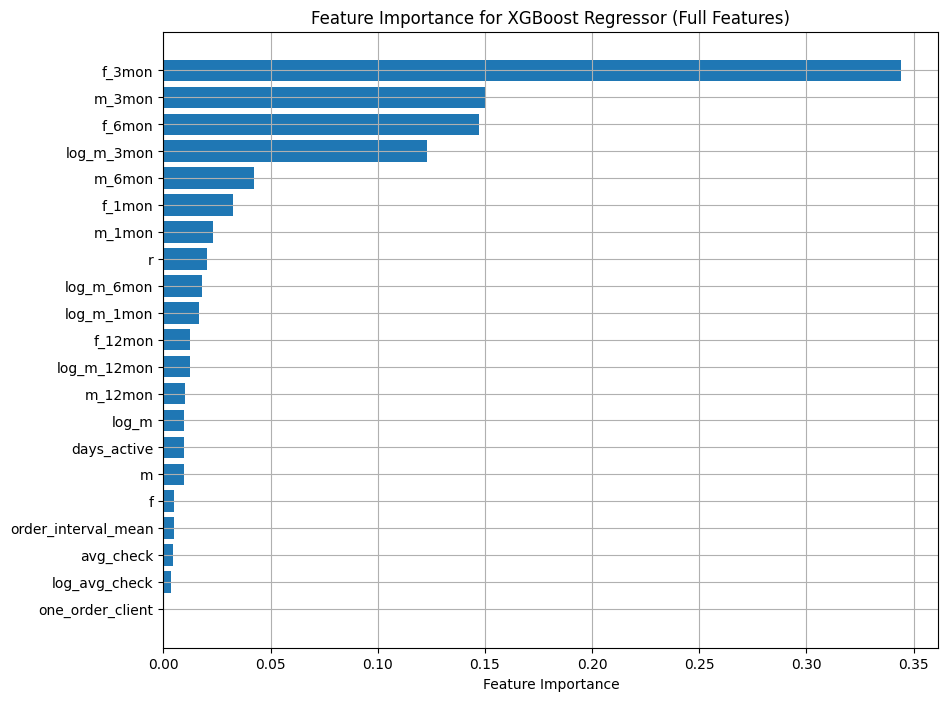

In [71]:
reg_xgb_importance = pd.DataFrame({
    'feature': X_train.columns,
    'importance': reg_model_xgb_full.feature_importances_
}).sort_values(by='importance', ascending=False)

plt.figure(figsize=(10, 8))
plt.barh(reg_xgb_importance['feature'], reg_xgb_importance['importance'])
plt.gca().invert_yaxis()
plt.xlabel('Feature Importance')
plt.title('Feature Importance for XGBoost Regressor (Full Features)')
plt.grid()
plt.show()

In [72]:
reg_xgb_importance

,feature,importance
12,f_3mon,0.344350
13,m_3mon,0.149959
15,f_6mon,0.147032
14,log_m_3mon,0.122843
16,m_6mon,0.042451
9,f_1mon,0.032585
10,m_1mon,0.022941
0,r,0.020452
17,log_m_6mon,0.018010
11,log_m_1mon,0.016778


##### Forward Selection for XGBoost Regressor

In [74]:
xgb_base = XGBRegressor(
    objective='reg:squarederror',
    random_state=42,
    colsample_bytree = 0.9376852562905246,
    gamma = 0.2790050504432495,
    learning_rate = 0.02408322616990878,
    max_depth = 4,
    min_child_weight = 2,
    n_estimators = 176, 
    subsample = 0.8073318609454947,
    n_jobs=-1
)

results = []
prev_features = set()
prev_mae, prev_rmse, prev_r2 = None, None, None

features_list = list(X_train.columns)

for k in range(1, len(features_list) + 1):
    sfs = SequentialFeatureSelector(
        estimator=xgb_base,
        n_features_to_select=k,
        direction='forward',
        cv=5,
        scoring='r2',
        n_jobs=-1
    )
    sfs.fit(X_train, y_train_monetary)
    
    selected_features = X_train.columns[sfs.get_support()]
    added_feature = list(set(selected_features) - prev_features)[0] if prev_features else list(selected_features)[0]
    prev_features = set(selected_features)

    xgb_base.fit(X_train[selected_features], y_train_monetary)
    y_pred = xgb_base.predict(X_test[selected_features])

    mae = mean_absolute_error(y_test_monetary, y_pred)
    rmse = root_mean_squared_error(y_test_monetary, y_pred)
    r2 = r2_score(y_test_monetary, y_pred)

    results.append({
        'n_features': k,
        'added_feature': added_feature,
        'MAE': mae,
        'RMSE': rmse,
        'R2': r2,
        'MAE_gain': None if prev_mae is None else prev_mae - mae,
        'RMSE_gain': None if prev_rmse is None else prev_rmse - rmse,
        'R2_gain': None if prev_r2 is None else r2 - prev_r2
    })

    print(len(results), results, '-'*500)

    prev_mae, prev_rmse, prev_r2 = mae, rmse, r2

1 [{'n_features': 1, 'added_feature': 'm_3mon', 'MAE': 734.631433162494, 'RMSE': 1456.7822067086906, 'R2': 0.2239690573283567, 'MAE_gain': None, 'RMSE_gain': None, 'R2_gain': None}] --------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
2 [{'n_features': 1, 'added_feature': 'm_3mon', 'MAE': 734.631433162494, 'RMSE': 1456.7822067086906, 'R2': 0.2239690573283567, 'MAE_gain': None, 'RMSE_gain': None, 'R2_gain': None}, {'n_features': 2, 'added_feature': 'f_1mon', 'MAE': 723.6194287836486, 'RMSE': 1428.1244236199864, 'R2': 0.25420086629409777, 'MAE_gain

ValueError: n_features_to_select must be < n_features.

In [75]:
df_reg_model_xgb_fs_res = pd.DataFrame(results)

df_reg_model_xgb_fs_res.to_csv('reg_model_xgb_feature_forward_selection_results.csv', index=False)

In [76]:
df_reg_model_xgb_fs_res = pd.read_csv('reg_model_xgb_feature_forward_selection_results.csv')

df_reg_model_xgb_fs_res

,n_features,added_feature,MAE,RMSE,R2,MAE_gain,RMSE_gain,R2_gain
0,1,m_3mon,734.631433,1456.782207,0.223969,NaN,NaN,NaN
1,2,f_1mon,723.619429,1428.124424,0.254201,11.012004,28.657783,0.030232
2,3,f_12mon,699.898300,1415.910950,0.266903,23.721129,12.213473,0.012702
3,4,r,693.433346,1408.130244,0.274938,6.464953,7.780707,0.008035
4,5,m,690.312219,1405.951594,0.277179,3.121127,2.178650,0.002242
5,6,days_active,687.836055,1402.983431,0.280228,2.476164,2.968163,0.003049
6,7,m_6mon,687.234872,1402.417967,0.280808,0.601183,0.565463,0.000580
7,8,f_3mon,687.354331,1402.547678,0.280675,-0.119459,-0.129711,-0.000133
8,9,m_12mon,687.196325,1402.598162,0.280623,0.158006,-0.050484,-0.000052
9,10,m_1mon,687.331596,1401.995284,0.281242,-0.135270,0.602878,0.000618


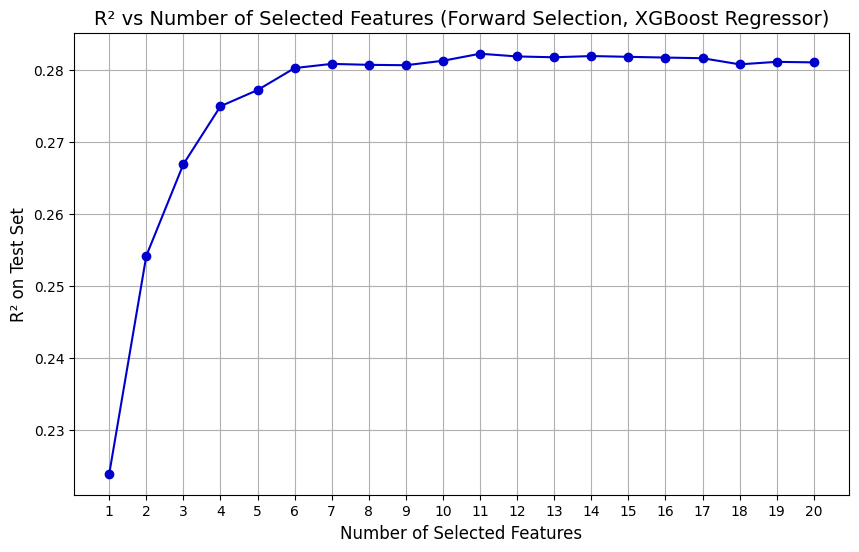

In [77]:
plt.figure(figsize=(10, 6))
plt.plot(df_reg_model_xgb_fs_res['n_features'], df_reg_model_xgb_fs_res['R2'], marker='o', color='mediumblue')

plt.xlabel('Number of Selected Features', fontsize=12)
plt.ylabel('R² on Test Set', fontsize=12)
plt.title('R² vs Number of Selected Features (Forward Selection, XGBoost Regressor)', fontsize=14)
plt.xticks(df_reg_model_xgb_fs_res['n_features'])
plt.grid(True)
plt.show()

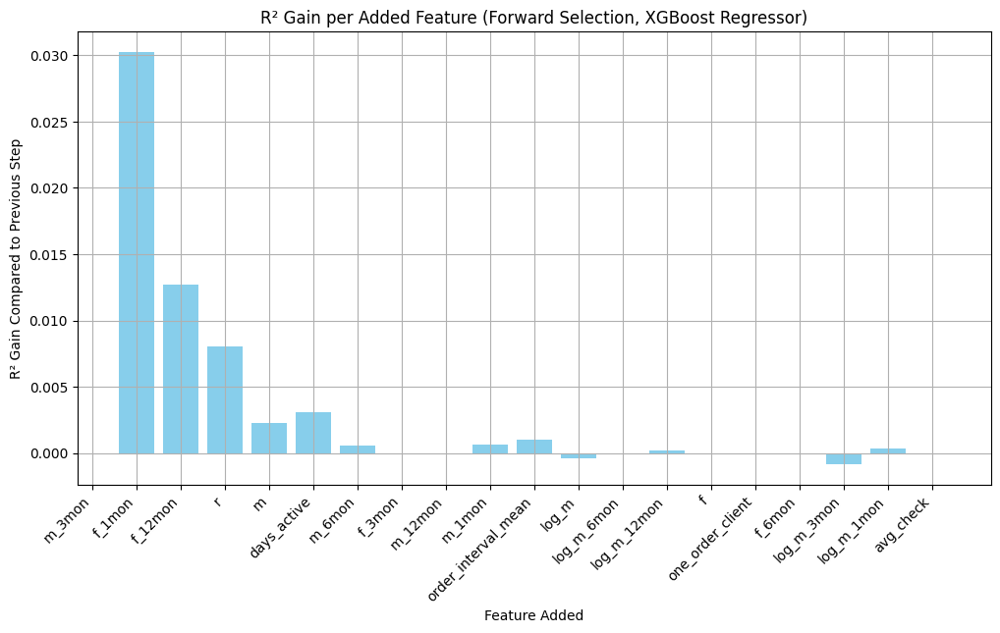

In [78]:
plt.figure(figsize=(12, 6))
plt.bar(df_reg_model_xgb_fs_res['added_feature'], df_reg_model_xgb_fs_res['R2_gain'], color='skyblue')
plt.xticks(rotation=45, ha='right')
plt.xlabel('Feature Added')
plt.ylabel('R² Gain Compared to Previous Step')
plt.title('R² Gain per Added Feature (Forward Selection, XGBoost Regressor)')
plt.grid()
plt.show()

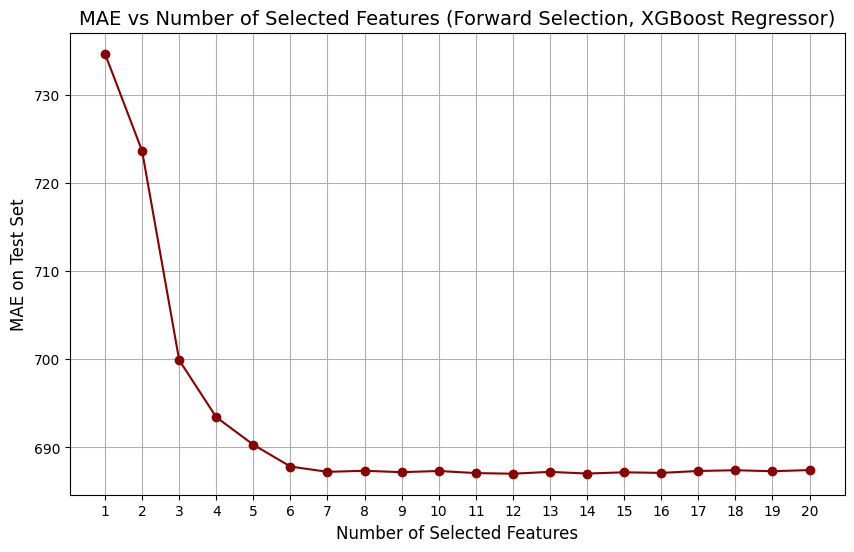

In [79]:
plt.figure(figsize=(10, 6))
plt.plot(df_reg_model_xgb_fs_res['n_features'], df_reg_model_xgb_fs_res['MAE'], marker='o', color='darkred')

plt.xlabel('Number of Selected Features', fontsize=12)
plt.ylabel('MAE on Test Set', fontsize=12)
plt.title('MAE vs Number of Selected Features (Forward Selection, XGBoost Regressor)', fontsize=14)
plt.xticks(df_reg_model_xgb_fs_res['n_features'])
plt.grid(True)
plt.show()

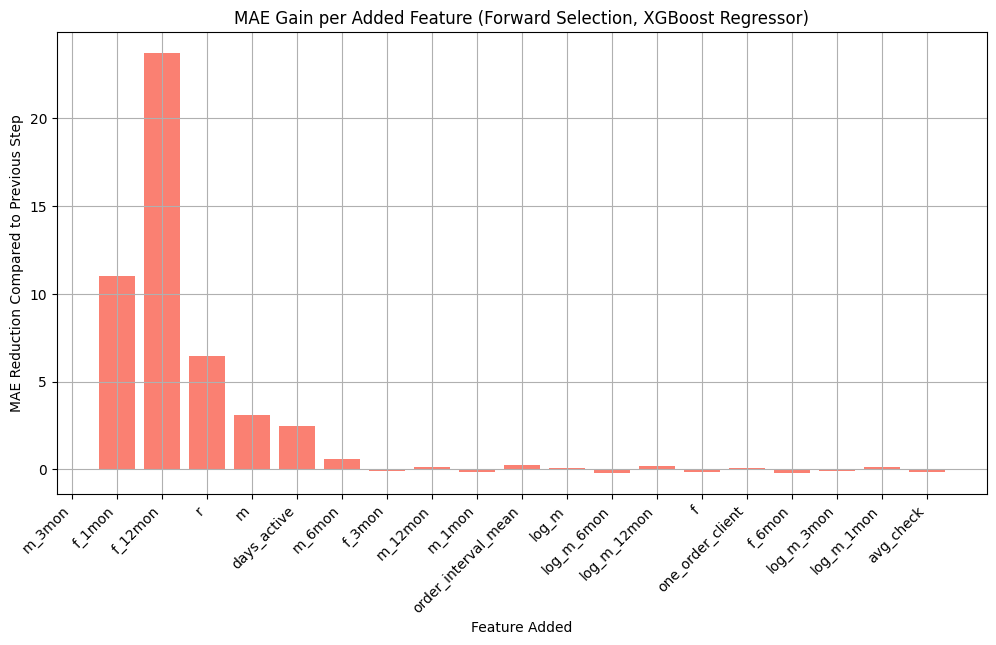

In [80]:
plt.figure(figsize=(12, 6))
plt.bar(df_reg_model_xgb_fs_res['added_feature'], df_reg_model_xgb_fs_res['MAE_gain'], color='salmon')
plt.xticks(rotation=45, ha='right')
plt.xlabel('Feature Added')
plt.ylabel('MAE Reduction Compared to Previous Step')
plt.title('MAE Gain per Added Feature (Forward Selection, XGBoost Regressor)')
plt.grid()
plt.show()

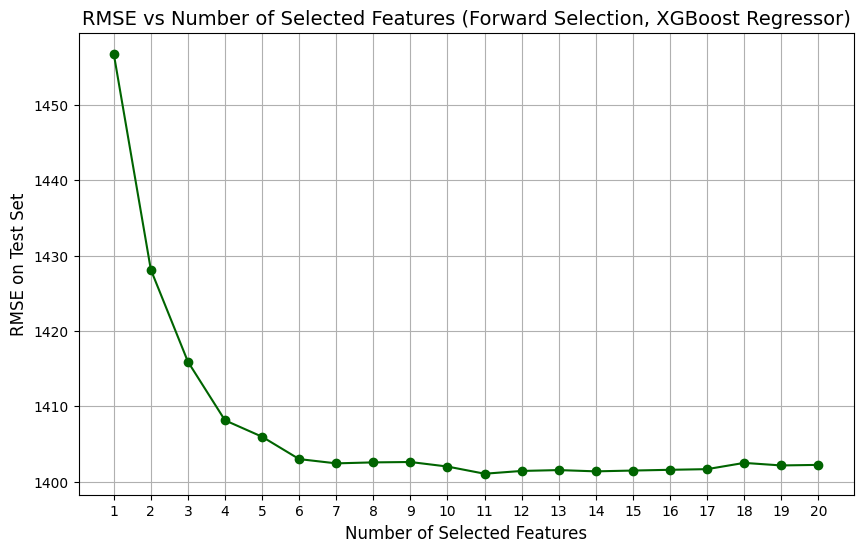

In [81]:
plt.figure(figsize=(10, 6))
plt.plot(df_reg_model_xgb_fs_res['n_features'], df_reg_model_xgb_fs_res['RMSE'], marker='o', color='darkgreen')

plt.xlabel('Number of Selected Features', fontsize=12)
plt.ylabel('RMSE on Test Set', fontsize=12)
plt.title('RMSE vs Number of Selected Features (Forward Selection, XGBoost Regressor)', fontsize=14)
plt.xticks(df_reg_model_xgb_fs_res['n_features'])
plt.grid(True)
plt.show()

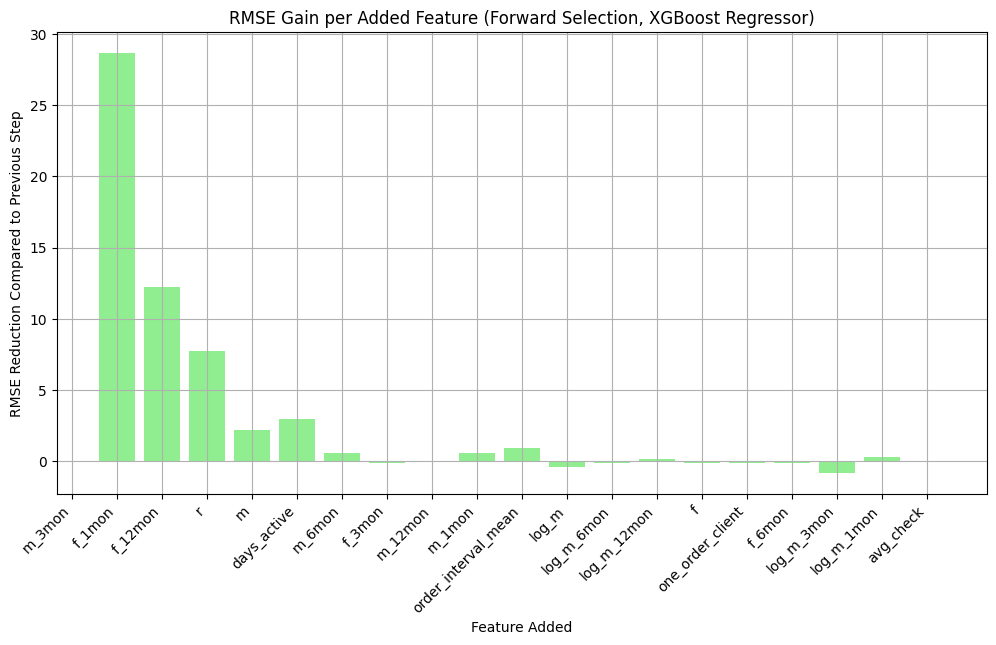

In [82]:
plt.figure(figsize=(12, 6))
plt.bar(df_reg_model_xgb_fs_res['added_feature'], df_reg_model_xgb_fs_res['RMSE_gain'], color='lightgreen')
plt.xticks(rotation=45, ha='right')
plt.xlabel('Feature Added')
plt.ylabel('RMSE Reduction Compared to Previous Step')
plt.title('RMSE Gain per Added Feature (Forward Selection, XGBoost Regressor)')
plt.grid()
plt.show()

##### Построим модель с оптимальным набором признаков

In [ ]:
selected_features_reg_xgb = [
    'm_3mon', 
    'f_1mon', 
    'f_12mon', 
    'r', 
    'm', 
    'days_active',
    'm_6mon', 
    'f_3mon', 
    'm_12mon', 
    'm_1mon', 
    'order_interval_mean'
    ]

In [ ]:
reg_model_xgb_selected = XGBRegressor(
    objective='reg:squarederror',
    random_state=42,
    colsample_bytree = 0.9376852562905246,
    gamma = 0.2790050504432495,
    learning_rate = 0.02408322616990878,
    max_depth = 4,
    min_child_weight = 2,
    n_estimators = 176, 
    subsample = 0.8073318609454947
)

reg_model_xgb_selected.fit(X_train[selected_features_reg_xgb], y_train_monetary)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.9376852562905246, device=None,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, feature_types=None, feature_weights=None,
             gamma=0.2790050504432495, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.02408322616990878,
             max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=4, max_leaves=None,
             min_child_weight=2, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=176, n_jobs=None,
             num_parallel_tree=None, ...)

In [ ]:
y_pred_train = reg_model_xgb_selected.predict(X_train[selected_features_reg_xgb])
y_pred_test = reg_model_xgb_selected.predict(X_test[selected_features_reg_xgb])

print_regression_metrics(y_train_monetary, y_pred_train, "Train (XGBoost Regressor Selected Features)")
print_regression_metrics(y_test_monetary, y_pred_test, "Test (XGBoost Regressor Selected Features)")

Метрики для Train (XGBoost Regressor Selected Features):
MAE:  690.86
RMSE: 1415.29
R^2:  0.2873
----------------------------------------
Метрики для Test (XGBoost Regressor Selected Features):
MAE:  687.07
RMSE: 1401.63
R^2:  0.2816
----------------------------------------


In [154]:
add_reg_results(
    model_name="XGBoost Regressor (Selected features)",
    y_true=y_test_monetary,
    y_pred=y_pred_test
)

reg_results

,Model,MAE (Test),RMSE (Test),R^2 (Test)
0,Linear Regression,719.350904,1456.349764,0.224430
1,Ridge Regression,719.343814,1456.350273,0.224429
2,Lasso Regression,719.162108,1456.382541,0.224395
3,Decision Tree Regressor,699.681177,1431.906871,0.250245
4,Random Forest Regressor,690.622637,1416.243707,0.266558
5,Gradient Boosting Regressor,689.443934,1414.660209,0.268197
6,XGBoost Regressor,691.236965,1412.772136,0.270149
7,LightGBM Regressor,688.656726,1410.976143,0.272004
8,XGBoost Regressor (Full features),687.467756,1401.994759,0.281242
9,XGBoost Regressor (Selected features),687.071499,1401.625127,0.281621


##### Тюнинг гиперпараметров с помощью RandomizedSearchCV для XGBoost Regressor с оптимальным набором признаков

In [ ]:
param_distributions = {
    'n_estimators': randint(50, 250),
    'max_depth': randint(3, 10),
    'learning_rate': uniform(0.01, 0.2),
    'subsample': uniform(0.6, 0.4),
    'colsample_bytree': uniform(0.6, 0.4),
    'min_child_weight': randint(1, 6),
    'gamma': uniform(0, 2)
}

random_search = RandomizedSearchCV(
    estimator=XGBRegressor(objective='reg:squarederror', random_state=42, n_jobs=-1),
    param_distributions=param_distributions,
    n_iter=1000,
    scoring='neg_root_mean_squared_error',
    cv=5,
    verbose=2,
    random_state=42,
    n_jobs=-1,
    return_train_score=True
)

random_search.fit(X_train[selected_features_reg_xgb], y_train_monetary)

Fitting 5 folds for each of 1000 candidates, totalling 5000 fits


RandomizedSearchCV(cv=5,
                   estimator=XGBRegressor(base_score=None, booster=None,
                                          callbacks=None,
                                          colsample_bylevel=None,
                                          colsample_bynode=None,
                                          colsample_bytree=None, device=None,
                                          early_stopping_rounds=None,
                                          enable_categorical=False,
                                          eval_metric=None, feature_types=None,
                                          feature_weights=None, gamma=None,
                                          grow_policy=None,
                                          importance_type=None,
                                          interaction_constraint...
                                        'min_child_weight': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x00000265BC006C00>,
                                        'n_estimators': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x00000265C4C7FF80>,
                                        'subsample': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0x00000265C494BFE0>},
                   random_state=42, return_train_score=True,
                   scoring='neg_root_mean_squared_error', verbose=2)

In [89]:
cv_results = pd.DataFrame(random_search.cv_results_)

df_reg_model_xgb_random_search_res = cv_results[[
    'mean_test_score', 'std_test_score', 'rank_test_score',
    'param_n_estimators', 'param_max_depth', 'param_learning_rate',
    'param_subsample', 'param_colsample_bytree', 'param_min_child_weight', 'param_gamma'
]].copy()

df_reg_model_xgb_random_search_res['RMSE_cv'] = -df_reg_model_xgb_random_search_res['mean_test_score']

df_reg_model_xgb_random_search_res = df_reg_model_xgb_random_search_res.sort_values(by='RMSE_cv').reset_index(drop=True)

df_reg_model_xgb_random_search_res.to_csv('reg_model_xgb_random_search_results.csv', index=False)

In [90]:
df_reg_model_xgb_random_search_res = pd.read_csv('reg_model_xgb_random_search_results.csv')

df_reg_model_xgb_random_search_res.head(10)

,mean_test_score,std_test_score,rank_test_score,param_n_estimators,param_max_depth,param_learning_rate,param_subsample,param_colsample_bytree,param_min_child_weight,param_gamma,RMSE_cv
0,-1426.200669,12.641228,1,229,5,0.026903,0.683740,0.601038,5,1.736602,1426.200669
1,-1426.441384,12.349907,2,234,4,0.022531,0.738368,0.795028,3,0.067227,1426.441384
2,-1426.443270,12.204175,3,73,5,0.053491,0.946491,0.764458,5,1.408063,1426.443270
3,-1426.457410,12.181093,4,103,4,0.042162,0.779370,0.865401,2,0.010123,1426.457410
4,-1426.503137,12.715010,5,216,6,0.019213,0.728342,0.654945,5,0.553740,1426.503137
5,-1426.550977,12.737155,6,124,4,0.032408,0.946203,0.764159,4,1.964757,1426.550977
6,-1426.557576,12.358799,7,154,4,0.036766,0.899458,0.798678,3,0.568548,1426.557576
7,-1426.567419,12.336872,8,202,4,0.025482,0.642260,0.903696,4,1.239496,1426.567419
8,-1426.569708,12.283815,9,135,5,0.031081,0.937552,0.791482,4,1.724152,1426.569708
9,-1426.573158,12.329447,10,97,5,0.039759,0.637469,0.950836,2,1.888084,1426.573158


##### Построим итоговую модель XGBoost Regressor с оптимальным набором признаков и гиперпараметров

In [ ]:
reg_model_xgb_final = XGBRegressor(
    n_estimators = 229,
    max_depth = 5,
    learning_rate = 0.0269,
    subsample = 0.6837,
    colsample_bytree = 0.6010,
    min_child_weight = 5,
    gamma = 1.7366,
    random_state = 42,
    n_jobs = -1
)

reg_model_xgb_final.fit(X_train[selected_features_reg_xgb], y_train_monetary)

y_pred_train = reg_model_xgb_final.predict(X_train[selected_features_reg_xgb])
y_pred_test = reg_model_xgb_final.predict(X_test[selected_features_reg_xgb])

print_regression_metrics(y_train_monetary, y_pred_train, "Train (XGBoost Regressor Final)")
print_regression_metrics(y_test_monetary, y_pred_test, "Test (XGBoost Regressor Final)")

Метрики для Train (XGBoost Regressor Final):
MAE:  685.82
RMSE: 1402.63
R^2:  0.3000
----------------------------------------
Метрики для Test (XGBoost Regressor Final):
MAE:  684.70
RMSE: 1401.49
R^2:  0.2818
----------------------------------------


In [156]:
add_reg_results(
    model_name="XGBoost Regressor (Final)",
    y_true=y_test_monetary,
    y_pred=y_pred_test
)

reg_results

,Model,MAE (Test),RMSE (Test),R^2 (Test)
0,Linear Regression,719.350904,1456.349764,0.224430
1,Ridge Regression,719.343814,1456.350273,0.224429
2,Lasso Regression,719.162108,1456.382541,0.224395
3,Decision Tree Regressor,699.681177,1431.906871,0.250245
4,Random Forest Regressor,690.622637,1416.243707,0.266558
5,Gradient Boosting Regressor,689.443934,1414.660209,0.268197
6,XGBoost Regressor,691.236965,1412.772136,0.270149
7,LightGBM Regressor,688.656726,1410.976143,0.272004
8,XGBoost Regressor (Full features),687.467756,1401.994759,0.281242
9,XGBoost Regressor (Selected features),687.071499,1401.625127,0.281621


#### LightGBM Regressor optimization

##### Обучим LightGBM Regressor на полном наборе признаков

In [157]:
reg_model_lgbm_full = LGBMRegressor(
    learning_rate = 0.05, 
    max_depth = 5, 
    n_estimators = 100, 
    num_leaves = 31,
    random_state=42
    )

reg_model_lgbm_full.fit(X_train, y_train_monetary)

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007746 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3941
[LightGBM] [Info] Number of data points in the train set: 309106, number of used features: 21
[LightGBM] [Info] Start training from score 672.355998
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

LGBMRegressor(learning_rate=0.05, max_depth=5, random_state=42)

In [158]:
y_pred_train = reg_model_lgbm_full.predict(X_train)
y_pred_test = reg_model_lgbm_full.predict(X_test)

In [159]:
print_regression_metrics(y_train_monetary, y_pred_train, "Train (LightGBM Regressor, Full features)")
print_regression_metrics(y_test_monetary, y_pred_test, "Test (LightGBM Regressor, Full features)")

Метрики для Train (LightGBM Regressor, Full features):
MAE:  686.63
RMSE: 1405.91
R^2:  0.2967
----------------------------------------
Метрики для Test (LightGBM Regressor, Full features):
MAE:  685.62
RMSE: 1401.72
R^2:  0.2815
----------------------------------------


In [160]:
add_reg_results(
    model_name="LightGBM Regressor (Full features)",
    y_true=y_test_monetary,
    y_pred=y_pred_test
)

reg_results

,Model,MAE (Test),RMSE (Test),R^2 (Test)
0,Linear Regression,719.350904,1456.349764,0.224430
1,Ridge Regression,719.343814,1456.350273,0.224429
2,Lasso Regression,719.162108,1456.382541,0.224395
3,Decision Tree Regressor,699.681177,1431.906871,0.250245
4,Random Forest Regressor,690.622637,1416.243707,0.266558
5,Gradient Boosting Regressor,689.443934,1414.660209,0.268197
6,XGBoost Regressor,691.236965,1412.772136,0.270149
7,LightGBM Regressor,688.656726,1410.976143,0.272004
8,XGBoost Regressor (Full features),687.467756,1401.994759,0.281242
9,XGBoost Regressor (Selected features),687.071499,1401.625127,0.281621


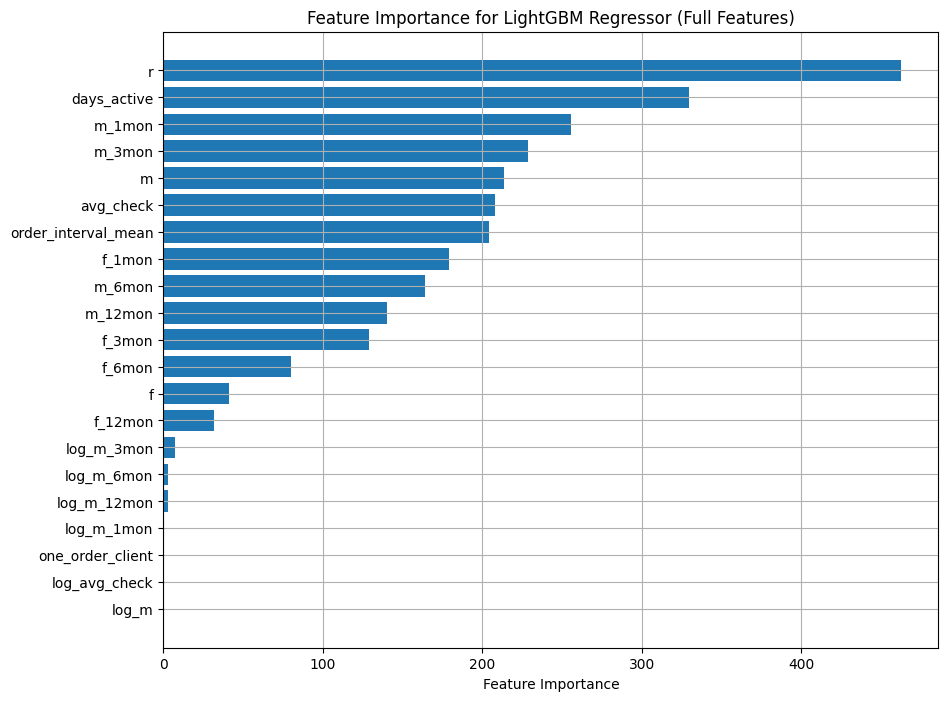

In [26]:
reg_lgbm_importance = pd.DataFrame({
    'feature': X_train.columns,
    'importance': reg_model_lgbm_full.feature_importances_
}).sort_values(by='importance', ascending=False)

plt.figure(figsize=(10, 8))
plt.barh(reg_lgbm_importance['feature'], reg_lgbm_importance['importance'])
plt.gca().invert_yaxis()
plt.xlabel('Feature Importance')
plt.title('Feature Importance for LightGBM Regressor (Full Features)')
plt.grid()
plt.show()

In [27]:
reg_lgbm_importance

,feature,importance
0,r,463
3,days_active,330
10,m_1mon,256
13,m_3mon,229
2,m,214
4,avg_check,208
7,order_interval_mean,204
9,f_1mon,179
16,m_6mon,164
19,m_12mon,140


##### Forward Selection for LightGBM Regressor

In [ ]:
lgbm_base = LGBMRegressor(
    learning_rate = 0.05, 
    max_depth = 5, 
    n_estimators = 100, 
    num_leaves = 31,
    random_state=42,
    n_jobs=-1
)

results = []
prev_features = set()
prev_mae, prev_rmse, prev_r2 = None, None, None

features_list = list(X_train.columns)

for k in range(1, len(features_list)):
    sfs = SequentialFeatureSelector(
        estimator=lgbm_base,
        n_features_to_select=k,
        direction='forward',
        cv=3,
        scoring='r2',
        n_jobs=-1
    )
    sfs.fit(X_train, y_train_monetary)
    
    selected_features = X_train.columns[sfs.get_support()]
    added_feature = list(set(selected_features) - prev_features)[0] if prev_features else list(selected_features)[0]
    prev_features = set(selected_features)

    lgbm_base.fit(X_train[selected_features], y_train_monetary)
    y_pred = lgbm_base.predict(X_test[selected_features])

    mae = mean_absolute_error(y_test_monetary, y_pred)
    rmse = root_mean_squared_error(y_test_monetary, y_pred)
    r2 = r2_score(y_test_monetary, y_pred)

    results.append({
        'n_features': k,
        'added_feature': added_feature,
        'MAE': mae,
        'RMSE': rmse,
        'R2': r2,
        'MAE_gain': None if prev_mae is None else prev_mae - mae,
        'RMSE_gain': None if prev_rmse is None else prev_rmse - rmse,
        'R2_gain': None if prev_r2 is None else r2 - prev_r2
    })

    print(len(results), results, '-'*500)

    prev_mae, prev_rmse, prev_r2 = mae, rmse, r2

In [32]:
df_reg_model_lgbm_fs_res = pd.DataFrame(results)

df_reg_model_lgbm_fs_res.to_csv('reg_model_lgbm_feature_forward_selection_results.csv', index=False)

In [33]:
df_reg_model_lgbm_fs_res = pd.read_csv('reg_model_lgbm_feature_forward_selection_results.csv')

df_reg_model_lgbm_fs_res

,n_features,added_feature,MAE,RMSE,R2,MAE_gain,RMSE_gain,R2_gain
0,1,m_3mon,733.713616,1457.000578,0.223736,NaN,NaN,NaN
1,2,r,710.184757,1428.813349,0.253481,23.528858,28.187229,2.974476e-02
2,3,order_interval_mean,693.334231,1412.887500,0.270030,16.850526,15.925849,1.654896e-02
3,4,f,689.158035,1409.576958,0.273447,4.176196,3.310542,3.416783e-03
4,5,avg_check,688.133854,1407.418894,0.275670,1.024181,2.158064,2.223004e-03
5,6,f_1mon,686.626124,1402.532263,0.280691,1.507730,4.886630,5.021090e-03
6,7,log_m_6mon,686.174009,1402.687955,0.280531,0.452115,-0.155692,-1.597063e-04
7,8,f_3mon,686.291331,1403.267578,0.279937,-0.117321,-0.579623,-5.947253e-04
8,9,m_1mon,686.250694,1402.646165,0.280574,0.040637,0.621414,6.375951e-04
9,10,days_active,685.833427,1401.764213,0.281479,0.417267,0.881951,9.044318e-04


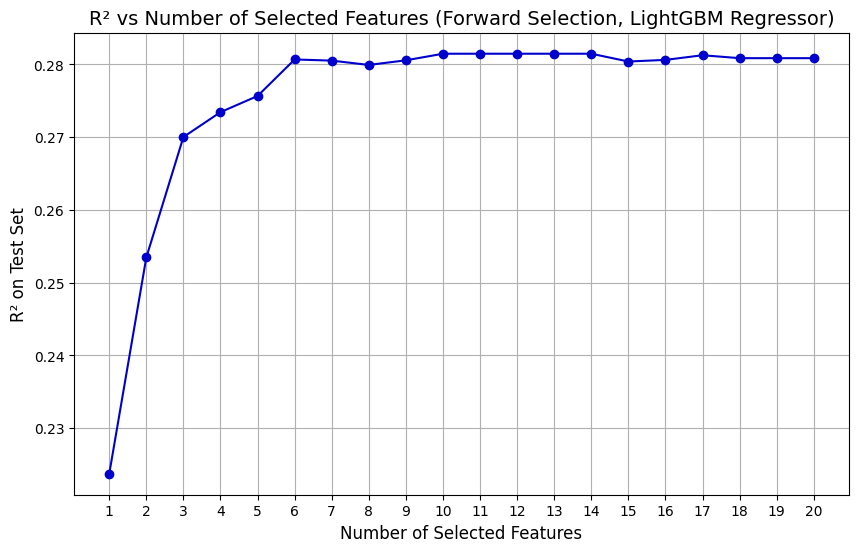

In [34]:
plt.figure(figsize=(10, 6))
plt.plot(df_reg_model_lgbm_fs_res['n_features'], df_reg_model_lgbm_fs_res['R2'], marker='o', color='mediumblue')

plt.xlabel('Number of Selected Features', fontsize=12)
plt.ylabel('R² on Test Set', fontsize=12)
plt.title('R² vs Number of Selected Features (Forward Selection, LightGBM Regressor)', fontsize=14)
plt.xticks(df_reg_model_lgbm_fs_res['n_features'])
plt.grid(True)
plt.show()

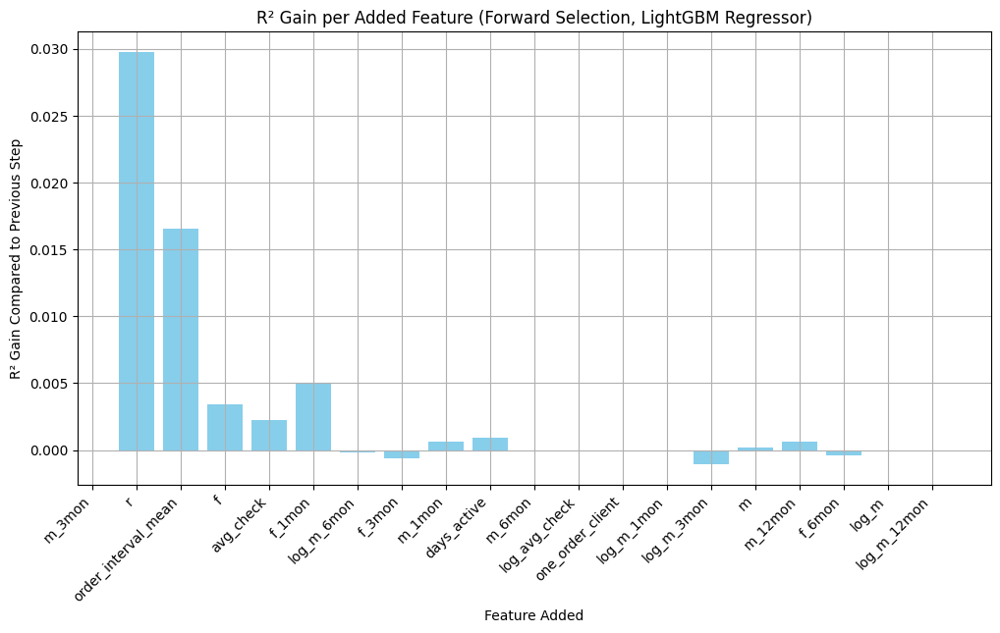

In [35]:
plt.figure(figsize=(12, 6))
plt.bar(df_reg_model_lgbm_fs_res['added_feature'], df_reg_model_lgbm_fs_res['R2_gain'], color='skyblue')
plt.xticks(rotation=45, ha='right')
plt.xlabel('Feature Added')
plt.ylabel('R² Gain Compared to Previous Step')
plt.title('R² Gain per Added Feature (Forward Selection, LightGBM Regressor)')
plt.grid()
plt.show()

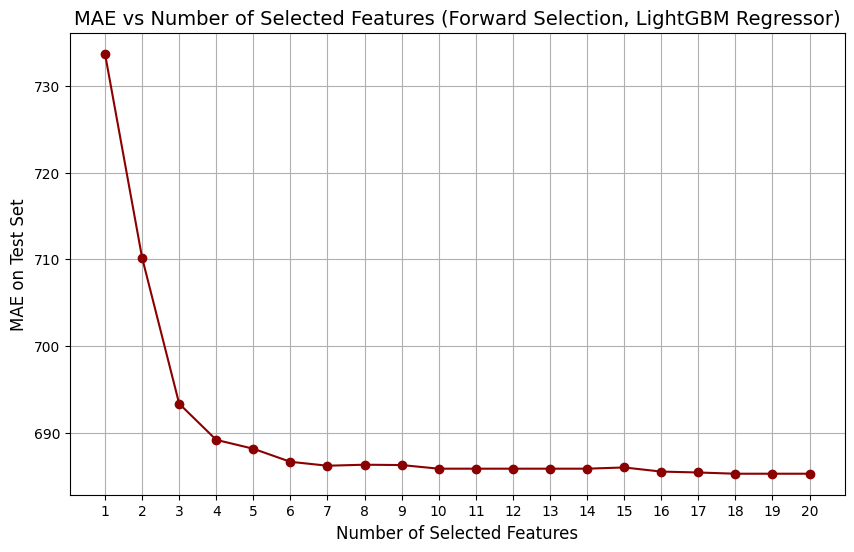

In [36]:
plt.figure(figsize=(10, 6))
plt.plot(df_reg_model_lgbm_fs_res['n_features'], df_reg_model_lgbm_fs_res['MAE'], marker='o', color='darkred')

plt.xlabel('Number of Selected Features', fontsize=12)
plt.ylabel('MAE on Test Set', fontsize=12)
plt.title('MAE vs Number of Selected Features (Forward Selection, LightGBM Regressor)', fontsize=14)
plt.xticks(df_reg_model_lgbm_fs_res['n_features'])
plt.grid(True)
plt.show()

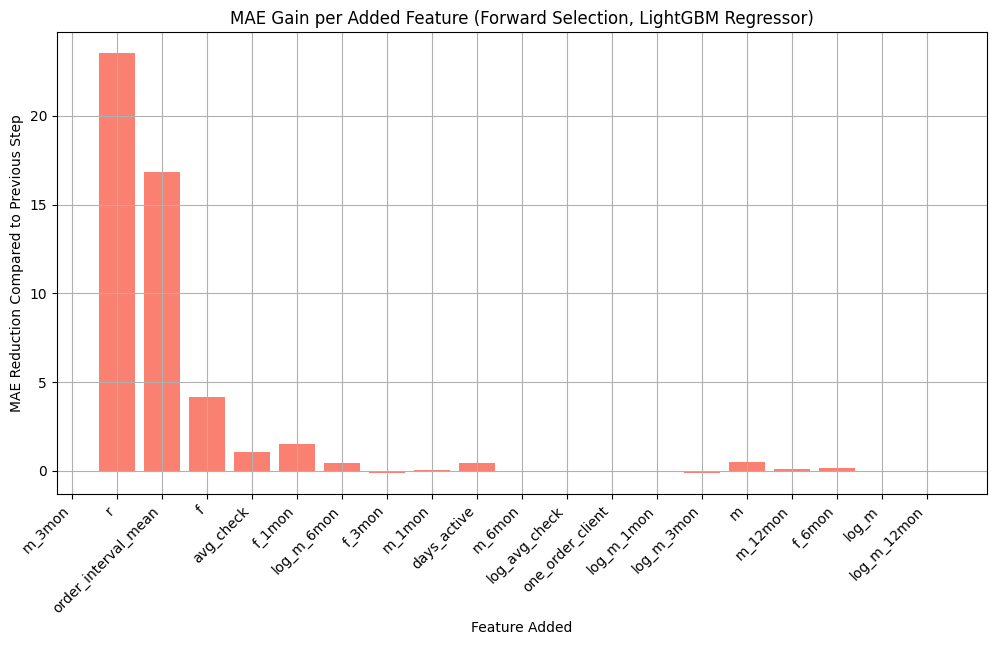

In [37]:
plt.figure(figsize=(12, 6))
plt.bar(df_reg_model_lgbm_fs_res['added_feature'], df_reg_model_lgbm_fs_res['MAE_gain'], color='salmon')
plt.xticks(rotation=45, ha='right')
plt.xlabel('Feature Added')
plt.ylabel('MAE Reduction Compared to Previous Step')
plt.title('MAE Gain per Added Feature (Forward Selection, LightGBM Regressor)')
plt.grid()
plt.show()

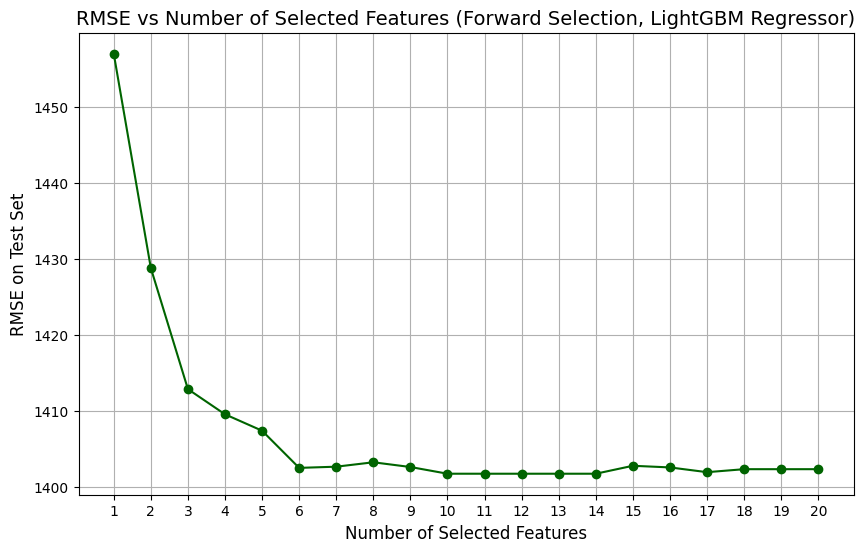

In [38]:
plt.figure(figsize=(10, 6))
plt.plot(df_reg_model_lgbm_fs_res['n_features'], df_reg_model_lgbm_fs_res['RMSE'], marker='o', color='darkgreen')

plt.xlabel('Number of Selected Features', fontsize=12)
plt.ylabel('RMSE on Test Set', fontsize=12)
plt.title('RMSE vs Number of Selected Features (Forward Selection, LightGBM Regressor)', fontsize=14)
plt.xticks(df_reg_model_lgbm_fs_res['n_features'])
plt.grid(True)
plt.show()

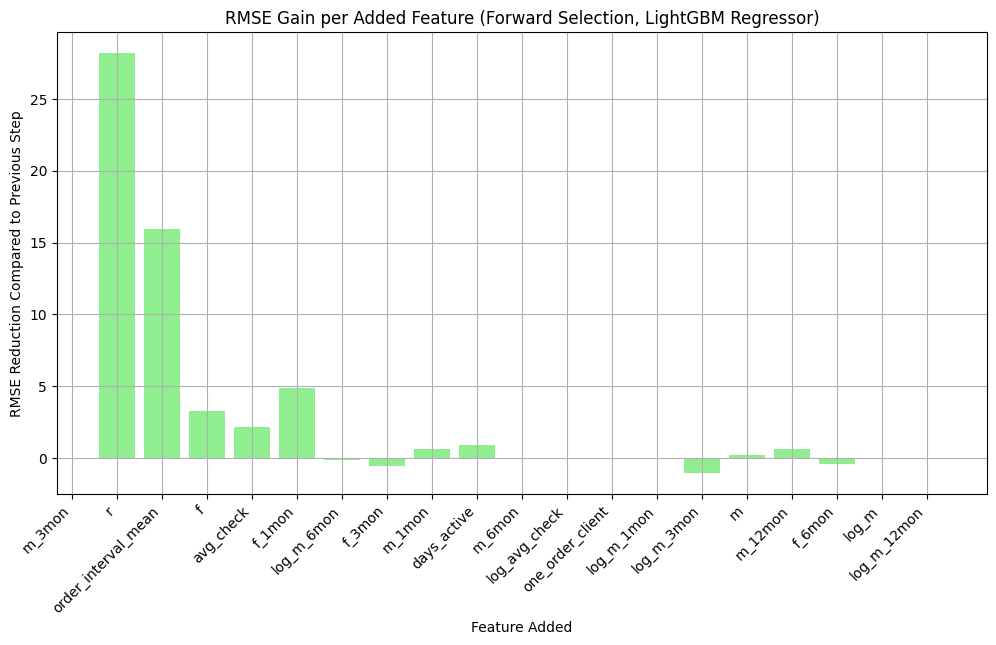

In [39]:
plt.figure(figsize=(12, 6))
plt.bar(df_reg_model_lgbm_fs_res['added_feature'], df_reg_model_lgbm_fs_res['RMSE_gain'], color='lightgreen')
plt.xticks(rotation=45, ha='right')
plt.xlabel('Feature Added')
plt.ylabel('RMSE Reduction Compared to Previous Step')
plt.title('RMSE Gain per Added Feature (Forward Selection, LightGBM Regressor)')
plt.grid()
plt.show()

##### Построим модель с оптимальным набором признаков

In [ ]:
selected_features_reg_lgbm = [
    'm_3mon', 
    'r', 
    'order_interval_mean', 
    'f', 
    'avg_check',
    'f_1mon', 
    'log_m_6mon', 
    'f_3mon', 
    'm_1mon', 
    'days_active'
]

In [ ]:
reg_model_lgbm_selected = LGBMRegressor(
    learning_rate = 0.05, 
    max_depth = 5, 
    n_estimators = 100, 
    num_leaves = 31,
    random_state=42,
    n_jobs=-1
)

reg_model_lgbm_selected.fit(X_train[selected_features_reg_lgbm], y_train_monetary)

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005189 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1851
[LightGBM] [Info] Number of data points in the train set: 309106, number of used features: 10
[LightGBM] [Info] Start training from score 672.355998
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

LGBMRegressor(learning_rate=0.05, max_depth=5, n_jobs=-1, random_state=42)

In [ ]:
y_pred_train = reg_model_lgbm_selected.predict(X_train[selected_features_reg_lgbm])
y_pred_test = reg_model_lgbm_selected.predict(X_test[selected_features_reg_lgbm])

print_regression_metrics(y_train_monetary, y_pred_train, "Train (LightGBM Regressor Selected Features)")
print_regression_metrics(y_test_monetary, y_pred_test, "Test (LightGBM Regressor Selected Features)")


Метрики для Train (LightGBM Regressor Selected Features):
MAE:  687.24
RMSE: 1407.35
R^2:  0.2953
----------------------------------------
Метрики для Test (LightGBM Regressor Selected Features):
MAE:  685.83
RMSE: 1401.76
R^2:  0.2815
----------------------------------------


In [164]:
add_reg_results(
    model_name="LightGBM Regressor (Selected features)",
    y_true=y_test_monetary,
    y_pred=y_pred_test
)

reg_results

,Model,MAE (Test),RMSE (Test),R^2 (Test)
0,Linear Regression,719.350904,1456.349764,0.224430
1,Ridge Regression,719.343814,1456.350273,0.224429
2,Lasso Regression,719.162108,1456.382541,0.224395
3,Decision Tree Regressor,699.681177,1431.906871,0.250245
4,Random Forest Regressor,690.622637,1416.243707,0.266558
5,Gradient Boosting Regressor,689.443934,1414.660209,0.268197
6,XGBoost Regressor,691.236965,1412.772136,0.270149
7,LightGBM Regressor,688.656726,1410.976143,0.272004
8,XGBoost Regressor (Full features),687.467756,1401.994759,0.281242
9,XGBoost Regressor (Selected features),687.071499,1401.625127,0.281621


##### Тюнинг гиперпараметров с помощью RandomizedSearchCV для LightGBM Regressor с оптимальным набором признаков

In [ ]:
param_distributions = {
    'n_estimators': randint(50, 250),
    'max_depth': randint(3, 10),
    'learning_rate': uniform(0.01, 0.2),
    'num_leaves': randint(20, 60),
    'subsample': uniform(0.6, 0.4),
    'colsample_bytree': uniform(0.6, 0.4),
    'min_child_samples': randint(5, 30)          
}

random_search = RandomizedSearchCV(
    estimator=LGBMRegressor(random_state=42, n_jobs=-1),
    param_distributions=param_distributions,
    n_iter=5000,
    scoring='neg_root_mean_squared_error',
    cv=5,
    verbose=2,
    random_state=42,
    n_jobs=-1,
    return_train_score=True
)

random_search.fit(X_train[selected_features_reg_lgbm], y_train_monetary)

Fitting 5 folds for each of 5000 candidates, totalling 25000 fits
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007015 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1851
[LightGBM] [Info] Number of data points in the train set: 309106, number of used features: 10
[LightGBM] [Info] Start training from score 672.355998
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


RandomizedSearchCV(cv=5, estimator=LGBMRegressor(n_jobs=-1, random_state=42),
                   n_iter=5000, n_jobs=-1,
                   param_distributions={'colsample_bytree': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0x00000265C4BC35F0>,
                                        'learning_rate': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0x00000265C4D0C800>,
                                        'max_depth': <scipy.stats._distn...
                                        'n_estimators': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x00000265C48DE870>,
                                        'num_leaves': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x00000265C4D0DA30>,
                                        'subsample': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0x00000265C4BC3710>},
                   random_state=42, return_train_score=True,
                   scoring='neg_root_mean_squared_error', verbose=2)

In [96]:
cv_results = pd.DataFrame(random_search.cv_results_)

df_reg_model_lgbm_random_search_res = cv_results[[
    'mean_test_score', 'std_test_score', 'rank_test_score',
    'param_n_estimators', 'param_max_depth', 'param_learning_rate',
    'param_num_leaves', 'param_subsample', 'param_colsample_bytree', 'param_min_child_samples'
]].copy()

df_reg_model_lgbm_random_search_res['RMSE_cv'] = -df_reg_model_lgbm_random_search_res['mean_test_score']

df_reg_model_lgbm_random_search_res = df_reg_model_lgbm_random_search_res.sort_values(by='RMSE_cv').reset_index(drop=True)

df_reg_model_lgbm_random_search_res.to_csv('reg_model_lgbm_random_search_results.csv', index=False)

In [98]:
df_reg_model_lgbm_random_search_res = pd.read_csv('reg_model_lgbm_random_search_results.csv')

df_reg_model_lgbm_random_search_res.head(10)

,mean_test_score,std_test_score,rank_test_score,param_n_estimators,param_max_depth,param_learning_rate,param_num_leaves,param_subsample,param_colsample_bytree,param_min_child_samples,RMSE_cv
0,-1425.960344,12.887948,1,171,5,0.032731,33,0.935943,0.615866,29,1425.960344
1,-1425.972062,13.083284,2,179,5,0.030668,25,0.748334,0.664857,25,1425.972062
2,-1426.109773,13.054509,3,98,4,0.074011,37,0.946638,0.709666,28,1426.109773
3,-1426.115118,13.054052,4,142,4,0.061430,23,0.850701,0.888422,19,1426.115118
4,-1426.117668,12.565849,5,245,6,0.019337,49,0.841498,0.666732,29,1426.117668
5,-1426.124699,12.755163,6,164,5,0.034689,48,0.673082,0.607817,27,1426.124699
6,-1426.143697,12.897193,7,167,4,0.037838,28,0.765389,0.835577,28,1426.143697
7,-1426.183247,12.969394,8,104,4,0.066688,21,0.717257,0.837530,28,1426.183247
8,-1426.195156,12.887771,9,103,4,0.068009,35,0.727216,0.874070,27,1426.195156
9,-1426.212160,12.692932,10,221,4,0.045078,54,0.942251,0.870559,29,1426.212160


In [ ]:
reg_model_lgbm_tuned = LGBMRegressor(
    n_estimators = 171,
    max_depth = 5,
    learning_rate = 0.0327,
    num_leaves = 33,
    subsample = 0.9359,
    colsample_bytree = 0.6159,
    min_child_samples = 29,
    random_state = 42,
    n_jobs = -1
)

reg_model_lgbm_tuned.fit(X_train[selected_features_reg_lgbm], y_train_monetary)

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004691 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1851
[LightGBM] [Info] Number of data points in the train set: 309106, number of used features: 10
[LightGBM] [Info] Start training from score 672.355998
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

LGBMRegressor(colsample_bytree=0.6159, learning_rate=0.0327, max_depth=5,
              min_child_samples=29, n_estimators=171, n_jobs=-1, num_leaves=33,
              random_state=42, subsample=0.9359)

In [ ]:
y_pred_train = reg_model_lgbm_tuned.predict(X_train[selected_features_reg_lgbm])
y_pred_test = reg_model_lgbm_tuned.predict(X_test[selected_features_reg_lgbm])

print_regression_metrics(y_train_monetary, y_pred_train, "Train (LightGBM Regressor Tuned)")
print_regression_metrics(y_test_monetary, y_pred_test, "Test (LightGBM Regressor Tuned)")

Метрики для Train (LightGBM Regressor Tuned):
MAE:  686.85
RMSE: 1408.15
R^2:  0.2945
----------------------------------------
Метрики для Test (LightGBM Regressor Tuned):
MAE:  685.38
RMSE: 1402.33
R^2:  0.2809
----------------------------------------


In [171]:
add_reg_results(
    model_name="LightGBM Regressor (Tuned)",
    y_true=y_test_monetary,
    y_pred=y_pred_test
)

reg_results

,Model,MAE (Test),RMSE (Test),R^2 (Test)
0,Linear Regression,719.350904,1456.349764,0.224430
1,Ridge Regression,719.343814,1456.350273,0.224429
2,Lasso Regression,719.162108,1456.382541,0.224395
3,Decision Tree Regressor,699.681177,1431.906871,0.250245
4,Random Forest Regressor,690.622637,1416.243707,0.266558
5,Gradient Boosting Regressor,689.443934,1414.660209,0.268197
6,XGBoost Regressor,691.236965,1412.772136,0.270149
7,LightGBM Regressor,688.656726,1410.976143,0.272004
8,XGBoost Regressor (Full features),687.467756,1401.994759,0.281242
9,XGBoost Regressor (Selected features),687.071499,1401.625127,0.281621


##### Построим итоговую модель LightGBM Regressor с оптимальным набором признаков и гиперпараметров

In [ ]:
selected_features_reg_lgbm = [
    'm_3mon', 
    'r', 
    'order_interval_mean', 
    'f', 
    'avg_check',
    'f_1mon', 
    'log_m_6mon', 
    'f_3mon', 
    'm_1mon', 
    'days_active'
]

In [ ]:
reg_model_lgbm_final = LGBMRegressor(
    learning_rate = 0.05, 
    max_depth = 5, 
    n_estimators = 100, 
    num_leaves = 31,
    random_state=42,
    n_jobs=-1
)

reg_model_lgbm_final.fit(X_train[selected_features_reg_lgbm], y_train_monetary)

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005930 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1851
[LightGBM] [Info] Number of data points in the train set: 309106, number of used features: 10
[LightGBM] [Info] Start training from score 672.355998
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

LGBMRegressor(learning_rate=0.05, max_depth=5, n_jobs=-1, random_state=42)

In [ ]:
y_pred_train = reg_model_lgbm_final.predict(X_train[selected_features_reg_lgbm])
y_pred_test = reg_model_lgbm_final.predict(X_test[selected_features_reg_lgbm])

print_regression_metrics(y_train_monetary, y_pred_train, "Train (LightGBM Regressor Final)")
print_regression_metrics(y_test_monetary, y_pred_test, "Test (LightGBM Regressor Final)")


Метрики для Train (LightGBM Regressor Final):
MAE:  687.24
RMSE: 1407.35
R^2:  0.2953
----------------------------------------
Метрики для Test (LightGBM Regressor Final):
MAE:  685.83
RMSE: 1401.76
R^2:  0.2815
----------------------------------------


In [174]:
add_reg_results(
    model_name="LightGBM Regressor (Final)",
    y_true=y_test_monetary,
    y_pred=y_pred_test
)

reg_results

,Model,MAE (Test),RMSE (Test),R^2 (Test)
0,Linear Regression,719.350904,1456.349764,0.224430
1,Ridge Regression,719.343814,1456.350273,0.224429
2,Lasso Regression,719.162108,1456.382541,0.224395
3,Decision Tree Regressor,699.681177,1431.906871,0.250245
4,Random Forest Regressor,690.622637,1416.243707,0.266558
5,Gradient Boosting Regressor,689.443934,1414.660209,0.268197
6,XGBoost Regressor,691.236965,1412.772136,0.270149
7,LightGBM Regressor,688.656726,1410.976143,0.272004
8,XGBoost Regressor (Full features),687.467756,1401.994759,0.281242
9,XGBoost Regressor (Selected features),687.071499,1401.625127,0.281621


### Результаты

In [9]:
selected_features_reg_xgb = [
    'm_3mon', 
    'f_1mon', 
    'f_12mon', 
    'r', 
    'm', 
    'days_active',
    'm_6mon', 
    'f_3mon', 
    'm_12mon', 
    'm_1mon', 
    'order_interval_mean'
    ]

In [10]:
reg_model_xgb_final = XGBRegressor(
    n_estimators = 229,
    max_depth = 5,
    learning_rate = 0.0269,
    subsample = 0.6837,
    colsample_bytree = 0.6010,
    min_child_weight = 5,
    gamma = 1.7366,
    random_state = 42,
    n_jobs = -1
)

reg_model_xgb_final.fit(X_train[selected_features_reg_xgb], y_train_monetary)

y_pred_train = reg_model_xgb_final.predict(X_train[selected_features_reg_xgb])
y_pred_test = reg_model_xgb_final.predict(X_test[selected_features_reg_xgb])

print_regression_metrics(y_train_monetary, y_pred_train, "Train (XGBoost Regressor Final)")
print_regression_metrics(y_test_monetary, y_pred_test, "Test (XGBoost Regressor Final)")

Метрики для Train (XGBoost Regressor Final):
MAE:  685.48
RMSE: 1402.27
R^2:  0.3004
----------------------------------------
Метрики для Test (XGBoost Regressor Final):
MAE:  684.56
RMSE: 1401.73
R^2:  0.2815
----------------------------------------


#### Анализ важности признаков для итоговой модели XGBoost Regressor

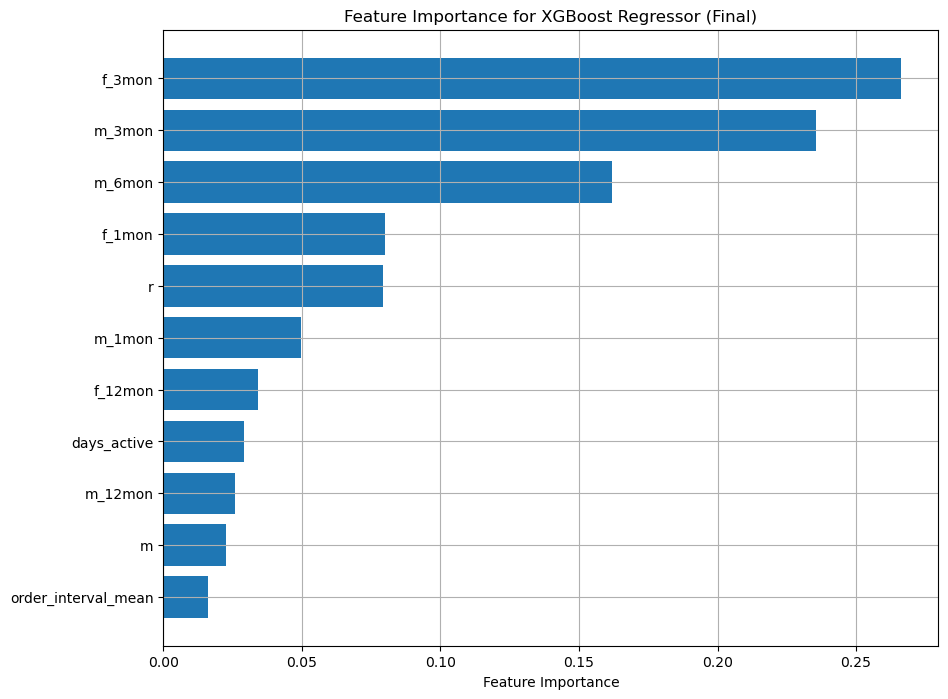

In [15]:
reg_xgb_final_importance = pd.DataFrame({
    'feature': X_train[selected_features_reg_xgb].columns,
    'importance': reg_model_xgb_final.feature_importances_
}).sort_values(by='importance', ascending=False)

plt.figure(figsize=(10, 8))
plt.barh(reg_xgb_final_importance['feature'], reg_xgb_final_importance['importance'])
plt.gca().invert_yaxis()
plt.xlabel('Feature Importance')
plt.title('Feature Importance for XGBoost Regressor (Final)')
plt.grid()
plt.show()

In [22]:
reg_xgb_final_importance

,feature,importance
7,f_3mon,0.266358
0,m_3mon,0.235363
6,m_6mon,0.161769
1,f_1mon,0.080048
3,r,0.079166
9,m_1mon,0.049607
2,f_12mon,0.034029
5,days_active,0.029057
8,m_12mon,0.025882
4,m,0.022648


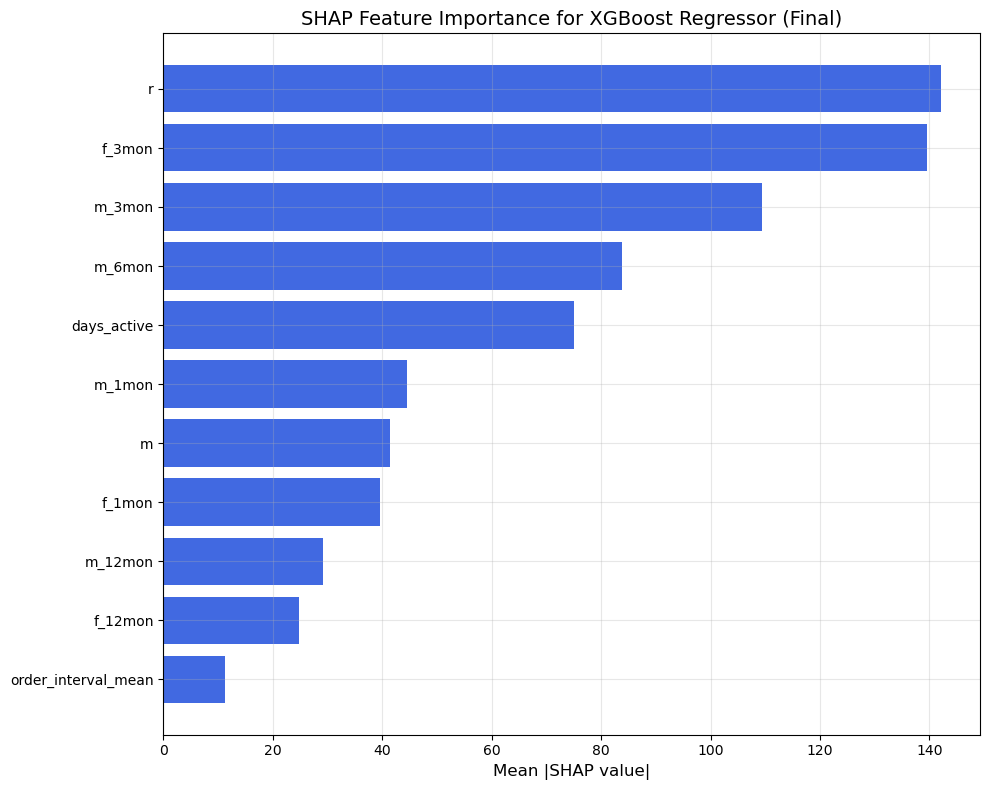

In [31]:
explainer_xgb = shap.Explainer(reg_model_xgb_final)

shap_values_xgb = explainer_xgb(X_test[selected_features_reg_xgb])

mean_shap_vals_xgb = np.abs(shap_values_xgb.values).mean(axis=0)
shap_importance_xgb = pd.DataFrame({
    'feature': X_test[selected_features_reg_xgb].columns,
    'mean_abs_shap': mean_shap_vals_xgb
}).sort_values(by='mean_abs_shap', ascending=False)

plt.figure(figsize=(10, 8))
plt.barh(shap_importance_xgb['feature'], shap_importance_xgb['mean_abs_shap'], color='royalblue')
plt.gca().invert_yaxis()
plt.xlabel('Mean |SHAP value|', fontsize=12)
plt.title('SHAP Feature Importance for XGBoost Regressor (Final)', fontsize=14)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

In [32]:
shap_importance_xgb

,feature,mean_abs_shap
3,r,142.125626
7,f_3mon,139.467941
0,m_3mon,109.416901
6,m_6mon,83.737869
5,days_active,75.114517
9,m_1mon,44.437263
4,m,41.418800
1,f_1mon,39.631363
8,m_12mon,29.184988
2,f_12mon,24.788921


#### Итоговая таблица с прогнозами ltv_monetary

In [122]:
df_reg_results = pd.DataFrame({
    'client_id': pd.concat([train_client_ids, test_client_ids], ignore_index=True),
    'ltv_monetary': pd.concat([y_train_monetary, y_test_monetary], ignore_index=True),
    'ltv_monetary_pred': np.concatenate([y_pred_train, y_pred_test]),
})

df_reg_results['ltv_monetary_error'] = df_reg_results['ltv_monetary_pred'] - df_reg_results['ltv_monetary']
df_reg_results['ltv_monetary_error_abs'] = np.abs(df_reg_results['ltv_monetary'] - df_reg_results['ltv_monetary_pred'])

In [ ]:
df_reg_results.sort_values(by='ltv_monetary_error_abs')

,client_id,ltv_monetary,ltv_monetary_pred,ltv_monetary_error,ltv_monetary_error_abs
70957,188101,114.0,114.001595,0.001595,0.001595
331382,194756,121.0,121.013435,0.013435,0.013435
42650,70671,538.0,537.969238,-0.030762,0.030762
8569,314201,1585.0,1584.959839,-0.040161,0.040161
362708,408220,625.0,624.927429,-0.072571,0.072571
...,...,...,...,...,...
165498,310293,44505.0,6707.103516,-37797.896484,37797.896484
48222,401151,39962.0,1269.170776,-38692.829224,38692.829224
158815,404182,54982.0,13678.832031,-41303.167969,41303.167969
195339,342841,49722.0,4593.541504,-45128.458496,45128.458496


## Modeling LTV response

In [11]:
# Функция для подсчета метрик эффективности классификационной модели
def print_classification_metrics(y_true, y_pred_labels, y_pred_probs, dataset_name):
    print(f"Метрики для {dataset_name}:")
    print(f"Accuracy: {accuracy_score(y_true, y_pred_labels):.4f}")
    print(f"ROC AUC:  {roc_auc_score(y_true, y_pred_probs):.4f}")
    print(f"Recall:   {recall_score(y_true, y_pred_labels):.4f}")
    print(f"Precision:{precision_score(y_true, y_pred_labels):.4f}")
    print(f"F1 Score: {f1_score(y_true, y_pred_labels):.4f}")
    print("-" * 40)

In [12]:
classification_results = pd.DataFrame(columns=[
    'Model', 'Accuracy (Test)', 'ROC_AUC (Test)', 'Recall (Test)', 'Precision (Test)', 'F1_Score (Test)'
])

def add_classification_results(model_name, y_true, y_pred_labels, y_pred_probs):
    global classification_results  
    
    new_row = {
        'Model': model_name,
        'Accuracy (Test)': accuracy_score(y_true, y_pred_labels),
        'ROC_AUC (Test)': roc_auc_score(y_true, y_pred_probs),
        'Recall (Test)': recall_score(y_true, y_pred_labels),
        'Precision (Test)': precision_score(y_true, y_pred_labels),
        'F1_Score (Test)': f1_score(y_true, y_pred_labels)
    }
    
    classification_results = pd.concat(
        [classification_results, pd.DataFrame([new_row])],
        ignore_index=True
    )

In [13]:
class_cv_results = pd.DataFrame()

def add_class_cv_results(cv_results, model_name):
    summary = pd.DataFrame([{
        'Model': model_name,
        'Accuracy_mean': np.mean(cv_results['test_accuracy']),
        'Accuracy_std': np.std(cv_results['test_accuracy']),
        'ROC_AUC_mean': np.mean(cv_results['test_roc_auc']),
        'ROC_AUC_std': np.std(cv_results['test_roc_auc']),
        'Recall_mean': np.mean(cv_results['test_recall']),
        'Recall_std': np.std(cv_results['test_recall']),
        'Precision_mean': np.mean(cv_results['test_precision']),
        'Precision_std': np.std(cv_results['test_precision']),
        'F1_mean': np.mean(cv_results['test_f1']),
        'F1_std': np.std(cv_results['test_f1'])
    }])
    global class_cv_results
    class_cv_results = pd.concat([class_cv_results, summary], ignore_index=True)

In [14]:
class_scoring = {
    'accuracy': make_scorer(accuracy_score),
    'roc_auc': make_scorer(roc_auc_score),
    'recall': make_scorer(recall_score),
    'precision': make_scorer(precision_score),
    'f1': make_scorer(f1_score)
}

In [84]:
# Функции для построения кривых ROC и Precision-Recall

def plot_roc_curve(y_true, y_pred_probs, model_name):

    fpr, tpr, thresholds = roc_curve(y_true, y_pred_probs)
    roc_auc = auc(fpr, tpr)

    plt.figure()
    plt.plot(fpr, tpr, label=f'{model_name} (AUC = {roc_auc:.4f})')
    plt.plot([0, 1], [0, 1], 'k--', label='Random Guess')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve')
    plt.legend(loc="lower right")
    plt.grid()
    plt.show()

def plot_precision_recall_curve(y_true, y_pred_probs, model_name):
    """
    Строит Precision-Recall кривую для модели.
    
    y_true: истинные значения (0/1)
    y_pred_probs: предсказанные вероятности положительного класса
    model_name: название модели (для подписи графика)
    """
    precision, recall, thresholds = precision_recall_curve(y_true, y_pred_probs)
    average_precision = average_precision_score(y_true, y_pred_probs)

    plt.figure()
    plt.plot(recall, precision, label=f'{model_name} (AP = {average_precision:.4f})')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title('Precision-Recall Curve')
    plt.legend(loc="lower left")
    plt.grid()
    plt.show()

### Selecting best models by comparing performance on base feature set

#### Logistic Regression

In [177]:
class_model_logreg = LogisticRegression(max_iter=1000, random_state=42)

class_model_logreg.fit(X_train_base, y_train_response)

c:\Users\demid.zhivonos\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression(max_iter=1000, random_state=42)

In [178]:
# Предсказания
y_train_pred_probs = class_model_logreg.predict_proba(X_train_base)[:, 1]
y_train_pred_labels = class_model_logreg.predict(X_train_base)

y_test_pred_probs = class_model_logreg.predict_proba(X_test_base)[:, 1]
y_test_pred_labels = class_model_logreg.predict(X_test_base)

In [179]:
print_classification_metrics(y_train_response, y_train_pred_labels, y_train_pred_probs, dataset_name="Train (Logistic Regression)")
print_classification_metrics(y_test_response, y_test_pred_labels, y_test_pred_probs, dataset_name="Test (Logistic Regression)")

Метрики для Train (Logistic Regression):
Accuracy: 0.7676
ROC AUC:  0.8140
Recall:   0.5669
Precision:0.7277
F1 Score: 0.6373
----------------------------------------
Метрики для Test (Logistic Regression):
Accuracy: 0.7652
ROC AUC:  0.8143
Recall:   0.5621
Precision:0.7273
F1 Score: 0.6341
----------------------------------------


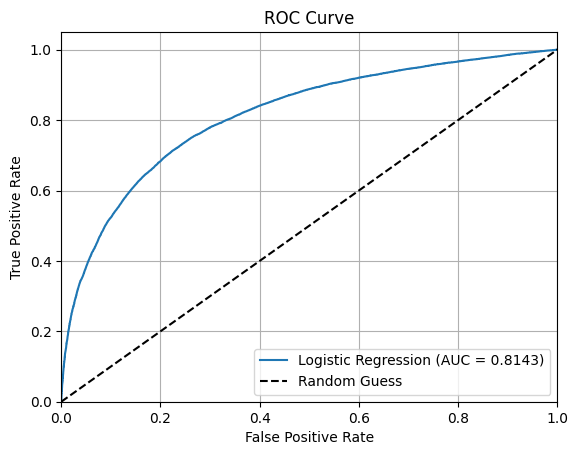

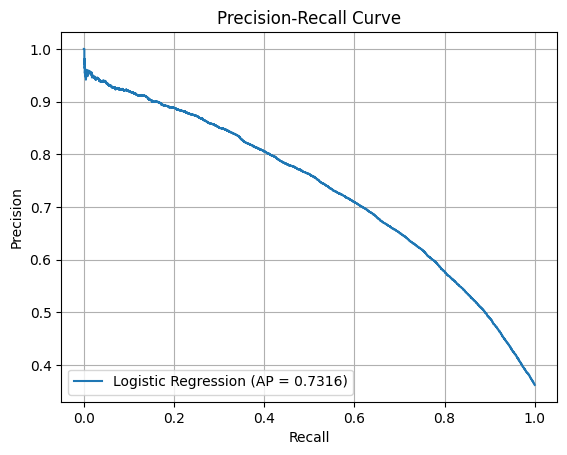

In [180]:
plot_roc_curve(y_test_response, y_test_pred_probs, model_name="Logistic Regression")
plot_precision_recall_curve(y_test_response, y_test_pred_probs, model_name="Logistic Regression")

In [181]:
add_classification_results(
    model_name="Logistic Regression",
    y_true=y_test_response,
    y_pred_labels=y_test_pred_labels,
    y_pred_probs=y_test_pred_probs
)

classification_results

C:\Users\demid.zhivonos\AppData\Local\Temp\ipykernel_22808\2195923517.py:27: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  classification_results = pd.concat(


,Model,Accuracy (Test),ROC_AUC (Test),Recall (Test),Precision (Test),F1_Score (Test)
0,Logistic Regression,0.765208,0.814281,0.562134,0.72729,0.634135


In [ ]:
# CV

In [26]:
class_model_logreg = LogisticRegression(max_iter=1000, random_state=42)

cv_results = cross_validate(
    class_model_logreg,
    X_base,
    y_response,
    cv=5,
    scoring=class_scoring,
    return_train_score=False
)

df_cv = pd.DataFrame(cv_results)[[
    'test_accuracy', 'test_roc_auc', 'test_recall', 'test_precision', 'test_f1'
]]
df_cv.loc['Mean'] = df_cv.mean()
df_cv.loc['Std'] = df_cv.std()

df_cv


/Users/demidzhivonos/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/demidzhivonos/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.

,test_accuracy,test_roc_auc,test_recall,test_precision,test_f1
0,0.795282,0.751428,0.594150,0.785874,0.676694
1,0.786172,0.747959,0.610910,0.749747,0.673245
2,0.783804,0.736459,0.566661,0.773186,0.654006
3,0.773293,0.742349,0.631366,0.708253,0.667603
4,0.641687,0.647167,0.666822,0.502379,0.573037
Mean,0.756048,0.725072,0.613982,0.703888,0.648917
Std,0.057607,0.039283,0.033871,0.104165,0.038720


In [27]:
add_class_cv_results(cv_results, "Logistic Regression")
class_cv_results

,Model,Accuracy_mean,Accuracy_std,ROC_AUC_mean,ROC_AUC_std,Recall_mean,Recall_std,Precision_mean,Precision_std,F1_mean,F1_std
0,XGBoost Classifier (Nested CV),0.773802,0.000965,0.733016,0.001218,0.586736,0.002899,0.732718,0.002103,0.651645,0.001834
1,LightGBM Classifier (Nested CV),0.773683,0.001034,0.732968,0.001141,0.586944,0.002543,0.732298,0.002484,0.651608,0.001677
2,Random Forest Classifier (Nested CV),0.773864,0.001082,0.733451,0.001149,0.588509,0.002546,0.731853,0.002669,0.652394,0.001677
3,Logistic Regression,0.756048,0.057607,0.725072,0.039283,0.613982,0.033871,0.703888,0.104165,0.648917,0.038720


#### Random Forest Classifier

In [ ]:
class_model_rand_forest = RandomForestClassifier(
    n_estimators=100,      
    max_depth=None,        
    random_state=42,
    n_jobs=-1               
)

class_model_rand_forest.fit(X_train_base, y_train_response)

RandomForestClassifier(n_jobs=-1, random_state=42)

In [ ]:
y_train_pred_probs = class_model_rand_forest.predict_proba(X_train_base)[:, 1]
y_train_pred_labels = class_model_rand_forest.predict(X_train_base)

y_test_pred_probs = class_model_rand_forest.predict_proba(X_test_base)[:, 1]
y_test_pred_labels = class_model_rand_forest.predict(X_test_base)

In [ ]:
print_classification_metrics(y_train_response, y_train_pred_labels, y_train_pred_probs, dataset_name="Train (Random Forest Classifier)")
print_classification_metrics(y_test_response, y_test_pred_labels, y_test_pred_probs, dataset_name="Test (Random Forest Classifier)")

Метрики для Train (Random Forest):
Accuracy: 0.9788
ROC AUC:  0.9980
Recall:   0.9560
Precision:0.9847
F1 Score: 0.9701
----------------------------------------
Метрики для Test (Random Forest):
Accuracy: 0.7361
ROC AUC:  0.7764
Recall:   0.6007
Precision:0.6456
F1 Score: 0.6223
----------------------------------------


In [ ]:
# Модель переобучилась, поэтому попробуем ограничить сложность модели, чтобы уменьшить переобучение и добиться честного качества

In [182]:
class_model_rand_forest = RandomForestClassifier(
    n_estimators=100,
    max_depth=7,            
    min_samples_leaf=10,    
    random_state=42,
    n_jobs=-1
)

class_model_rand_forest.fit(X_train_base, y_train_response)

RandomForestClassifier(max_depth=7, min_samples_leaf=10, n_jobs=-1,
                       random_state=42)

In [183]:
y_train_pred_probs = class_model_rand_forest.predict_proba(X_train_base)[:, 1]
y_train_pred_labels = class_model_rand_forest.predict(X_train_base)

y_test_pred_probs = class_model_rand_forest.predict_proba(X_test_base)[:, 1]
y_test_pred_labels = class_model_rand_forest.predict(X_test_base)

In [184]:
print_classification_metrics(y_train_response, y_train_pred_labels, y_train_pred_probs, dataset_name="Train (Random Forest Classifier tuned)")
print_classification_metrics(y_test_response, y_test_pred_labels, y_test_pred_probs, dataset_name="Test (Random Forest Classifier tuned)")

Метрики для Train (Random Forest Classifier tuned):
Accuracy: 0.7747
ROC AUC:  0.8208
Recall:   0.5931
Precision:0.7307
F1 Score: 0.6547
----------------------------------------
Метрики для Test (Random Forest Classifier tuned):
Accuracy: 0.7721
ROC AUC:  0.8189
Recall:   0.5884
Precision:0.7296
F1 Score: 0.6514
----------------------------------------


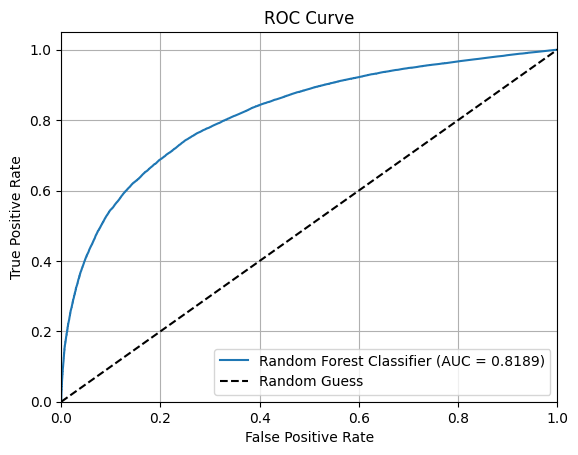

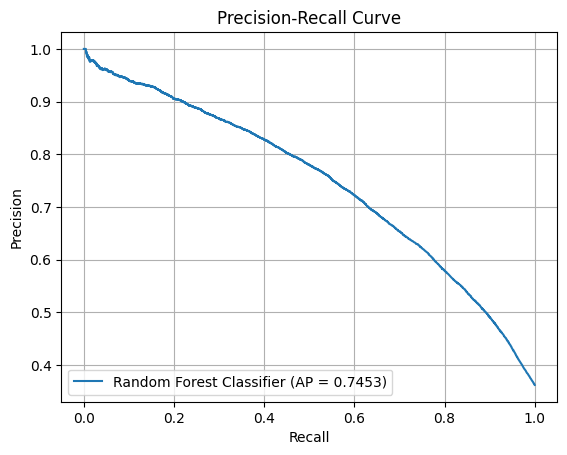

In [185]:
plot_roc_curve(y_test_response, y_test_pred_probs, model_name="Random Forest Classifier")
plot_precision_recall_curve(y_test_response, y_test_pred_probs, model_name="Random Forest Classifier")

In [186]:
add_classification_results(
    model_name="Random Forest Classifier",
    y_true=y_test_response,
    y_pred_labels=y_test_pred_labels,
    y_pred_probs=y_test_pred_probs
)

classification_results

,Model,Accuracy (Test),ROC_AUC (Test),Recall (Test),Precision (Test),F1_Score (Test)
0,Logistic Regression,0.765208,0.814281,0.562134,0.727290,0.634135
1,Random Forest Classifier,0.772054,0.818922,0.588374,0.729554,0.651402


In [ ]:
# CV

In [23]:
param_dist = {
    'n_estimators': [50, 100, 150, 200],
    'max_depth': [4, 5, 6, 7, 8],
    'min_samples_leaf': [1, 3, 5, 10],
    'min_samples_split': [2, 4, 6, 8],
    'max_features': ['sqrt', 'log2', 0.6, 0.8]
}

rf_base = RandomForestClassifier(random_state=42, n_jobs=-1)

inner_cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)
random_search = RandomizedSearchCV(
    estimator=rf_base,
    param_distributions=param_dist,
    scoring='roc_auc',
    n_iter=30,
    cv=inner_cv,
    n_jobs=-1,
    verbose=0,
    random_state=42
)

outer_cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

cv_results = cross_validate(
    random_search,
    X_base,
    y_response,
    cv=outer_cv,
    scoring=class_scoring,
    return_train_score=False
)

In [24]:
df_cv = pd.DataFrame(cv_results)[[
    'test_accuracy', 'test_roc_auc', 'test_recall', 'test_precision', 'test_f1'
]]
df_cv.loc['Mean'] = df_cv.mean()
df_cv.loc['Std'] = df_cv.std()

df_cv

,test_accuracy,test_roc_auc,test_recall,test_precision,test_f1
0,0.772144,0.732037,0.588193,0.727701,0.650552
1,0.774344,0.734508,0.591638,0.731249,0.654077
2,0.773128,0.732078,0.584856,0.732088,0.650241
3,0.774561,0.734546,0.591028,0.732151,0.654064
4,0.775144,0.734086,0.586829,0.736079,0.653035
Mean,0.773864,0.733451,0.588509,0.731853,0.652394
Std,0.001082,0.001149,0.002546,0.002669,0.001677


In [25]:
add_class_cv_results(cv_results, "Random Forest Classifier (Nested CV)")
class_cv_results

,Model,Accuracy_mean,Accuracy_std,ROC_AUC_mean,ROC_AUC_std,Recall_mean,Recall_std,Precision_mean,Precision_std,F1_mean,F1_std
0,XGBoost Classifier (Nested CV),0.773802,0.000965,0.733016,0.001218,0.586736,0.002899,0.732718,0.002103,0.651645,0.001834
1,LightGBM Classifier (Nested CV),0.773683,0.001034,0.732968,0.001141,0.586944,0.002543,0.732298,0.002484,0.651608,0.001677
2,Random Forest Classifier (Nested CV),0.773864,0.001082,0.733451,0.001149,0.588509,0.002546,0.731853,0.002669,0.652394,0.001677


In [88]:
class_model_rand_forest = RandomForestClassifier(
    n_estimators=100,
    max_depth=7,            
    min_samples_leaf=10,    
    random_state=42,
    n_jobs=-1
)

cv_results = cross_validate(
    class_model_rand_forest,
    X_base,
    y_response,
    cv=5,
    scoring=class_scoring,
    return_train_score=False
)

df_cv = pd.DataFrame(cv_results)[[
    'test_accuracy', 'test_roc_auc', 'test_recall', 'test_precision', 'test_f1'
]]
df_cv.loc['Mean'] = df_cv.mean()
df_cv.loc['Std'] = df_cv.std()

df_cv

,test_accuracy,test_roc_auc,test_recall,test_precision,test_f1
0,0.671636,0.546331,0.096932,0.927541,0.175521
1,0.766994,0.713072,0.519684,0.758048,0.616633
2,0.727021,0.657292,0.407213,0.712572,0.518258
3,0.413091,0.448929,0.577463,0.323952,0.415059
4,0.362402,0.501417,1.000000,0.361245,0.530757
Mean,0.588229,0.573408,0.520258,0.616672,0.451245
Std,0.167241,0.097932,0.291688,0.235267,0.151986


In [89]:
add_class_cv_results(cv_results, "Random Forest Classifier")
class_cv_results

,Model,Accuracy_mean,Accuracy_std,ROC_AUC_mean,ROC_AUC_std,Recall_mean,Recall_std,Precision_mean,Precision_std,F1_mean,F1_std
0,Logistic Regression,0.756048,0.057607,0.725072,0.039283,0.613982,0.033871,0.703888,0.104165,0.648917,0.038720
1,Random Forest Classifier,0.588229,0.167241,0.573408,0.097932,0.520258,0.291688,0.616672,0.235267,0.451245,0.151986


#### XGBoost Classifier

In [187]:
class_model_xgb = XGBClassifier(
    n_estimators=100,      
    max_depth=5,           
    learning_rate=0.1,     
    subsample=0.8,         
    colsample_bytree=0.8,  
    random_state=42,
    use_label_encoder=False, 
    eval_metric='logloss'    
)

class_model_xgb.fit(X_train_base, y_train_response)

c:\Users\demid.zhivonos\AppData\Local\Programs\Python\Python312\Lib\site-packages\xgboost\training.py:183: UserWarning: [09:01:11] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.8, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='logloss',
              feature_types=None, feature_weights=None, gamma=None,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.1, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=5, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=100, n_jobs=None,
              num_parallel_tree=None, ...)

In [188]:
y_train_pred_probs = class_model_xgb.predict_proba(X_train_base)[:, 1]
y_train_pred_labels = class_model_xgb.predict(X_train_base)

y_test_pred_probs = class_model_xgb.predict_proba(X_test_base)[:, 1]
y_test_pred_labels = class_model_xgb.predict(X_test_base)

In [189]:
print_classification_metrics(y_train_response, y_train_pred_labels, y_train_pred_probs, dataset_name="Train (XGBoost Classifier)")
print_classification_metrics(y_test_response, y_test_pred_labels, y_test_pred_probs, dataset_name="Test (XGBoost Classifier)")

Метрики для Train (XGBoost Classifier):
Accuracy: 0.7761
ROC AUC:  0.8231
Recall:   0.5916
Precision:0.7350
F1 Score: 0.6556
----------------------------------------
Метрики для Test (XGBoost Classifier):
Accuracy: 0.7735
ROC AUC:  0.8201
Recall:   0.5859
Precision:0.7345
F1 Score: 0.6518
----------------------------------------


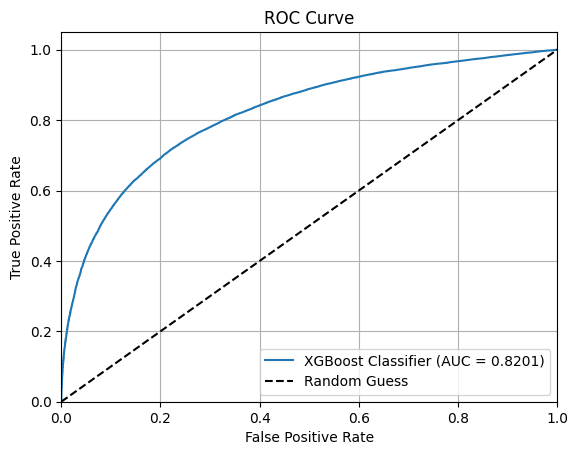

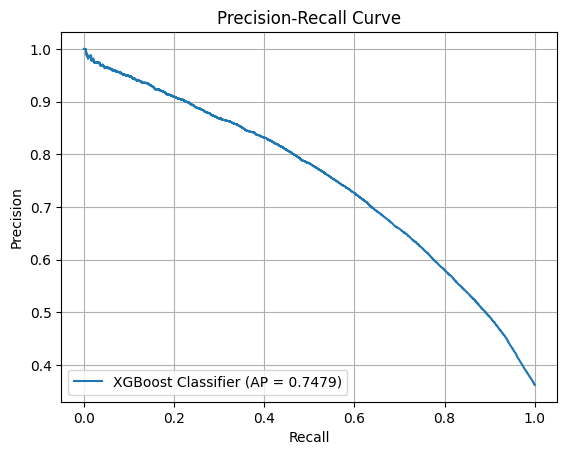

In [190]:
plot_roc_curve(y_test_response, y_test_pred_probs, model_name="XGBoost Classifier")
plot_precision_recall_curve(y_test_response, y_test_pred_probs, model_name="XGBoost Classifier")

In [191]:
add_classification_results(
    model_name="XGBoost Classifier",
    y_true=y_test_response,
    y_pred_labels=y_test_pred_labels,
    y_pred_probs=y_test_pred_probs
)

classification_results

,Model,Accuracy (Test),ROC_AUC (Test),Recall (Test),Precision (Test),F1_Score (Test)
0,Logistic Regression,0.765208,0.814281,0.562134,0.727290,0.634135
1,Random Forest Classifier,0.772054,0.818922,0.588374,0.729554,0.651402
2,XGBoost Classifier,0.773451,0.820116,0.585872,0.734526,0.651831


In [ ]:
# CV

In [15]:
from sklearn.model_selection import cross_validate, StratifiedKFold

In [16]:
param_dist = {
    'n_estimators': [50, 100, 150, 200],
    'max_depth': [3, 4, 5, 6],
    'learning_rate': [0.01, 0.03, 0.05, 0.1],
    'subsample': [0.7, 0.8, 0.9],
    'colsample_bytree': [0.7, 0.8, 0.9],
    'gamma': [0, 0.1, 0.3],
    'min_child_weight': [1, 2, 3]
}

xgb_base = XGBClassifier(
    objective='binary:logistic',
    use_label_encoder=False,
    eval_metric='logloss',
    random_state=42
)

inner_cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)
random_search = RandomizedSearchCV(
    estimator=xgb_base,
    param_distributions=param_dist,
    scoring='roc_auc',
    n_iter=30,
    cv=inner_cv,
    n_jobs=-1,
    verbose=0,
    random_state=42
)

outer_cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

cv_results = cross_validate(
    random_search,
    X_base,
    y_response,
    cv=outer_cv,
    scoring=class_scoring,
    return_train_score=False
)


/Users/demidzhivonos/anaconda3/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [07:51:46] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/Users/demidzhivonos/anaconda3/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [07:51:46] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/Users/demidzhivonos/anaconda3/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [07:51:46] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/Users/demidzhivonos/anaconda3/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [07:51:46] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:738: 
Parameters: { "use_

In [17]:
df_cv = pd.DataFrame(cv_results)[[
    'test_accuracy', 'test_roc_auc', 'test_recall', 'test_precision', 'test_f1'
]]
df_cv.loc['Mean'] = df_cv.mean()
df_cv.loc['Std'] = df_cv.std()

df_cv

,test_accuracy,test_roc_auc,test_recall,test_precision,test_f1
0,0.772157,0.731429,0.585358,0.729342,0.649465
1,0.774422,0.734271,0.590275,0.732226,0.653632
2,0.773244,0.731770,0.583025,0.733454,0.649645
3,0.774548,0.734317,0.590023,0.732698,0.653666
4,0.774639,0.733292,0.584999,0.735870,0.651818
Mean,0.773802,0.733016,0.586736,0.732718,0.651645
Std,0.000965,0.001218,0.002899,0.002103,0.001834


In [18]:
add_class_cv_results(cv_results, "XGBoost Classifier (Nested CV)")
class_cv_results

,Model,Accuracy_mean,Accuracy_std,ROC_AUC_mean,ROC_AUC_std,Recall_mean,Recall_std,Precision_mean,Precision_std,F1_mean,F1_std
0,XGBoost Classifier (Nested CV),0.773802,0.000965,0.733016,0.001218,0.586736,0.002899,0.732718,0.002103,0.651645,0.001834


#### LightGBM Classifier 

In [192]:
class_model_lgbm = LGBMClassifier(
    n_estimators=100,        
    max_depth=5,             
    learning_rate=0.1,       
    subsample=0.8,           
    colsample_bytree=0.8,    
    random_state=42,
    n_jobs=-1                
)

class_model_lgbm.fit(X_train_base, y_train_response)

[LightGBM] [Info] Number of positive: 111353, number of negative: 197753
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001294 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2340
[LightGBM] [Info] Number of data points in the train set: 309106, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.360242 -> initscore=-0.574313
[LightGBM] [Info] Start training from score -0.574313
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

LGBMClassifier(colsample_bytree=0.8, max_depth=5, n_jobs=-1, random_state=42,
               subsample=0.8)

In [193]:
y_train_pred_probs = class_model_lgbm.predict_proba(X_train_base)[:, 1]
y_train_pred_labels = class_model_lgbm.predict(X_train_base)

y_test_pred_probs = class_model_lgbm.predict_proba(X_test_base)[:, 1]
y_test_pred_labels = class_model_lgbm.predict(X_test_base)

In [194]:
print_classification_metrics(y_train_response, y_train_pred_labels, y_train_pred_probs, dataset_name="Train (LightGBM Classifier)")
print_classification_metrics(y_test_response, y_test_pred_labels, y_test_pred_probs, dataset_name="Test (LightGBM Classifier)")

Метрики для Train (LightGBM Classifier):
Accuracy: 0.7757
ROC AUC:  0.8230
Recall:   0.5907
Precision:0.7347
F1 Score: 0.6549
----------------------------------------
Метрики для Test (LightGBM Classifier):
Accuracy: 0.7734
ROC AUC:  0.8199
Recall:   0.5859
Precision:0.7343
F1 Score: 0.6518
----------------------------------------


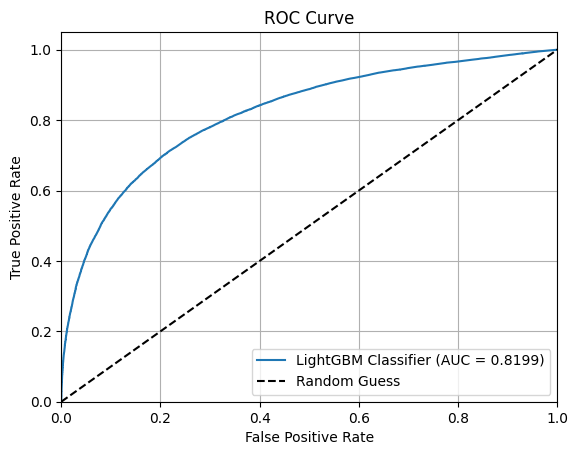

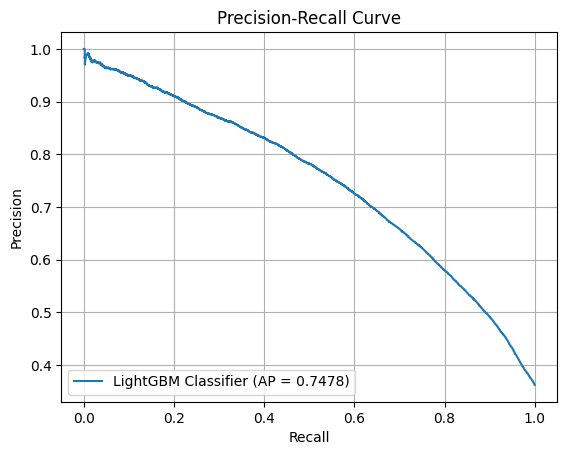

In [195]:
plot_roc_curve(y_test_response, y_test_pred_probs, model_name="LightGBM Classifier")
plot_precision_recall_curve(y_test_response, y_test_pred_probs, model_name="LightGBM Classifier")

In [196]:
add_classification_results(
    model_name="LightGBM Classifier",
    y_true=y_test_response,
    y_pred_labels=y_test_pred_labels,
    y_pred_probs=y_test_pred_probs
)

classification_results

,Model,Accuracy (Test),ROC_AUC (Test),Recall (Test),Precision (Test),F1_Score (Test)
0,Logistic Regression,0.765208,0.814281,0.562134,0.727290,0.634135
1,Random Forest Classifier,0.772054,0.818922,0.588374,0.729554,0.651402
2,XGBoost Classifier,0.773451,0.820116,0.585872,0.734526,0.651831
3,LightGBM Classifier,0.773374,0.819882,0.585907,0.734307,0.651767


In [ ]:
# CV

In [20]:
param_dist = {
    'n_estimators': [50, 100, 150, 200],
    'max_depth': [3, 4, 5, 6],
    'learning_rate': [0.01, 0.03, 0.05, 0.1],
    'subsample': [0.7, 0.8, 0.9],
    'colsample_bytree': [0.7, 0.8, 0.9],
    'num_leaves': [15, 31, 63],
    'min_child_samples': [10, 20, 30]
}

lgbm_base = LGBMClassifier(random_state=42)

inner_cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)
random_search = RandomizedSearchCV(
    estimator=lgbm_base,
    param_distributions=param_dist,
    scoring='roc_auc',
    n_iter=30,
    cv=inner_cv,
    n_jobs=-1,
    verbose=0,
    random_state=42
)

outer_cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

cv_results = cross_validate(
    random_search,
    X_base,
    y_response,
    cv=outer_cv,
    scoring=class_scoring,
    return_train_score=False
)

[LightGBM] [Info] Number of positive: 74306, number of negative: 131764
[LightGBM] [Info] Number of positive: 74307, number of negative: 131764
[LightGBM] [Info] Number of positive: 74307, number of negative: 131764
[LightGBM] [Info] Number of positive: 74306, number of negative: 131764
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.138371 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2340
[LightGBM] [Info] Number of data points in the train set: 206070, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.360586 -> initscore=-0.572821
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.117208 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2341
[LightGBM] [Info] Number of data points in the train set: 206071, number of used features: 11
[LightGBM] [Info] Start training from score -0.57282

In [21]:
df_cv = pd.DataFrame(cv_results)[[
    'test_accuracy', 'test_roc_auc', 'test_recall', 'test_precision', 'test_f1'
]]
df_cv.loc['Mean'] = df_cv.mean()
df_cv.loc['Std'] = df_cv.std()

df_cv

,test_accuracy,test_roc_auc,test_recall,test_precision,test_f1
0,0.772041,0.731463,0.585932,0.728721,0.649572
1,0.774344,0.734336,0.590849,0.731701,0.653774
2,0.772921,0.731799,0.584317,0.731874,0.649824
3,0.774315,0.733900,0.588947,0.732732,0.653018
4,0.774794,0.733343,0.584676,0.736461,0.651849
Mean,0.773683,0.732968,0.586944,0.732298,0.651608
Std,0.001034,0.001141,0.002543,0.002484,0.001677


In [22]:
add_class_cv_results(cv_results, "LightGBM Classifier (Nested CV)")
class_cv_results

,Model,Accuracy_mean,Accuracy_std,ROC_AUC_mean,ROC_AUC_std,Recall_mean,Recall_std,Precision_mean,Precision_std,F1_mean,F1_std
0,XGBoost Classifier (Nested CV),0.773802,0.000965,0.733016,0.001218,0.586736,0.002899,0.732718,0.002103,0.651645,0.001834
1,LightGBM Classifier (Nested CV),0.773683,0.001034,0.732968,0.001141,0.586944,0.002543,0.732298,0.002484,0.651608,0.001677


#### Models comparison

In [197]:
classification_results

,Model,Accuracy (Test),ROC_AUC (Test),Recall (Test),Precision (Test),F1_Score (Test)
0,Logistic Regression,0.765208,0.814281,0.562134,0.727290,0.634135
1,Random Forest Classifier,0.772054,0.818922,0.588374,0.729554,0.651402
2,XGBoost Classifier,0.773451,0.820116,0.585872,0.734526,0.651831
3,LightGBM Classifier,0.773374,0.819882,0.585907,0.734307,0.651767


In [28]:
class_cv_results

,Model,Accuracy_mean,Accuracy_std,ROC_AUC_mean,ROC_AUC_std,Recall_mean,Recall_std,Precision_mean,Precision_std,F1_mean,F1_std
0,XGBoost Classifier (Nested CV),0.773802,0.000965,0.733016,0.001218,0.586736,0.002899,0.732718,0.002103,0.651645,0.001834
1,LightGBM Classifier (Nested CV),0.773683,0.001034,0.732968,0.001141,0.586944,0.002543,0.732298,0.002484,0.651608,0.001677
2,Random Forest Classifier (Nested CV),0.773864,0.001082,0.733451,0.001149,0.588509,0.002546,0.731853,0.002669,0.652394,0.001677
3,Logistic Regression,0.756048,0.057607,0.725072,0.039283,0.613982,0.033871,0.703888,0.104165,0.648917,0.038720


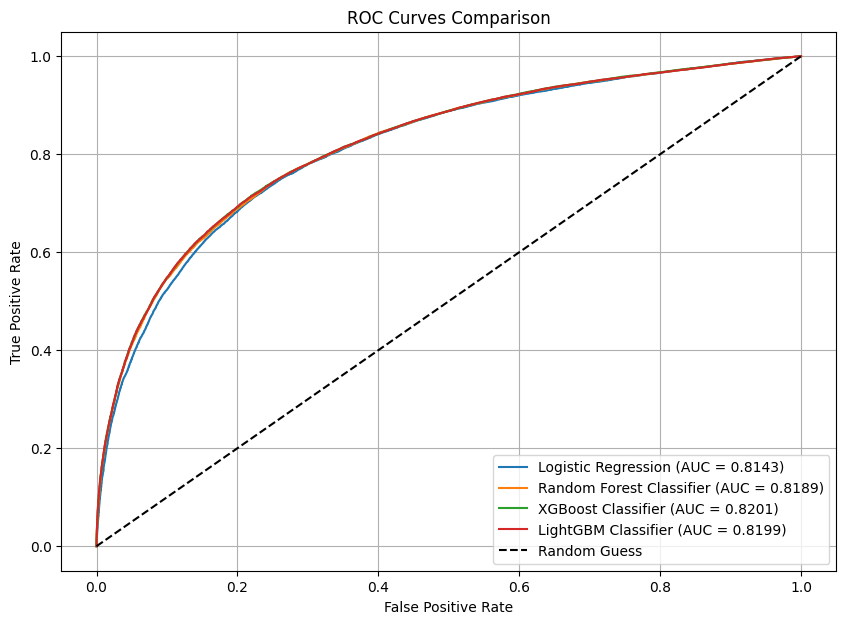

In [198]:
model_preds = {
    'Logistic Regression': class_model_logreg.predict_proba(X_test_base)[:, 1],
    'Random Forest Classifier': class_model_rand_forest.predict_proba(X_test_base)[:, 1],
    'XGBoost Classifier': class_model_xgb.predict_proba(X_test_base)[:, 1],
    'LightGBM Classifier': class_model_lgbm.predict_proba(X_test_base)[:, 1]
}

plt.figure(figsize=(10, 7))
for model_name, y_pred_probs in model_preds.items():
    fpr, tpr, _ = roc_curve(y_test_response, y_pred_probs)
    auc_score = roc_auc_score(y_test_response, y_pred_probs)
    plt.plot(fpr, tpr, label=f'{model_name} (AUC = {auc_score:.4f})')

plt.plot([0, 1], [0, 1], 'k--', label='Random Guess')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves Comparison')
plt.legend(loc='lower right')
plt.grid()
plt.show()

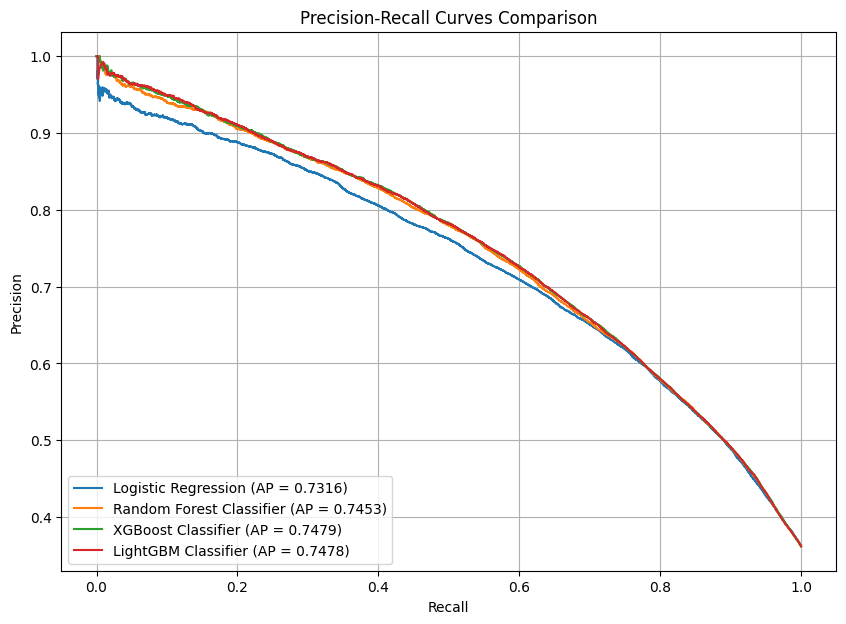

In [199]:
plt.figure(figsize=(10, 7))
for model_name, y_pred_probs in model_preds.items():
    precision, recall, _ = precision_recall_curve(y_test_response, y_pred_probs)
    ap_score = average_precision_score(y_test_response, y_pred_probs)
    plt.plot(recall, precision, label=f'{model_name} (AP = {ap_score:.4f})')

plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curves Comparison')
plt.legend(loc='lower left')
plt.grid()
plt.show()

### Hyperparameter tuning and feature selection for best models (XGBoost Classifier, LightGBM Classifier) 

#### XGBosst Classifier

##### Обучим XGBosst Classifier на полном наборе признаков

In [201]:
class_model_xgb_full = XGBClassifier(
    n_estimators=100,
    max_depth=5,
    learning_rate=0.1,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=42,
    use_label_encoder=False,
    eval_metric='logloss'
)

class_model_xgb_full.fit(X_train, y_train_response)

c:\Users\demid.zhivonos\AppData\Local\Programs\Python\Python312\Lib\site-packages\xgboost\training.py:183: UserWarning: [09:03:35] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.8, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='logloss',
              feature_types=None, feature_weights=None, gamma=None,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.1, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=5, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=100, n_jobs=None,
              num_parallel_tree=None, ...)

In [203]:
y_train_pred_probs = class_model_xgb_full.predict_proba(X_train)[:, 1]
y_train_pred_labels = class_model_xgb_full.predict(X_train)

y_test_pred_probs = class_model_xgb_full.predict_proba(X_test)[:, 1]
y_test_pred_labels = class_model_xgb_full.predict(X_test)

print_classification_metrics(y_train_response, y_train_pred_labels, y_train_pred_probs, dataset_name="Train (XGBoost Classifier Full Features)")
print_classification_metrics(y_test_response, y_test_pred_labels, y_test_pred_probs, dataset_name="Test (XGBoost Classifier Full Features)")

Метрики для Train (XGBoost Classifier Full Features):
Accuracy: 0.7763
ROC AUC:  0.8232
Recall:   0.5903
Precision:0.7364
F1 Score: 0.6553
----------------------------------------
Метрики для Test (XGBoost Classifier Full Features):
Accuracy: 0.7736
ROC AUC:  0.8203
Recall:   0.5852
Precision:0.7354
F1 Score: 0.6518
----------------------------------------


In [204]:
add_classification_results(
    model_name="XGBoost Classifier (Full Features)",
    y_true=y_test_response,
    y_pred_labels=y_test_pred_labels,
    y_pred_probs=y_test_pred_probs
)

classification_results

,Model,Accuracy (Test),ROC_AUC (Test),Recall (Test),Precision (Test),F1_Score (Test)
0,Logistic Regression,0.765208,0.814281,0.562134,0.727290,0.634135
1,Random Forest Classifier,0.772054,0.818922,0.588374,0.729554,0.651402
2,XGBoost Classifier,0.773451,0.820116,0.585872,0.734526,0.651831
3,LightGBM Classifier,0.773374,0.819882,0.585907,0.734307,0.651767
4,XGBoost Classifier (Full Features),0.773645,0.820252,0.585228,0.735400,0.651776


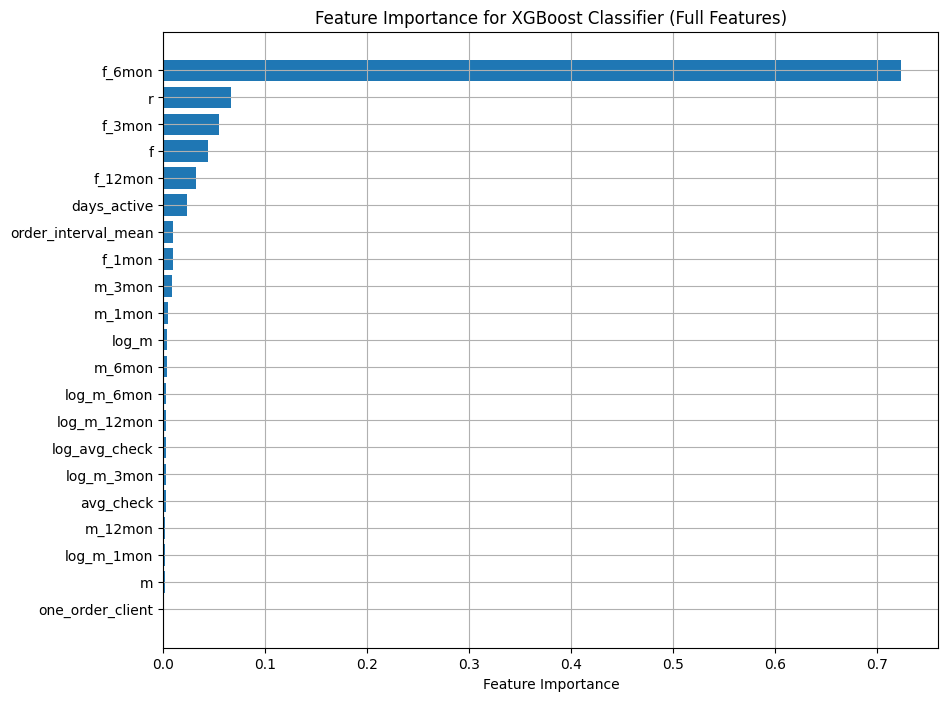

In [205]:
importances = class_model_xgb_full.feature_importances_

class_xgb_importance = pd.DataFrame({
    'feature': X_train.columns,
    'importance': importances
}).sort_values(by='importance', ascending=False)

plt.figure(figsize=(10, 8))
plt.barh(class_xgb_importance['feature'], class_xgb_importance['importance'])
plt.gca().invert_yaxis()
plt.xlabel('Feature Importance')
plt.title('Feature Importance for XGBoost Classifier (Full Features)')
plt.grid()
plt.show()

In [206]:
class_xgb_importance

,feature,importance
15,f_6mon,0.724263
0,r,0.066146
12,f_3mon,0.055065
1,f,0.043699
18,f_12mon,0.031780
3,days_active,0.023222
7,order_interval_mean,0.009743
9,f_1mon,0.009205
13,m_3mon,0.008169
10,m_1mon,0.004228


##### Forward Selection for XGBoost Classifier

In [ ]:
cv_folds = 5
scoring_metric = 'roc_auc'

selected_features = []
remaining_features = list(X_train.columns)
history = []

step = 0

while remaining_features:
    step += 1
    scores = []

    for feature in tqdm(remaining_features, desc=f"Шаг {step}: перебор признаков", leave=False):
        features_to_try = selected_features + [feature]
        
        model = XGBClassifier(
            n_estimators=100,
            max_depth=5,
            learning_rate=0.1,
            subsample=0.8,
            colsample_bytree=0.8,
            random_state=42,
            use_label_encoder=False,
            eval_metric='logloss'
        )
        
        cv_score = cross_val_score(
            model,
            X_train[features_to_try],
            y_train_response,
            cv=cv_folds,
            scoring=scoring_metric,
            n_jobs=-1
        ).mean()
        
        scores.append((feature, cv_score))
    
    best_feature, best_score = sorted(scores, key=lambda x: x[1], reverse=True)[0]
    
    selected_features.append(best_feature)
    remaining_features.remove(best_feature)
    
    history.append({
        'step': step,
        'added_feature': best_feature,
        'roc_auc_cv': best_score,
        'n_features': len(selected_features)
    })
    
    print(f"Шаг {step}: добавлен признак '{best_feature}' с ROC AUC = {best_score:.4f}")

df_class_model_xgb_fs_res = pd.DataFrame(history)
df_class_model_xgb_fs_res['roc_auc_gain'] = df_class_model_xgb_fs_res['roc_auc_cv'].diff()

df_class_model_xgb_fs_res.to_csv('class_model_xgb_feature_forward_selection_results.csv', index=False)

In [207]:
df_class_model_xgb_fs_res = pd.read_csv('class_model_xgb_feature_forward_selection_results.csv')
df_class_model_xgb_fs_res

,step,added_feature,roc_auc_cv,n_features,roc_auc_gain
0,1,f_6mon,0.784678,1,NaN
1,2,r,0.805073,2,2.039545e-02
2,3,days_active,0.818641,3,1.356769e-02
3,4,m,0.819616,4,9.754719e-04
4,5,f,0.819987,5,3.711348e-04
5,6,f_12mon,0.820065,6,7.776458e-05
6,7,f_1mon,0.820089,7,2.357852e-05
7,8,f_3mon,0.820143,8,5.375707e-05
8,9,order_interval_mean,0.820169,9,2.608279e-05
9,10,m_6mon,0.820231,10,6.228553e-05


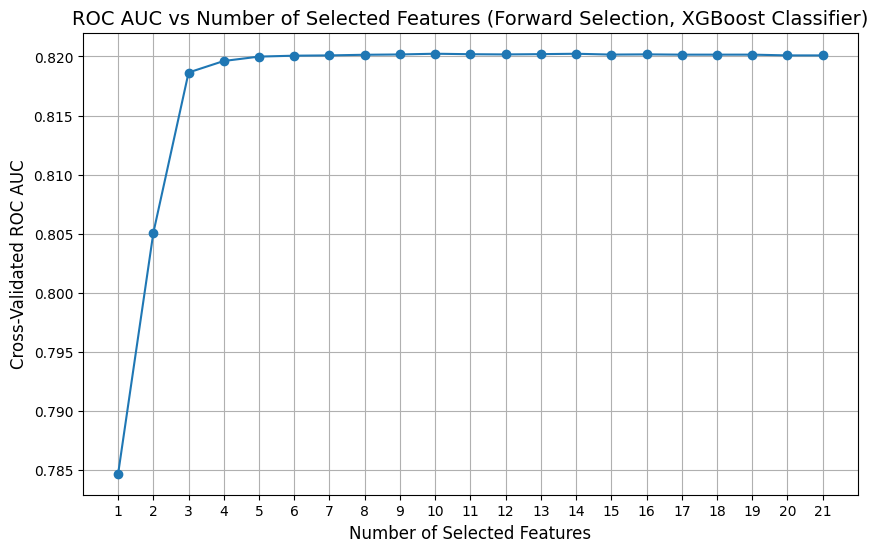

In [208]:
plt.figure(figsize=(10, 6))
plt.plot(df_class_model_xgb_fs_res['n_features'], df_class_model_xgb_fs_res['roc_auc_cv'], marker='o')

plt.xlabel('Number of Selected Features', fontsize=12)
plt.ylabel('Cross-Validated ROC AUC', fontsize=12)
plt.title('ROC AUC vs Number of Selected Features (Forward Selection, XGBoost Classifier)', fontsize=14)
plt.xticks(df_class_model_xgb_fs_res['n_features'])  
plt.grid(True)
plt.show()

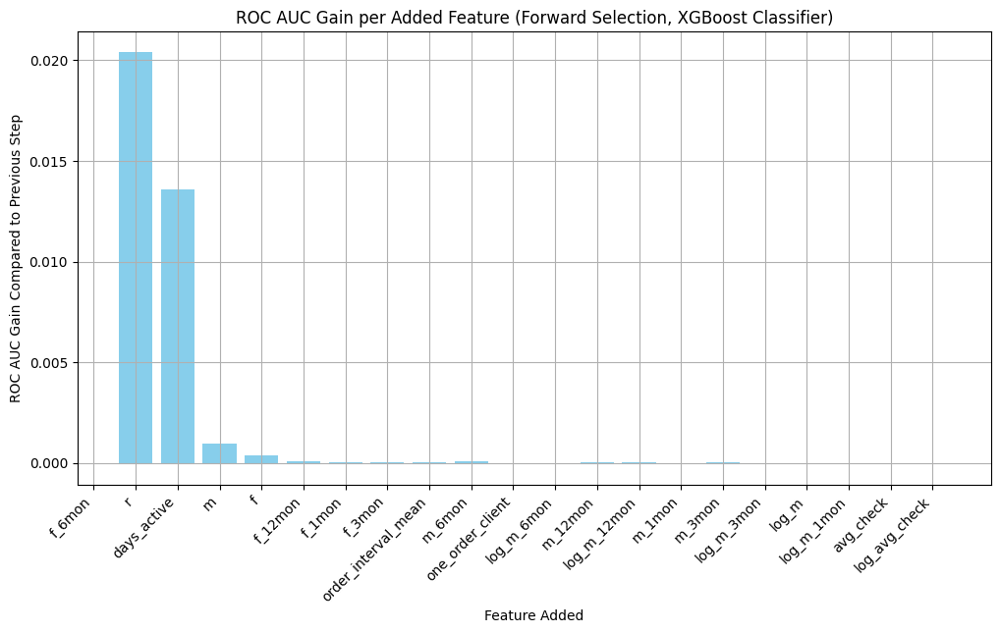

In [209]:
plt.figure(figsize=(12, 6))
plt.bar(df_class_model_xgb_fs_res['added_feature'], df_class_model_xgb_fs_res['roc_auc_gain'], color='skyblue')
plt.xticks(rotation=45, ha='right')
plt.xlabel('Feature Added')
plt.ylabel('ROC AUC Gain Compared to Previous Step')
plt.title('ROC AUC Gain per Added Feature (Forward Selection, XGBoost Classifier)')
plt.grid()
plt.show()

##### Построим модель с оптимальным набором признаков

In [ ]:
selected_features_class_xgb = [
    'f_6mon',
    'r',
    'days_active',
    'm',
    'f',
    'f_12mon',
    'f_1mon',
    'f_3mon',
    'order_interval_mean',
    'm_6mon'
]

class_model_xgb_selected = XGBClassifier(
    n_estimators=100,
    max_depth=5,
    learning_rate=0.1,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=42,
    use_label_encoder=False,
    eval_metric='logloss'
)

class_model_xgb_selected.fit(X_train[selected_features_class_xgb], y_train_response)

c:\Users\demid.zhivonos\AppData\Local\Programs\Python\Python312\Lib\site-packages\xgboost\training.py:183: UserWarning: [09:09:50] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.8, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='logloss',
              feature_types=None, feature_weights=None, gamma=None,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.1, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=5, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=100, n_jobs=None,
              num_parallel_tree=None, ...)

In [ ]:
y_train_pred_probs = class_model_xgb_selected.predict_proba(X_train[selected_features_class_xgb])[:, 1]
y_train_pred_labels = class_model_xgb_selected.predict(X_train[selected_features_class_xgb])

y_test_pred_probs = class_model_xgb_selected.predict_proba(X_test[selected_features_class_xgb])[:, 1]
y_test_pred_labels = class_model_xgb_selected.predict(X_test[selected_features_class_xgb])

print_classification_metrics(y_train_response, y_train_pred_labels, y_train_pred_probs, dataset_name="Train (XGBoost Classifier Selected Features)")
print_classification_metrics(y_test_response, y_test_pred_labels, y_test_pred_probs, dataset_name="Test (XGBoost Classifier Selected Features)")

Метрики для Train (XGBoost Classifier Selected Features):
Accuracy: 0.7760
ROC AUC:  0.8229
Recall:   0.5908
Precision:0.7353
F1 Score: 0.6552
----------------------------------------
Метрики для Test (XGBoost Classifier Selected Features):
Accuracy: 0.7740
ROC AUC:  0.8202
Recall:   0.5865
Precision:0.7356
F1 Score: 0.6526
----------------------------------------


In [212]:
add_classification_results(
    model_name="XGBoost Classifier (Selected Features)",
    y_true=y_test_response,
    y_pred_labels=y_test_pred_labels,
    y_pred_probs=y_test_pred_probs
)

classification_results

,Model,Accuracy (Test),ROC_AUC (Test),Recall (Test),Precision (Test),F1_Score (Test)
0,Logistic Regression,0.765208,0.814281,0.562134,0.727290,0.634135
1,Random Forest Classifier,0.772054,0.818922,0.588374,0.729554,0.651402
2,XGBoost Classifier,0.773451,0.820116,0.585872,0.734526,0.651831
3,LightGBM Classifier,0.773374,0.819882,0.585907,0.734307,0.651767
4,XGBoost Classifier (Full Features),0.773645,0.820252,0.585228,0.735400,0.651776
5,XGBoost Classifier (Selected Features),0.773995,0.820244,0.586479,0.735551,0.652611


##### Тюнинг гиперпараметров с помощью RandomizedSearchCV для XGBoost Classifier с оптимальным набором признаков

In [ ]:
param_distributions = {
    'n_estimators': randint(100, 500),
    'max_depth': randint(3, 10),
    'learning_rate': uniform(0.01, 0.29),  
    'subsample': uniform(0.5, 0.5),        
    'colsample_bytree': uniform(0.5, 0.5),  
    'gamma': uniform(0, 5),
    'min_child_weight': randint(1, 10)
}

In [ ]:
class_model_xgb_for_search = XGBClassifier(
    random_state=42,
    use_label_encoder=False,
    eval_metric='logloss'
)

random_search = RandomizedSearchCV(
    class_model_xgb_for_search,
    param_distributions=param_distributions,
    n_iter=100,                 
    scoring='roc_auc',
    n_jobs=-1,
    cv=5,
    verbose=2,
    random_state=42,
    return_train_score=True
)

random_search.fit(X_train[selected_features_class_xgb], y_train_response)

cv_results = pd.DataFrame(random_search.cv_results_)

df_class_model_xgb_random_search_res = cv_results[[
    'mean_test_score', 'std_test_score', 'rank_test_score',
    'param_n_estimators', 'param_max_depth', 'param_learning_rate',
    'param_subsample', 'param_colsample_bytree', 'param_gamma', 'param_min_child_weight'
]].sort_values(by='rank_test_score')

df_class_model_xgb_random_search_res.to_csv('class_model_xgb_random_search_results.csv', index=False)

In [213]:
df_class_model_xgb_random_search_res = pd.read_csv('class_model_xgb_random_search_results.csv')

df_class_model_xgb_random_search_res.head(10)

,mean_test_score,std_test_score,rank_test_score,param_n_estimators,param_max_depth,param_learning_rate,param_subsample,param_colsample_bytree,param_gamma,param_min_child_weight
0,0.820309,0.001844,1,185,5,0.032324,0.940234,0.877776,1.143991,3
1,0.820300,0.001849,2,354,5,0.033447,0.901570,0.776447,2.963484,1
2,0.820251,0.001857,3,319,5,0.042247,0.785737,0.712111,4.531772,2
3,0.820238,0.001875,4,175,6,0.038996,0.677453,0.694809,1.488176,9
4,0.820238,0.001900,5,348,4,0.036391,0.756995,0.818322,2.774078,4
5,0.820208,0.001848,6,449,7,0.034751,0.770318,0.607911,3.114452,4
6,0.820207,0.001824,7,408,5,0.106775,0.984955,0.549987,2.296244,6
7,0.820192,0.001911,8,250,4,0.030421,0.570042,0.922107,4.650084,6
8,0.820172,0.001837,9,312,7,0.022516,0.996482,0.506077,4.849394,6
9,0.820149,0.001899,10,485,4,0.121771,0.842117,0.971101,2.816441,5


##### Построим итоговую модель XGBoost Classifier с оптимальным набором признаков и гиперпараметров

In [214]:
best_params_xgb = {
    'n_estimators': 185,
    'max_depth': 5,
    'learning_rate': 0.032324,
    'subsample': 0.940234,
    'colsample_bytree': 0.877776,
    'gamma': 1.143991,
    'min_child_weight': 3
}

In [ ]:
class_model_xgb_final = XGBClassifier(
    **best_params_xgb,
    random_state=42,
    use_label_encoder=False,
    eval_metric='logloss'
)

class_model_xgb_final.fit(X_train[selected_features_class_xgb], y_train_response)

c:\Users\demid.zhivonos\AppData\Local\Programs\Python\Python312\Lib\site-packages\xgboost\training.py:183: UserWarning: [09:12:52] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.877776, device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric='logloss', feature_types=None, feature_weights=None,
              gamma=1.143991, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.032324,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=5, max_leaves=None,
              min_child_weight=3, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=185, n_jobs=None,
              num_parallel_tree=None, ...)

In [ ]:
y_train_pred_probs = class_model_xgb_final.predict_proba(X_train[selected_features_class_xgb])[:, 1]
y_train_pred_labels = class_model_xgb_final.predict(X_train[selected_features_class_xgb])

y_test_pred_probs = class_model_xgb_final.predict_proba(X_test[selected_features_class_xgb])[:, 1]
y_test_pred_labels = class_model_xgb_final.predict(X_test[selected_features_class_xgb])

print_classification_metrics(y_train_response, y_train_pred_labels, y_train_pred_probs, dataset_name="Train (XGBoost Classifier Tuned)")
print_classification_metrics(y_test_response, y_test_pred_labels, y_test_pred_probs, dataset_name="Test (XGBoost Classifier Tuned)")

Метрики для Train (XGBoost Classifier Tuned):
Accuracy: 0.7754
ROC AUC:  0.8221
Recall:   0.5898
Precision:0.7343
F1 Score: 0.6542
----------------------------------------
Метрики для Test (XGBoost Classifier Tuned):
Accuracy: 0.7742
ROC AUC:  0.8204
Recall:   0.5854
Precision:0.7367
F1 Score: 0.6524
----------------------------------------


In [218]:
add_classification_results(
    model_name="XGBoost Classifier (Final)",
    y_true=y_test_response,
    y_pred_labels=y_test_pred_labels,
    y_pred_probs=y_test_pred_probs
)

classification_results

,Model,Accuracy (Test),ROC_AUC (Test),Recall (Test),Precision (Test),F1_Score (Test)
0,Logistic Regression,0.765208,0.814281,0.562134,0.727290,0.634135
1,Random Forest Classifier,0.772054,0.818922,0.588374,0.729554,0.651402
2,XGBoost Classifier,0.773451,0.820116,0.585872,0.734526,0.651831
3,LightGBM Classifier,0.773374,0.819882,0.585907,0.734307,0.651767
4,XGBoost Classifier (Full Features),0.773645,0.820252,0.585228,0.735400,0.651776
5,XGBoost Classifier (Selected Features),0.773995,0.820244,0.586479,0.735551,0.652611
6,XGBoost Classifier (Final),0.774189,0.820394,0.585371,0.736705,0.652377


#### LightGBM Classifier

##### Обучим LightGBM Classifier на полном наборе признаков

In [219]:
class_model_lgbm_full = LGBMClassifier(
    n_estimators=100,
    max_depth=5,
    learning_rate=0.1,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=42,
    n_jobs=-1
)

class_model_lgbm_full.fit(X_train, y_train_response)

[LightGBM] [Info] Number of positive: 111353, number of negative: 197753
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007627 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3941
[LightGBM] [Info] Number of data points in the train set: 309106, number of used features: 21
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.360242 -> initscore=-0.574313
[LightGBM] [Info] Start training from score -0.574313
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

LGBMClassifier(colsample_bytree=0.8, max_depth=5, n_jobs=-1, random_state=42,
               subsample=0.8)

In [220]:
y_train_pred_probs = class_model_lgbm_full.predict_proba(X_train)[:, 1]
y_train_pred_labels = class_model_lgbm_full.predict(X_train)

y_test_pred_probs = class_model_lgbm_full.predict_proba(X_test)[:, 1]
y_test_pred_labels = class_model_lgbm_full.predict(X_test)

print_classification_metrics(y_train_response, y_train_pred_labels, y_train_pred_probs, dataset_name="Train (LightGBM Classifier Full Features)")
print_classification_metrics(y_test_response, y_test_pred_labels, y_test_pred_probs, dataset_name="Test (LightGBM Classifier Full Features)")

Метрики для Train (LightGBM Classifier Full Features):
Accuracy: 0.7759
ROC AUC:  0.8232
Recall:   0.5903
Precision:0.7354
F1 Score: 0.6550
----------------------------------------
Метрики для Test (LightGBM Classifier Full Features):
Accuracy: 0.7739
ROC AUC:  0.8203
Recall:   0.5851
Precision:0.7360
F1 Score: 0.6519
----------------------------------------


In [221]:
add_classification_results(
    model_name="LightGBM Classifier (Full Features)",
    y_true=y_test_response,
    y_pred_labels=y_test_pred_labels,
    y_pred_probs=y_test_pred_probs
)

classification_results

,Model,Accuracy (Test),ROC_AUC (Test),Recall (Test),Precision (Test),F1_Score (Test)
0,Logistic Regression,0.765208,0.814281,0.562134,0.727290,0.634135
1,Random Forest Classifier,0.772054,0.818922,0.588374,0.729554,0.651402
2,XGBoost Classifier,0.773451,0.820116,0.585872,0.734526,0.651831
3,LightGBM Classifier,0.773374,0.819882,0.585907,0.734307,0.651767
4,XGBoost Classifier (Full Features),0.773645,0.820252,0.585228,0.735400,0.651776
5,XGBoost Classifier (Selected Features),0.773995,0.820244,0.586479,0.735551,0.652611
6,XGBoost Classifier (Final),0.774189,0.820394,0.585371,0.736705,0.652377
7,LightGBM Classifier (Full Features),0.773853,0.820285,0.585121,0.735992,0.651942


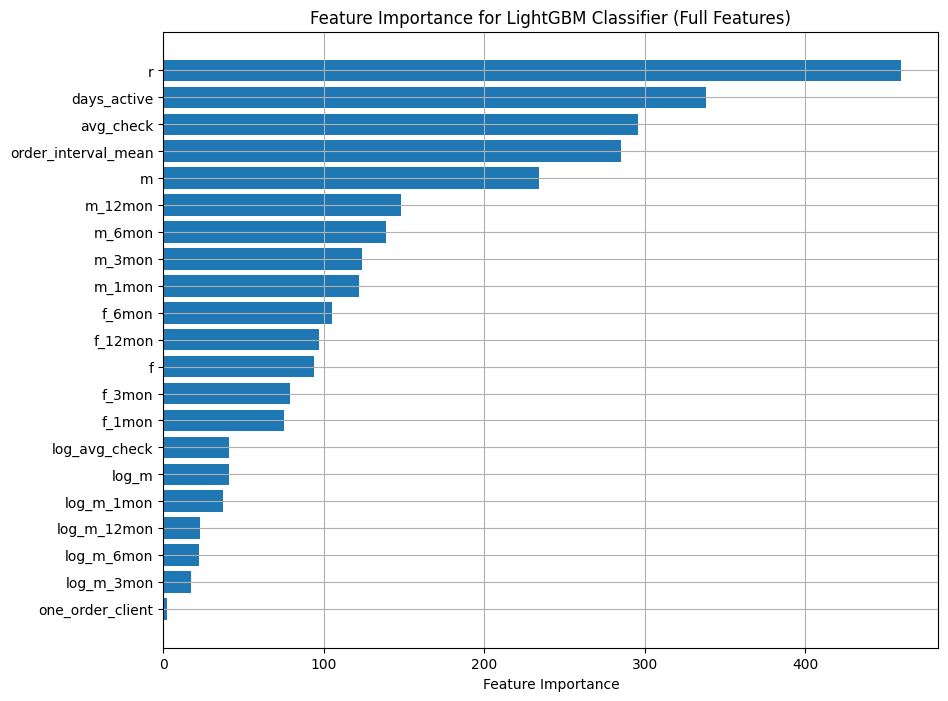

In [222]:
importances = class_model_lgbm_full.feature_importances_

class_lgbm_importance = pd.DataFrame({
    'feature': X_train.columns,
    'importance': importances
}).sort_values(by='importance', ascending=False)

plt.figure(figsize=(10, 8))
plt.barh(class_lgbm_importance['feature'], class_lgbm_importance['importance'])
plt.gca().invert_yaxis()
plt.xlabel('Feature Importance')
plt.title('Feature Importance for LightGBM Classifier (Full Features)')
plt.grid()
plt.show()

In [223]:
class_lgbm_importance

,feature,importance
0,r,460
3,days_active,338
4,avg_check,296
7,order_interval_mean,285
2,m,234
19,m_12mon,148
16,m_6mon,139
13,m_3mon,124
10,m_1mon,122
15,f_6mon,105


##### Forward Selection for LightGBM Classifier

In [ ]:
selected_features_lgbm = []
remaining_features_lgbm = list(X_train.columns)
history_lgbm = []

step = 0
while remaining_features_lgbm:
    step += 1
    scores = []

    for feature in remaining_features_lgbm:
        features_to_try = selected_features_lgbm + [feature]

        model = LGBMClassifier(
            n_estimators=100,
            max_depth=5,
            learning_rate=0.1,
            subsample=0.8,
            colsample_bytree=0.8,
            random_state=42,
            n_jobs=-1
        )

        cv_score = cross_val_score(
            model,
            X_train[features_to_try],
            y_train_response,
            cv=5,
            scoring='roc_auc',
            n_jobs=-1
        ).mean()

        scores.append((feature, cv_score))

    best_feature, best_score = sorted(scores, key=lambda x: x[1], reverse=True)[0]
    selected_features_lgbm.append(best_feature)
    remaining_features_lgbm.remove(best_feature)

    history_lgbm.append({
        'step': step,
        'added_feature': best_feature,
        'roc_auc_cv': best_score,
        'n_features': len(selected_features_lgbm)
    })

    print(f"Step {step}: added '{best_feature}' → AUC = {best_score:.4f}")

df_class_model_lgbm_fs_res = pd.DataFrame(history_lgbm)
df_class_model_lgbm_fs_res['roc_auc_gain'] = df_class_model_lgbm_fs_res['roc_auc_cv'].diff()

df_class_model_lgbm_fs_res.to_csv('class_model_lgbm_feature_forward_selection_results.csv', index=False)

[LightGBM] [Info] Number of positive: 89082, number of negative: 158203
[LightGBM] [Info] Number of positive: 89083, number of negative: 158202
[LightGBM] [Info] Number of positive: 89082, number of negative: 158202
[LightGBM] [Info] Number of positive: 89083, number of negative: 158202
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019601 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 252
[LightGBM] [Info] Number of data points in the train set: 247285, number of used features: 1
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013031 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 253
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007458 second

In [224]:
df_class_model_lgbm_fs_res = pd.read_csv('class_model_lgbm_feature_forward_selection_results.csv')

df_class_model_lgbm_fs_res

,step,added_feature,roc_auc_cv,n_features,roc_auc_gain
0,1,f_6mon,0.784678,1,NaN
1,2,r,0.806068,2,0.021391
2,3,days_active,0.817998,3,0.011930
3,4,log_m,0.819576,4,0.001578
4,5,f_12mon,0.819925,5,0.000349
5,6,order_interval_mean,0.820045,6,0.000120
6,7,f_3mon,0.820088,7,0.000043
7,8,m_3mon,0.820130,8,0.000043
8,9,m_12mon,0.820134,9,0.000003
9,10,f_1mon,0.820154,10,0.000020


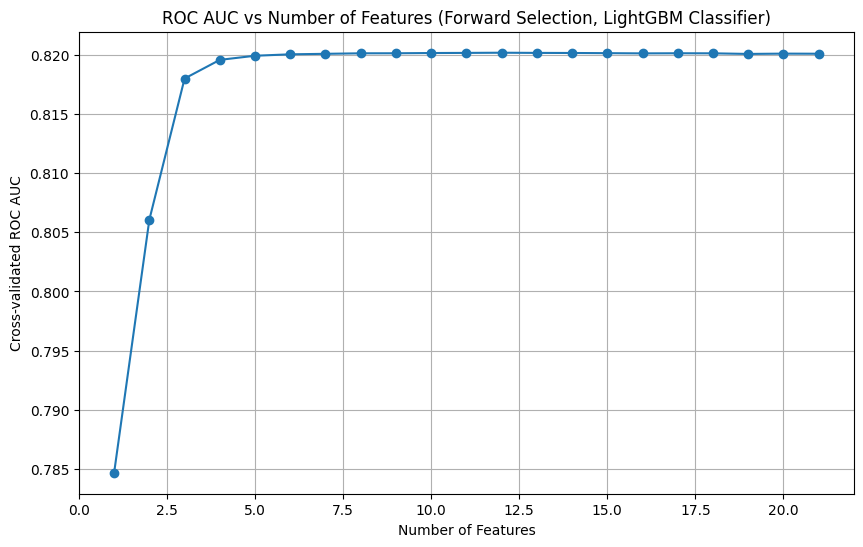

In [225]:
plt.figure(figsize=(10, 6))
plt.plot(df_class_model_lgbm_fs_res['n_features'], df_class_model_lgbm_fs_res['roc_auc_cv'], marker='o')
plt.xlabel('Number of Features')
plt.ylabel('Cross-validated ROC AUC')
plt.title('ROC AUC vs Number of Features (Forward Selection, LightGBM Classifier)')
plt.grid()
plt.show()

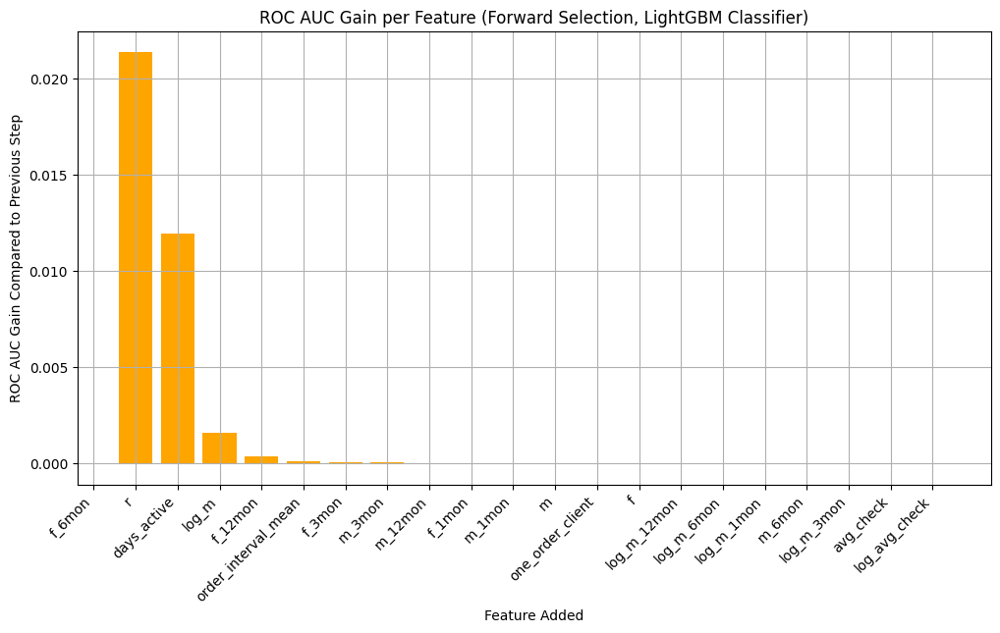

In [227]:
plt.figure(figsize=(12, 6))
plt.bar(df_class_model_lgbm_fs_res['added_feature'], df_class_model_lgbm_fs_res['roc_auc_gain'], color='orange')
plt.xticks(rotation=45, ha='right')
plt.xlabel('Feature Added')
plt.ylabel('ROC AUC Gain Compared to Previous Step')
plt.title('ROC AUC Gain per Feature (Forward Selection, LightGBM Classifier)')
plt.grid()
plt.show()

##### Построим модель LightGBM Classifier с набором признаков, который показал наивысшый ROC AUC

In [ ]:
selected_features_class_lgbm = [
    'f_6mon',
    'r',
    'days_active',
    'log_m',
    'f_12mon',
    'order_interval_mean',
    'f_3mon',
    'm_3mon'
]

In [ ]:
class_model_lgbm_selected = LGBMClassifier(
    n_estimators=100,
    max_depth=5,
    learning_rate=0.1,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=42,
    n_jobs=-1
)

class_model_lgbm_selected.fit(X_train[selected_features_class_lgbm], y_train_response)

[LightGBM] [Info] Number of positive: 111353, number of negative: 197753
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001115 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1344
[LightGBM] [Info] Number of data points in the train set: 309106, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.360242 -> initscore=-0.574313
[LightGBM] [Info] Start training from score -0.574313
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

LGBMClassifier(colsample_bytree=0.8, max_depth=5, n_jobs=-1, random_state=42,
               subsample=0.8)

In [ ]:
y_train_pred_probs = class_model_lgbm_selected.predict_proba(X_train[selected_features_class_lgbm])[:, 1]
y_train_pred_labels = class_model_lgbm_selected.predict(X_train[selected_features_class_lgbm])

y_test_pred_probs = class_model_lgbm_selected.predict_proba(X_test[selected_features_class_lgbm])[:, 1]
y_test_pred_labels = class_model_lgbm_selected.predict(X_test[selected_features_class_lgbm])

print_classification_metrics(y_train_response, y_train_pred_labels, y_train_pred_probs, dataset_name="Train (LightGBM Classifier Selected Features)")
print_classification_metrics(y_test_response, y_test_pred_labels, y_test_pred_probs, dataset_name="Test (LightGBM Classifier Selected Features)")

Метрики для Train (LightGBM Classifier Selected Features):
Accuracy: 0.7757
ROC AUC:  0.8227
Recall:   0.5889
Precision:0.7356
F1 Score: 0.6541
----------------------------------------
Метрики для Test (LightGBM Classifier Selected Features):
Accuracy: 0.7738
ROC AUC:  0.8201
Recall:   0.5850
Precision:0.7360
F1 Score: 0.6518
----------------------------------------


In [231]:
add_classification_results(
    model_name="LightGBM Classifier (Selected Features)",
    y_true=y_test_response,
    y_pred_labels=y_test_pred_labels,
    y_pred_probs=y_test_pred_probs
)

classification_results

,Model,Accuracy (Test),ROC_AUC (Test),Recall (Test),Precision (Test),F1_Score (Test)
0,Logistic Regression,0.765208,0.814281,0.562134,0.727290,0.634135
1,Random Forest Classifier,0.772054,0.818922,0.588374,0.729554,0.651402
2,XGBoost Classifier,0.773451,0.820116,0.585872,0.734526,0.651831
3,LightGBM Classifier,0.773374,0.819882,0.585907,0.734307,0.651767
4,XGBoost Classifier (Full Features),0.773645,0.820252,0.585228,0.735400,0.651776
5,XGBoost Classifier (Selected Features),0.773995,0.820244,0.586479,0.735551,0.652611
6,XGBoost Classifier (Final),0.774189,0.820394,0.585371,0.736705,0.652377
7,LightGBM Classifier (Full Features),0.773853,0.820285,0.585121,0.735992,0.651942
8,LightGBM Classifier (Selected Features),0.773814,0.820128,0.584978,0.735978,0.651847


##### Тюнинг гиперпараметров с помощью RandomizedSearchCV для LightGBM Classifier с оптимальным набором признаков

In [ ]:
param_dist_lgbm = {
    'n_estimators': randint(100, 500),
    'max_depth': randint(3, 10),
    'learning_rate': uniform(0.01, 0.29),
    'subsample': uniform(0.5, 0.5),
    'colsample_bytree': uniform(0.5, 0.5),
    'min_child_weight': randint(1, 10),
    'reg_alpha': uniform(0, 5),
    'reg_lambda': uniform(0, 5)
}

lgbm_model_for_search = LGBMClassifier(
    random_state=42,
    n_jobs=-1
)

random_search_lgbm = RandomizedSearchCV(
    estimator=lgbm_model_for_search,
    param_distributions=param_dist_lgbm,
    n_iter=100,
    scoring='roc_auc',
    cv=5,
    verbose=2,
    n_jobs=-1,
    return_train_score=True
)

random_search_lgbm.fit(X_train[selected_features_class_lgbm], y_train_response)

cv_results_lgbm = pd.DataFrame(random_search_lgbm.cv_results_)

df_class_model_lgbm_random_search_res = cv_results_lgbm[[
    'mean_test_score', 'std_test_score', 'rank_test_score',
    'param_n_estimators', 'param_max_depth', 'param_learning_rate',
    'param_subsample', 'param_colsample_bytree', 'param_min_child_weight',
    'param_reg_alpha', 'param_reg_lambda'
]].sort_values(by='rank_test_score')

df_class_model_lgbm_random_search_res.to_csv('class_model_lgbm_random_search_results.csv', index=False)


Fitting 5 folds for each of 100 candidates, totalling 500 fits
[LightGBM] [Info] Number of positive: 89083, number of negative: 158202
[LightGBM] [Info] Number of positive: 89083, number of negative: 158202
[LightGBM] [Info] Number of positive: 89082, number of negative: 158203
[LightGBM] [Info] Number of positive: 89082, number of negative: 158202
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.072879 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1344
[LightGBM] [Info] Number of data points in the train set: 247285, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.360244 -> initscore=-0.574304
[LightGBM] [Info] Start training from score -0.574304
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.056659 seconds.
You can set `force_col_wise=true` to remove the overhead.[LightGBM] [Info] Auto-choosing col-wise multi-threading, the ove

In [232]:
df_class_model_lgbm_random_search_res = pd.read_csv('class_model_lgbm_random_search_results.csv')

df_class_model_lgbm_random_search_res.head(10)

,mean_test_score,std_test_score,rank_test_score,param_n_estimators,param_max_depth,param_learning_rate,param_subsample,param_colsample_bytree,param_min_child_weight,param_reg_alpha,param_reg_lambda
0,0.820232,0.001856,1,317,5,0.022868,0.648285,0.762478,2,2.296329,2.055464
1,0.820222,0.001847,2,309,6,0.021226,0.956531,0.743060,7,3.271993,0.518510
2,0.820219,0.001864,3,377,9,0.019826,0.754621,0.699243,7,1.427932,3.976590
3,0.820185,0.001889,4,211,6,0.044147,0.823512,0.971254,2,2.639255,4.514081
4,0.820168,0.001856,5,174,9,0.036383,0.561406,0.814258,3,1.460583,2.586930
5,0.820168,0.001865,6,149,4,0.107558,0.701520,0.685373,7,3.743522,3.345353
6,0.820166,0.001872,7,112,9,0.068093,0.924892,0.817987,6,4.795000,4.534579
7,0.820148,0.001871,8,393,4,0.024060,0.618917,0.886575,4,4.555978,1.076631
8,0.820140,0.001904,9,445,6,0.023711,0.805956,0.921931,9,4.570930,4.773351
9,0.820138,0.001896,10,317,4,0.039064,0.922590,0.752490,4,3.843069,0.819812


##### Построим итоговую модель LightGBM Classifier с оптимальным набором признаков и гиперпараметров

In [233]:
best_params_lgbm = {
    'n_estimators': 317,
    'max_depth': 5,
    'learning_rate': 0.022868,
    'subsample': 0.648285,
    'colsample_bytree': 0.762478,
    'min_child_weight': 2,
    'reg_alpha': 2.296329,
    'reg_lambda': 2.055464
}

In [ ]:
class_model_lgbm_final = LGBMClassifier(
    **best_params_lgbm,
    random_state=42,
    n_jobs=-1
)

class_model_lgbm_final.fit(X_train[selected_features_class_lgbm], y_train_response)

[LightGBM] [Info] Number of positive: 111353, number of negative: 197753
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001212 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1344
[LightGBM] [Info] Number of data points in the train set: 309106, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.360242 -> initscore=-0.574313
[LightGBM] [Info] Start training from score -0.574313
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

LGBMClassifier(colsample_bytree=0.762478, learning_rate=0.022868, max_depth=5,
               min_child_weight=2, n_estimators=317, n_jobs=-1, random_state=42,
               reg_alpha=2.296329, reg_lambda=2.055464, subsample=0.648285)

In [ ]:
y_train_pred_probs = class_model_lgbm_final.predict_proba(X_train[selected_features_class_lgbm])[:, 1]
y_train_pred_labels = class_model_lgbm_final.predict(X_train[selected_features_class_lgbm])

y_test_pred_probs = class_model_lgbm_final.predict_proba(X_test[selected_features_class_lgbm])[:, 1]
y_test_pred_labels = class_model_lgbm_final.predict(X_test[selected_features_class_lgbm])

print_classification_metrics(y_train_response, y_train_pred_labels, y_train_pred_probs, dataset_name="Train (LightGBM Classifier Final)")
print_classification_metrics(y_test_response, y_test_pred_labels, y_test_pred_probs, dataset_name="Test (LightGBM Classifier Final)")

Метрики для Train (LightGBM Tuned):
Accuracy: 0.7751
ROC AUC:  0.8221
Recall:   0.5901
Precision:0.7336
F1 Score: 0.6541
----------------------------------------
Метрики для Test (LightGBM Tuned):
Accuracy: 0.7741
ROC AUC:  0.8203
Recall:   0.5871
Precision:0.7355
F1 Score: 0.6530
----------------------------------------


In [241]:
add_classification_results(
    model_name="LightGBM Classifier (Final)",
    y_true=y_test_response,
    y_pred_labels=y_test_pred_labels,
    y_pred_probs=y_test_pred_probs
)

classification_results

,Model,Accuracy (Test),ROC_AUC (Test),Recall (Test),Precision (Test),F1_Score (Test)
0,Logistic Regression,0.765208,0.814281,0.562134,0.727290,0.634135
1,Random Forest Classifier,0.772054,0.818922,0.588374,0.729554,0.651402
2,XGBoost Classifier,0.773451,0.820116,0.585872,0.734526,0.651831
3,LightGBM Classifier,0.773374,0.819882,0.585907,0.734307,0.651767
4,XGBoost Classifier (Full Features),0.773645,0.820252,0.585228,0.735400,0.651776
5,XGBoost Classifier (Selected Features),0.773995,0.820244,0.586479,0.735551,0.652611
6,XGBoost Classifier (Final),0.774189,0.820394,0.585371,0.736705,0.652377
7,LightGBM Classifier (Full Features),0.773853,0.820285,0.585121,0.735992,0.651942
8,LightGBM Classifier (Selected Features),0.773814,0.820128,0.584978,0.735978,0.651847
9,LightGBM Classifier (Final),0.774137,0.820318,0.587123,0.735534,0.653002


### Результаты

In [16]:
selected_features_class_lgbm = [
    'f_6mon',
    'r',
    'days_active',
    'log_m',
    'f_12mon',
    'order_interval_mean',
    'f_3mon',
    'm_3mon'
]

In [17]:
best_params_lgbm = {
    'n_estimators': 317,
    'max_depth': 5,
    'learning_rate': 0.022868,
    'subsample': 0.648285,
    'colsample_bytree': 0.762478,
    'min_child_weight': 2,
    'reg_alpha': 2.296329,
    'reg_lambda': 2.055464
}

In [ ]:
class_model_lgbm_final = LGBMClassifier(
    **best_params_lgbm,
    random_state=42,
    n_jobs=-1
)

class_model_lgbm_final.fit(X_train[selected_features_class_lgbm], y_train_response)

y_train_pred_probs = class_model_lgbm_final.predict_proba(X_train[selected_features_class_lgbm])[:, 1]
y_train_pred_labels = class_model_lgbm_final.predict(X_train[selected_features_class_lgbm])

y_test_pred_probs = class_model_lgbm_final.predict_proba(X_test[selected_features_class_lgbm])[:, 1]
y_test_pred_labels = class_model_lgbm_final.predict(X_test[selected_features_class_lgbm])

print_classification_metrics(y_train_response, y_train_pred_labels, y_train_pred_probs, dataset_name="Train (LightGBM Classifier Final)")
print_classification_metrics(y_test_response, y_test_pred_labels, y_test_pred_probs, dataset_name="Test (LightGBM Classifier Final)")

[LightGBM] [Info] Number of positive: 111353, number of negative: 197753
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.042264 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1344
[LightGBM] [Info] Number of data points in the train set: 309106, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.360242 -> initscore=-0.574313
[LightGBM] [Info] Start training from score -0.574313
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

#### ROC Curve and Precision-Recall Curve

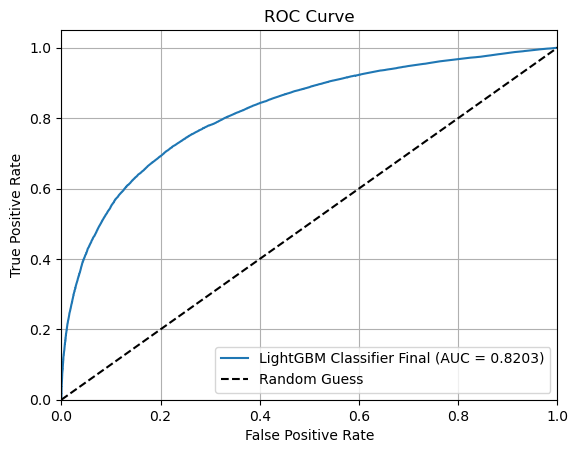

In [ ]:
plot_roc_curve(y_test_response, y_test_pred_probs, model_name="LightGBM Classifier Final")

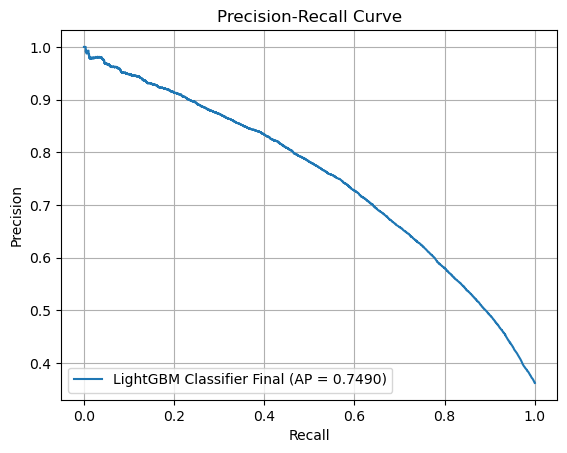

In [195]:
plot_precision_recall_curve(y_test_response, y_test_pred_probs, model_name="LightGBM Classifier Final")

#### Анализ важности признаков для итоговой модели LightGBM Classifier

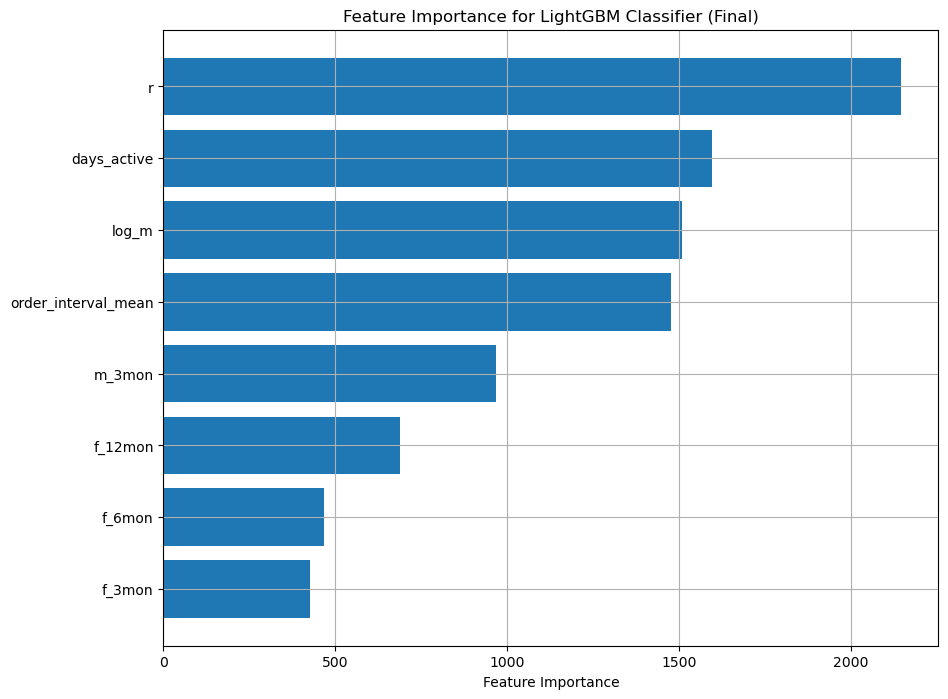

In [38]:
class_lgbm_final_importance = pd.DataFrame({
    'feature': X_train[selected_features_class_lgbm].columns,
    'importance': class_model_lgbm_final.feature_importances_
}).sort_values(by='importance', ascending=False)

plt.figure(figsize=(10, 8))
plt.barh(class_lgbm_final_importance['feature'], class_lgbm_final_importance['importance'])
plt.gca().invert_yaxis()
plt.xlabel('Feature Importance')
plt.title('Feature Importance for LightGBM Classifier (Final)')
plt.grid()
plt.show()

In [39]:
class_lgbm_final_importance

,feature,importance
1,r,2147
2,days_active,1596
3,log_m,1510
5,order_interval_mean,1476
7,m_3mon,968
4,f_12mon,687
0,f_6mon,468
6,f_3mon,426


/Users/demidzhivonos/anaconda3/lib/python3.11/site-packages/shap/explainers/_tree.py:544: UserWarning: LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray
  warnings.warn(


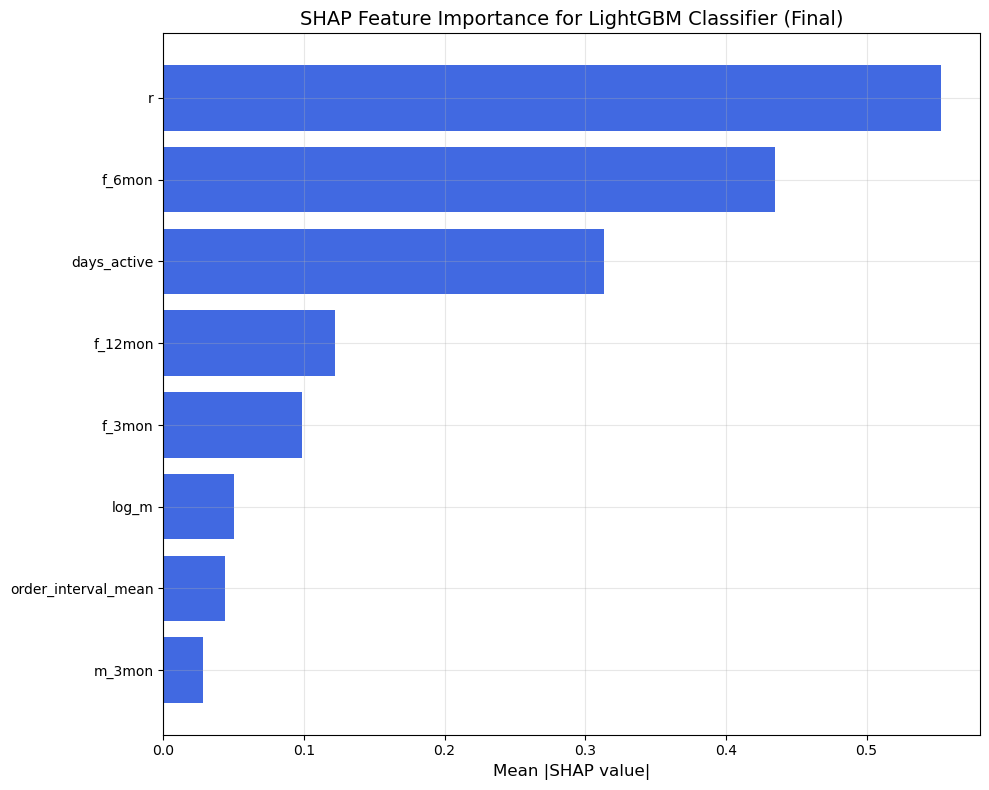

In [ ]:
shap_values_lgbm = explainer_lgbm.shap_values(X_test[selected_features_class_lgbm]) # type: ignore

if isinstance(shap_values_lgbm, list):
    shap_values_to_plot = shap_values_lgbm[1]  
else:
    shap_values_to_plot = shap_values_lgbm

mean_shap_vals = np.abs(shap_values_to_plot).mean(axis=0)
shap_importance_df = pd.DataFrame({
    'feature': X_test[selected_features_class_lgbm].columns,
    'mean_abs_shap': mean_shap_vals
}).sort_values(by='mean_abs_shap', ascending=False)

plt.figure(figsize=(10, 8))
plt.barh(shap_importance_df['feature'], shap_importance_df['mean_abs_shap'], color='royalblue')
plt.gca().invert_yaxis()
plt.xlabel('Mean |SHAP value|', fontsize=12)
plt.title('SHAP Feature Importance for LightGBM Classifier (Final)', fontsize=14)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

In [41]:
shap_importance_df

,feature,mean_abs_shap
1,r,0.553035
0,f_6mon,0.435251
2,days_active,0.313637
4,f_12mon,0.121920
6,f_3mon,0.098321
3,log_m,0.050352
5,order_interval_mean,0.043992
7,m_3mon,0.028522


#### Итоговая таблица с прогнозами ltv_response

In [45]:
df_class_results = pd.DataFrame({
    'client_id': pd.concat([train_client_ids, test_client_ids], ignore_index=True),
    'ltv_response': pd.concat([y_train_response, y_test_response], ignore_index=True),
    'ltv_response_pred': np.concatenate([y_train_pred_labels, y_test_pred_labels]),
    'ltv_response_prob': np.concatenate([y_train_pred_probs, y_test_pred_probs])
})

In [46]:
df_class_results

,client_id,ltv_response,ltv_response_pred,ltv_response_prob
0,358648,0,0,0.348165
1,123434,0,0,0.095960
2,308924,1,1,0.716952
3,128077,0,0,0.307396
4,142052,1,1,0.567251
...,...,...,...,...
386378,345193,0,0,0.239452
386379,371393,0,0,0.272429
386380,142188,0,0,0.095821
386381,306816,1,1,0.959353


## Final results of modeling LTV monetary and LTV response

In [125]:
df_clients_results = df_reg_results.merge(df_class_results, on='client_id')

In [126]:
df_clients_results.sort_values(by= 'ltv_monetary_error_abs')

,client_id,ltv_monetary,ltv_monetary_pred,ltv_monetary_error,ltv_monetary_error_abs,ltv_response,ltv_response_pred,ltv_response_prob
70957,188101,114.0,114.001595,0.001595,0.001595,1,0,0.123418
331382,194756,121.0,121.013435,0.013435,0.013435,1,0,0.097957
42650,70671,538.0,537.969238,-0.030762,0.030762,1,0,0.430595
8569,314201,1585.0,1584.959839,-0.040161,0.040161,1,1,0.870261
362708,408220,625.0,624.927429,-0.072571,0.072571,1,0,0.474546
...,...,...,...,...,...,...,...,...
165498,310293,44505.0,6707.103516,-37797.896484,37797.896484,1,1,0.790861
48222,401151,39962.0,1269.170776,-38692.829224,38692.829224,1,0,0.458208
158815,404182,54982.0,13678.832031,-41303.167969,41303.167969,1,1,0.904736
195339,342841,49722.0,4593.541504,-45128.458496,45128.458496,1,1,0.901982


In [127]:
df_clients_results.describe()

,client_id,ltv_monetary,ltv_monetary_pred,ltv_monetary_error,ltv_monetary_error_abs,ltv_response,ltv_response_pred,ltv_response_prob
count,386383.000000,386383.000000,386383.000000,386383.000000,386383.000000,386383.000000,386383.000000,386383.000000
mean,212494.577409,672.134594,671.520447,-0.614194,685.300231,0.360588,0.289619,0.360274
std,118093.213852,1671.947023,877.409424,1402.162088,1223.282991,0.480172,0.453586,0.267240
min,1.000000,0.000000,86.345886,-65611.558594,0.001595,0.000000,0.000000,0.051214
25%,111535.500000,0.000000,156.768295,104.538193,143.512070,0.000000,0.000000,0.124238
50%,214612.000000,0.000000,335.109100,170.895157,311.251709,0.000000,0.000000,0.266545
75%,315255.500000,638.000000,815.249756,409.635498,720.954742,1.000000,1.000000,0.559247
max,412450.000000,82951.000000,23400.613281,11810.820312,65611.558594,1.000000,1.000000,0.985434


#### Predictions analysis for monetary task

In [ ]:
fig1 = go.Figure()
fig1.add_trace(go.Histogram(
    x=df_clients_results['ltv_monetary'],
    name='Actual LTV monetary (RUB)',
    xbins=dict(
        start=0,
        end=5000,
        size=500  
        ),
    opacity=0.5,
    marker_color='steelblue'
))
fig1.add_trace(go.Histogram(
    x=df_clients_results['ltv_monetary_pred'],
    name='Predicted LTV monetary (RUB)',
    xbins=dict(
        start=0,
        end=5000,
        size=500 
        ),
    opacity=0.5,
    marker_color='orange'
))
fig1.update_layout(
    barmode='overlay',
    title='Distribution of Actual vs Predicted LTV monetary (Capped at 5000 RUB)',
    xaxis_title='LTV monetary (RUB)',
    yaxis_title='Number of clients',
    xaxis=dict(range=[0, 5000]),
    # yaxis_type='log',  
    legend=dict(x=0.7, y=0.95)
)
fig1.show()

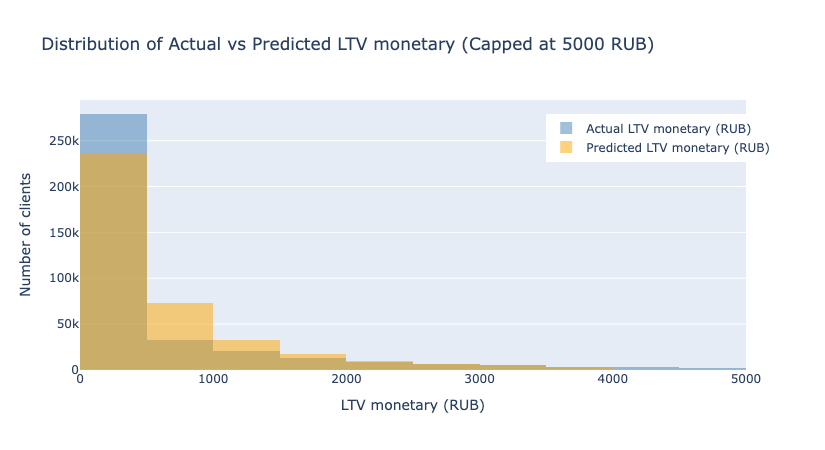

In [ ]:
Image(filename="figures/pic1.png")

In [ ]:
actual = df_clients_results['ltv_monetary']
predicted = df_clients_results['ltv_monetary_pred']

fig_kde = ff.create_distplot(
    [actual, predicted],
    group_labels=['Actual LTV', 'Predicted LTV'],
    show_hist=False,
    show_rug=False,
    colors=['steelblue', 'orange']
)
fig_kde.update_layout(
    title='KDE Plot: Actual vs Predicted LTV monetary',
    xaxis_title='LTV monetary (RUB)',
    yaxis_title='Density',
    xaxis=dict(range=[0, 1650])
)
fig_kde.show()


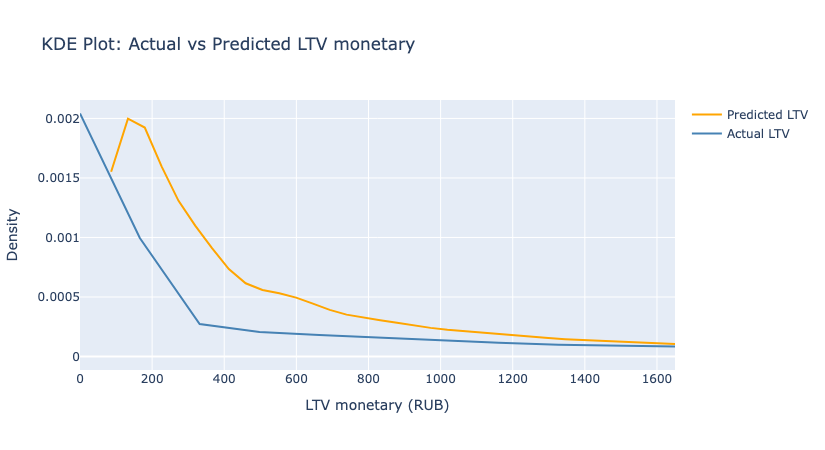

In [2]:
Image(filename="figures/pic2.png")

In [ ]:
def categorize_error(e):
    if e <= 500:
        return '≤ 500 RUB'
    elif e <= 1000:
        return '500–1000 RUB'
    elif e <= 2500:
        return '1000–2500 RUB'
    else:
        return '> 2500 RUB'

df_clients_results['error_group'] = df_clients_results['ltv_monetary_error_abs'].apply(categorize_error)

color_map = {
    '≤ 500 RUB': 'green',
    '500–1000 RUB': 'deepskyblue',
    '1000–2500 RUB': 'gold',
    '> 2500 RUB': 'crimson'
}

fig_scatter = go.Figure()

for group, color in color_map.items():
    df_subset = df_clients_results[df_clients_results['error_group'] == group]
    fig_scatter.add_trace(go.Scattergl(
        x=df_subset['ltv_monetary'],
        y=df_subset['ltv_monetary_pred'],
        mode='markers',
        marker=dict(color=color, size=3, opacity=0.7),
        name=group
    ))

max_val = max(df_clients_results['ltv_monetary'].max(), df_clients_results['ltv_monetary_pred'].max())
fig_scatter.add_trace(go.Scatter(
    x=[0, max_val],
    y=[0, max_val],
    mode='lines',
    line=dict(color='black', dash='dash'),
    name='Ideal prediction'
))

fig_scatter.update_layout(
    title='Actual vs Predicted LTV monetary (Grouped by Absolute Error)',
    xaxis_title='Actual LTV monetary (RUB)',
    yaxis_title='Predicted LTV monetary (RUB)',
    legend_title='Absolute Error Group',
    xaxis=dict(range=[0, 60000]),
    yaxis=dict(range=[0, 30000])
)

fig_scatter.show()

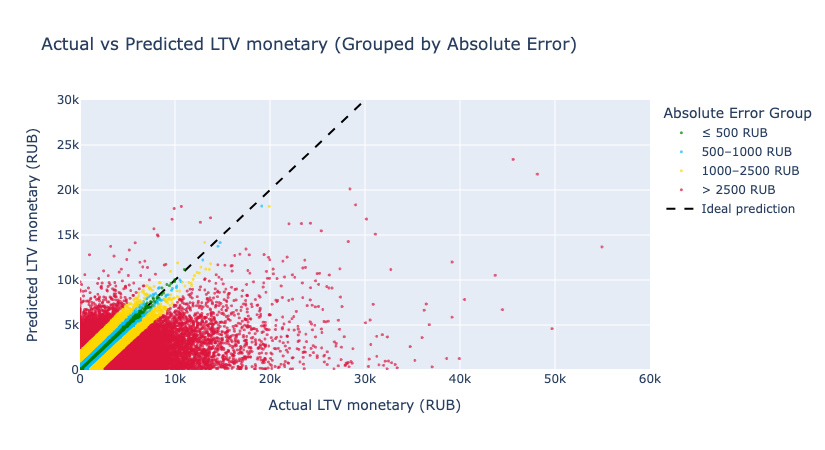

In [3]:
Image(filename="figures/pic3.png")

In [ ]:
fig_signed_error = go.Figure()

fig_signed_error.add_trace(go.Histogram(
    x=df_clients_results['ltv_monetary_error'],
    xbins=dict(
        size=50
    ),
    marker_color='indianred',
    opacity=0.85,
    name='Prediction error'
))

fig_signed_error.update_layout(
    title='Distribution of Prediction Error of LTV monetary',
    xaxis_title='Prediction error of LTV monetary (RUB)',
    yaxis_title='Number of clients',
    xaxis=dict(range=[-900, 900]),
    bargap=0.05,
    showlegend=False
)

fig_signed_error.show()

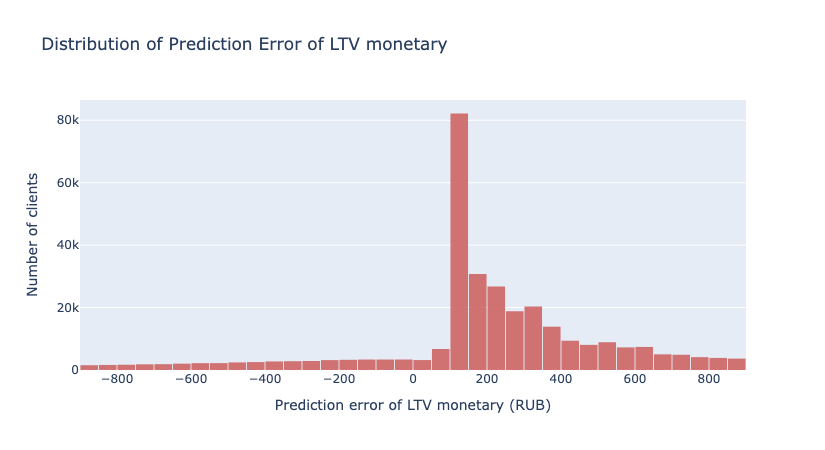

In [5]:
Image(filename="figures/pic4.png")

In [ ]:
fig_error = go.Figure()

fig_error.add_trace(go.Histogram(
    x=df_clients_results['ltv_monetary_error_abs'],
    xbins=dict(
        start=0,
        # end=1650,
        size=50 
    ),
    marker_color='indianred',
    opacity=0.85,
    name='Absolute error'
))

fig_error.update_layout(
    title='Distribution of Absolute Prediction Error of LTV monetary (Capped at 1650 RUB)',
    xaxis_title='Absolute error of LTV monetary (RUB)',
    yaxis_title='Number of clients',
    xaxis=dict(range=[0, 1650]),
    bargap=0.05,
    showlegend=False
)

fig_error.show()

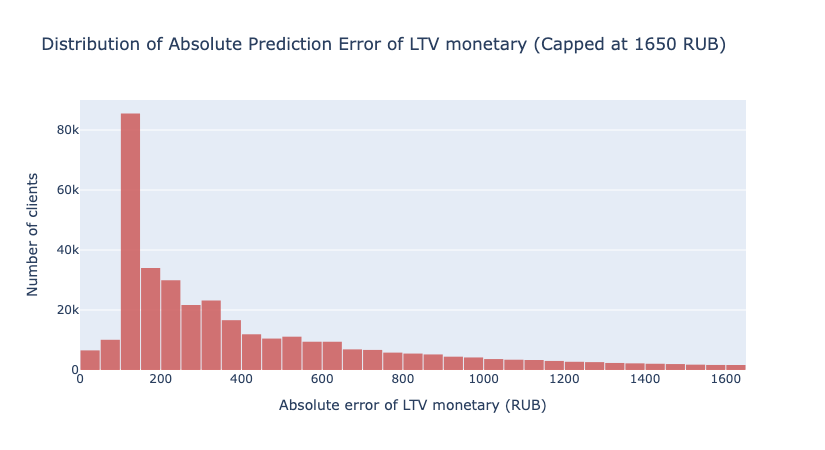

In [7]:
Image(filename="figures/pic5.png")

#### Predictions analysis for response task

In [ ]:
bin_edges = np.linspace(0, 1, 21)  
bin_centers = 0.5 * (bin_edges[:-1] + bin_edges[1:])
counts, _ = np.histogram(df_clients_results['ltv_response_prob'], bins=bin_edges)

colors = ['indianred' if center <= 0.5 else 'green' for center in bin_centers]

fig = go.Figure()

for i in range(len(bin_centers)):
    fig.add_trace(go.Bar(
        x=[bin_centers[i]],
        y=[counts[i]],
        width=bin_edges[1] - bin_edges[0],
        marker_color=colors[i],
        opacity=0.6,
        showlegend=False
    ))

fig.add_shape(
    type='line',
    x0=0.5, x1=0.5,
    y0=0, y1=max(counts) * 1.1,
    line=dict(color='black', dash='dash'),
    name='Threshold'
)

fig.update_layout(
    title='Distribution of Predicted Return Probability (Threshold at 0.5)',
    xaxis_title='Predicted probability of return',
    yaxis_title='Number of clients',
    xaxis=dict(range=[0, 1]),
    bargap=0.1
)

fig.show()

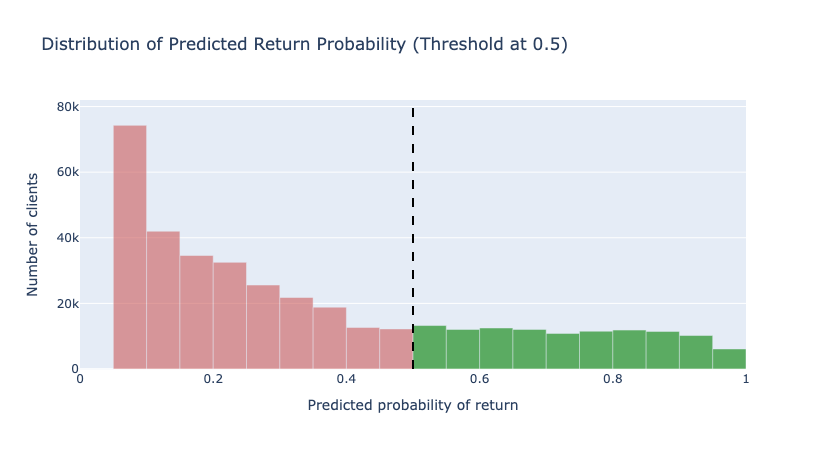

In [8]:
Image(filename="figures/pic6.png")

In [ ]:
df_box = df_clients_results.copy()
df_box['Return status'] = df_box['ltv_response'].map({0: 'Did not return', 1: 'Returned'})

fig_box = px.box(
    df_box,
    x='Return status',
    y='ltv_response_prob',
    color='Return status',
    category_orders={'Return status': ['Did not return', 'Returned']},
    title='Distribution of Predicted Return Probability by Actual Outcome',
    labels={
        'Return status': 'Actual return status',
        'ltv_response_prob': 'Predicted probability of return'
    },
    color_discrete_map={'Did not return': 'indianred', 'Returned': 'green'}
)

fig_box.update_layout(
    showlegend=False,
    yaxis=dict(range=[0, 1]),
    xaxis_title='Actual return status',
    yaxis_title='Predicted probability of return'
)

fig_box.show()

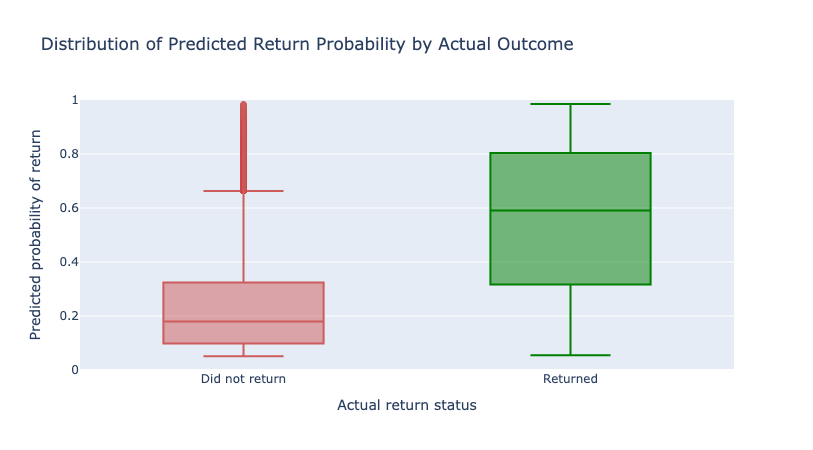

In [9]:
Image(filename="figures/pic7.png")

In [ ]:
cm = confusion_matrix(df_clients_results['ltv_response'], df_clients_results['ltv_response_pred'])
total = cm.sum()

labels = [['True Negatives', 'False Positives'], ['False Negatives', 'True Positives']]
x_labels = ['Predicted: No Return', 'Predicted: Return']
y_labels = ['Actual: No Return', 'Actual: Return']

z_text = [[f'{label}<br>{value:,} ({value / total:.1%})' 
           for label, value in zip(row_labels, row)] 
          for row_labels, row in zip(labels, cm)]

fig_cm = ff.create_annotated_heatmap(
    z=cm,
    x=x_labels,
    y=y_labels,
    annotation_text=z_text,
    colorscale='PuBu',
    showscale=True,
    reversescale=False
)

fig_cm.update_layout(
    title='Confusion Matrix for Return Prediction',
    xaxis_title='Predicted label',
    yaxis_title='True label'
)

fig_cm.show()

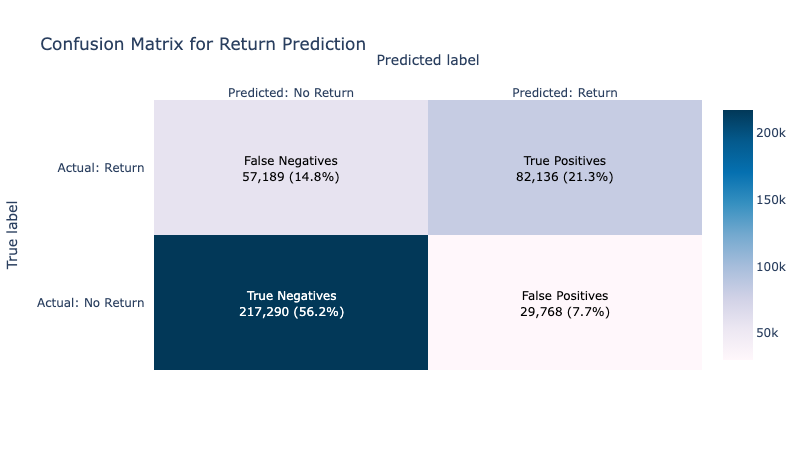

In [10]:
Image(filename="figures/pic8.png")

#### Segmentation Based on LTV Predictions 

In [ ]:
df_segmentation = df_clients_results.copy()

df_segmentation['LTV Segment'] = pd.cut(
    df_segmentation['ltv_monetary_pred'],
    bins=[-1, 300, 1000, float('inf')],
    labels=['Low LTV (≤300)', 'Medium LTV (300–1000)', 'High LTV (>1000)']
)

df_segmentation['Return Prob Segment'] = pd.cut(
    df_segmentation['ltv_response_prob'],
    bins=[-0.01, 0.35, 0.65, 1.0],
    labels=['Low Prob (≤0.35)', 'Medium Prob (0.35–0.65)', 'High Prob (>0.65)']
)

In [ ]:
ltv_counts = df_segmentation['LTV Segment'].value_counts(normalize=False).reindex([
    'Low LTV (≤300)', 'Medium LTV (300–1000)', 'High LTV (>1000)'
])
ltv_percent = (ltv_counts / ltv_counts.sum() * 100).round(1)

ltv_df_plot = pd.DataFrame({
    'Segment': ltv_counts.index,
    'Count': ltv_counts.values,
    'Percent': ltv_percent.values
})

fig_ltv = px.bar(
    ltv_df_plot,
    x='Segment',
    y='Count',
    color='Segment',
    opacity = 0.7,
    text=ltv_df_plot['Percent'].astype(str) + '%',
    title='Client Distribution by Predicted LTV Segment',
    color_discrete_map={
        'Low LTV (≤300)': 'indianred',
        'Medium LTV (300–1000)': 'orange',
        'High LTV (>1000)': 'green'
    }
)
fig_ltv.update_traces(textposition='outside')
fig_ltv.update_layout(
    xaxis_title='Predicted LTV Segment',
    yaxis_title='Number of clients',
    showlegend=False
)
fig_ltv.show()


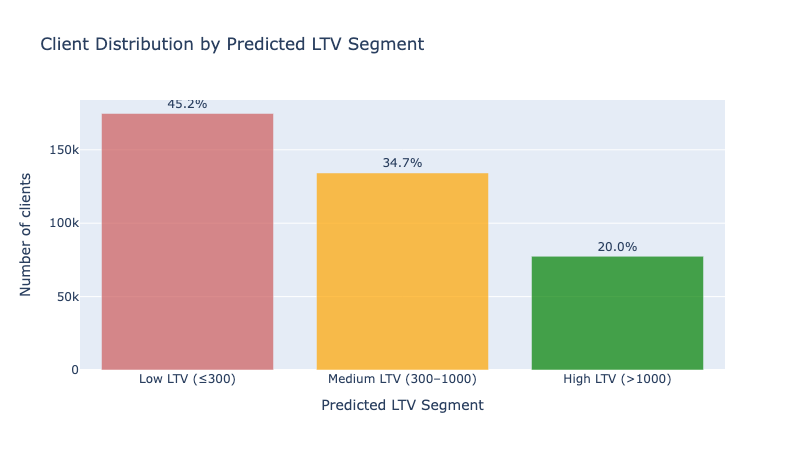

In [11]:
Image(filename="figures/pic9.png")

In [ ]:
prob_counts = df_segmentation['Return Prob Segment'].value_counts(normalize=False).reindex([
    'Low Prob (≤0.35)', 'Medium Prob (0.35–0.65)', 'High Prob (>0.65)'
])
prob_percent = (prob_counts / prob_counts.sum() * 100).round(1)

prob_df_plot = pd.DataFrame({
    'Segment': prob_counts.index,
    'Count': prob_counts.values,
    'Percent': prob_percent.values
})

fig_prob = px.bar(
    prob_df_plot,
    x='Segment',
    y='Count',
    color='Segment',
    opacity=0.7,
    text=prob_df_plot['Percent'].astype(str) + '%',
    title='Client Distribution by Predicted Return Probability Segment',
    color_discrete_map={
        'Low Prob (≤0.35)': 'indianred',
        'Medium Prob (0.35–0.65)': 'orange',
        'High Prob (>0.65)': 'green'
    }
)
fig_prob.update_traces(textposition='outside')
fig_prob.update_layout(
    xaxis_title='Predicted Return Probability Segment',
    yaxis_title='Number of clients',
    showlegend=False
)
fig_prob.show()


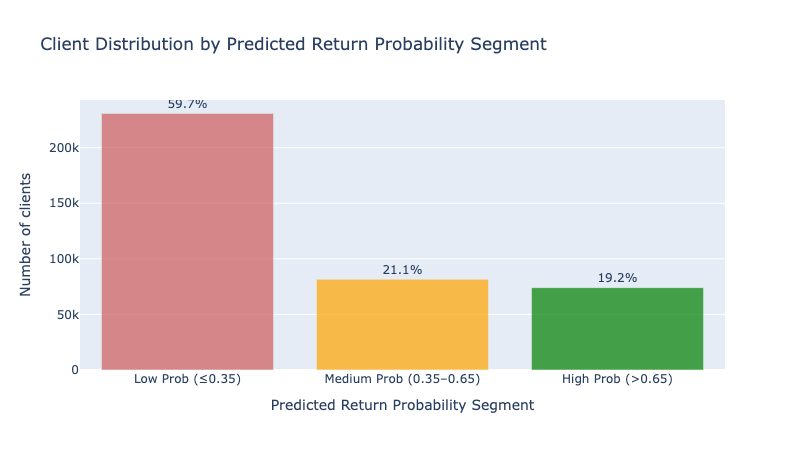

In [12]:
Image(filename="figures/pic10.png")

In [ ]:
segmentation_matrix = df_segmentation.pivot_table(
    index='LTV Segment',
    columns='Return Prob Segment',
    values='client_id',
    aggfunc='count',
    fill_value=0
)
segmentation_matrix_percent = segmentation_matrix / segmentation_matrix.values.sum() * 100
segmentation_matrix_percent = segmentation_matrix_percent.round(1)

text_matrix = segmentation_matrix.astype(str) + '<br>(' + segmentation_matrix_percent.astype(str) + '%)'

fig = go.Figure(data=go.Heatmap(
    z=segmentation_matrix.values,
    x=segmentation_matrix.columns.tolist(),
    y=segmentation_matrix.index.tolist(),
    text=text_matrix.values,
    texttemplate="%{text}",
    textfont={"size":12},
    colorscale='YlGnBu',
    colorbar=dict(title='Number of clients'),
    xgap=3,  
    ygap=3   
))

fig.update_layout(
    title='Client Segmentation Matrix: Number of clients and share',
    xaxis_title='Predicted Return Probability Segment',
    yaxis_title='Predicted LTV Segment'
)

fig.show()

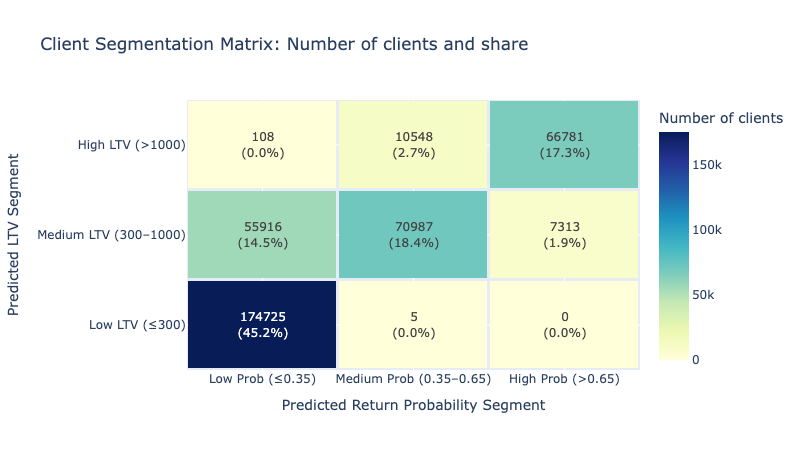

In [13]:
Image(filename="figures/pic11.png")

In [ ]:
revenue_matrix = df_segmentation.pivot_table(
    index='LTV Segment',
    columns='Return Prob Segment',
    values='ltv_monetary_pred',
    aggfunc='sum',
    fill_value=0
)

revenue_matrix_percent = revenue_matrix / revenue_matrix.values.sum() * 100
revenue_matrix_percent = revenue_matrix_percent.round(1)

text_matrix_revenue = revenue_matrix.applymap(lambda x: f"{int(round(x)):,}".replace(",", " ")) + \
                      '<br>(' + revenue_matrix_percent.astype(str) + '%)'

fig_revenue = go.Figure(data=go.Heatmap(
    z=revenue_matrix.values,
    x=revenue_matrix.columns.tolist(),
    y=revenue_matrix.index.tolist(),
    text=text_matrix_revenue.values,
    texttemplate="%{text}",
    textfont={"size":12},
    colorscale='Greens',
    colorbar=dict(title='Sum of predicted LTV'),
    xgap=2,
    ygap=2
))

fig_revenue.update_layout(
    title='Total Predicted Revenue by Segment (RUB and %)',
    xaxis_title='Predicted Return Probability Segment',
    yaxis_title='Predicted LTV Segment'
)

fig_revenue.show()

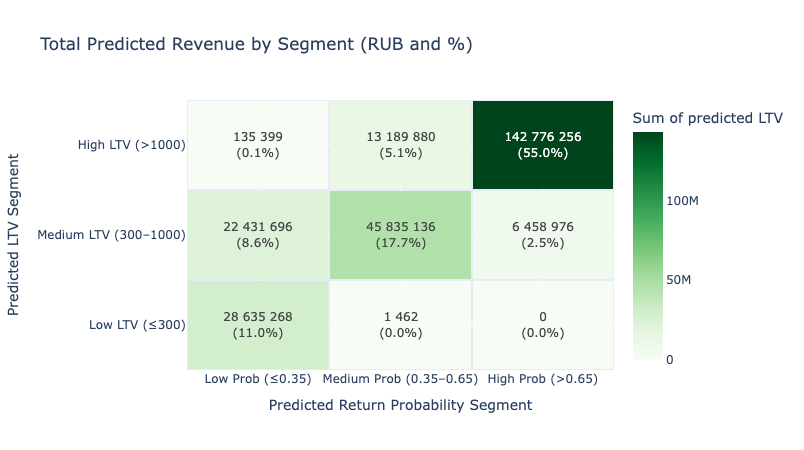

In [14]:
Image(filename="figures/pic12.png")

In [ ]:
df_table = df_segmentation.groupby(['LTV Segment', 'Return Prob Segment']).agg(
    clients=('client_id', 'count'),
    ltv_total=('ltv_monetary', 'sum'),
    ltv_mean=('ltv_monetary', 'mean')
).reset_index()

df_table['client_share_%'] = (df_table['clients'] / df_table['clients'].sum() * 100).round(1)
df_table['ltv_share_%'] = (df_table['ltv_total'] / df_table['ltv_total'].sum() * 100).round(1)

ltv_map = {
    'Low LTV (≤300)': 'LTV_L',
    'Medium LTV (300–1000)': 'LTV_M',
    'High LTV (>1000)': 'LTV_H'
}
prob_map = {
    'Low Prob (≤0.35)': 'P_L',
    'Medium Prob (0.35–0.65)': 'P_M',
    'High Prob (>0.65)': 'P_H'
}

df_table['segment_short'] = (
    df_table['LTV Segment'].astype(str).map(ltv_map) + ' / ' +
    df_table['Return Prob Segment'].astype(str).map(prob_map)
)

fig_bar_compare_named = px.bar(
    df_table.sort_values('ltv_share_%', ascending=False),
    x='segment_short',
    y=['client_share_%', 'ltv_share_%'],
    barmode='group',
    title='Client Share vs Revenue Share by Segment <br>(LTV Monetary prediciton/ Response Probability prediction)',
    labels={'value': 'Percentage (%)', 'segment_short': 'Segment'},
    text_auto=True,
    color_discrete_sequence=['coral', 'lightseagreen'],
    opacity=0.7
)

fig_bar_compare_named.update_layout(xaxis_tickangle=30)
fig_bar_compare_named.show()

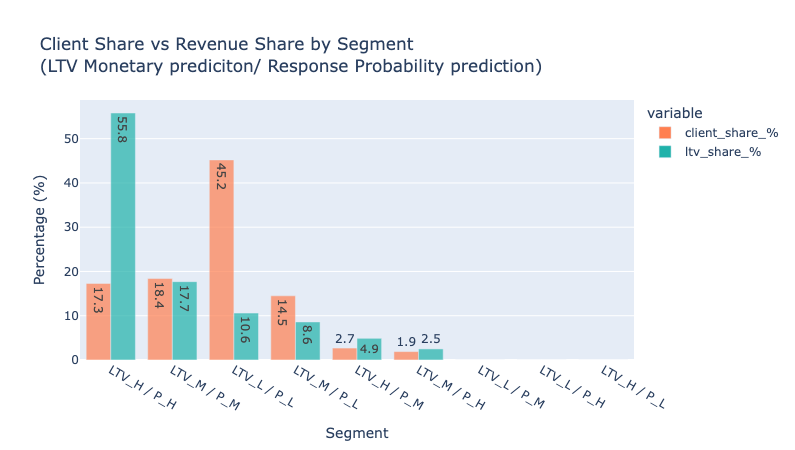

In [15]:
Image(filename="figures/pic13.png")